# Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.model_selection import KFold
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, Dense, Dropout, GRU, Input, Conv1D, InputLayer
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.regularizers import l2
from tensorflow.keras import Input, Model
import keras_tuner as kt
from sklearn.model_selection import TimeSeriesSplit
from itertools import product
from math import sqrt
from concurrent.futures import ThreadPoolExecutor
from decimal import Decimal
from tcn import TCN
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint

In [2]:
print(tf.__version__)

2.18.0


# Project

## Import Dataset

In [3]:
raw_data = pd.read_csv("TrafficVolume.csv")

In [4]:
raw_data.head()

,date_time,is_holiday,air_pollution_index,humidity,wind_speed,wind_direction,visibility_in_miles,dew_point,temperature,rain_p_h,snow_p_h,clouds_all,weather_type,weather_description,traffic_volume
0,2012-10-02 09:00:00,NaN,121,89,2,329,1,1,288.28,0.0,0.0,40,Clouds,scattered clouds,5545
1,2012-10-02 10:00:00,NaN,178,67,3,330,1,1,289.36,0.0,0.0,75,Clouds,broken clouds,4516
2,2012-10-02 11:00:00,NaN,113,66,3,329,2,2,289.58,0.0,0.0,90,Clouds,overcast clouds,4767
3,2012-10-02 12:00:00,NaN,20,66,3,329,5,5,290.13,0.0,0.0,90,Clouds,overcast clouds,5026
4,2012-10-02 13:00:00,NaN,281,65,3,329,7,7,291.14,0.0,0.0,75,Clouds,broken clouds,4918


In [5]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33750 entries, 0 to 33749
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   date_time            33750 non-null  object 
 1   is_holiday           43 non-null     object 
 2   air_pollution_index  33750 non-null  int64  
 3   humidity             33750 non-null  int64  
 4   wind_speed           33750 non-null  int64  
 5   wind_direction       33750 non-null  int64  
 6   visibility_in_miles  33750 non-null  int64  
 7   dew_point            33750 non-null  int64  
 8   temperature          33750 non-null  float64
 9   rain_p_h             33750 non-null  float64
 10  snow_p_h             33750 non-null  float64
 11  clouds_all           33750 non-null  int64  
 12  weather_type         33750 non-null  object 
 13  weather_description  33750 non-null  object 
 14  traffic_volume       33750 non-null  int64  
dtypes: float64(3), int64(8), object(4)
m

In [6]:
raw_data['is_holiday'].nunique()

11

In [7]:
raw_data['weather_description'].nunique()

38

In [8]:
raw_data['weather_type'].nunique()

11

## Preprocess

In [9]:
# Convert it to datetime format
raw_data['date_time'] = pd.to_datetime(raw_data['date_time'])

# Set 'date_time' as the index
raw_data.set_index('date_time', inplace = True)

In [10]:
raw_data.head()

,is_holiday,air_pollution_index,humidity,wind_speed,wind_direction,visibility_in_miles,dew_point,temperature,rain_p_h,snow_p_h,clouds_all,weather_type,weather_description,traffic_volume
date_time,,,,,,,,,,,,,,
2012-10-02 09:00:00,NaN,121,89,2,329,1,1,288.28,0.0,0.0,40,Clouds,scattered clouds,5545
2012-10-02 10:00:00,NaN,178,67,3,330,1,1,289.36,0.0,0.0,75,Clouds,broken clouds,4516
2012-10-02 11:00:00,NaN,113,66,3,329,2,2,289.58,0.0,0.0,90,Clouds,overcast clouds,4767
2012-10-02 12:00:00,NaN,20,66,3,329,5,5,290.13,0.0,0.0,90,Clouds,overcast clouds,5026
2012-10-02 13:00:00,NaN,281,65,3,329,7,7,291.14,0.0,0.0,75,Clouds,broken clouds,4918


In [11]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 33750 entries, 2012-10-02 09:00:00 to 2017-05-17 23:00:00
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   is_holiday           43 non-null     object 
 1   air_pollution_index  33750 non-null  int64  
 2   humidity             33750 non-null  int64  
 3   wind_speed           33750 non-null  int64  
 4   wind_direction       33750 non-null  int64  
 5   visibility_in_miles  33750 non-null  int64  
 6   dew_point            33750 non-null  int64  
 7   temperature          33750 non-null  float64
 8   rain_p_h             33750 non-null  float64
 9   snow_p_h             33750 non-null  float64
 10  clouds_all           33750 non-null  int64  
 11  weather_type         33750 non-null  object 
 12  weather_description  33750 non-null  object 
 13  traffic_volume       33750 non-null  int64  
dtypes: float64(3), int64(8), object(3)
memory usage: 3.

### One Hot encode

In [12]:
df_is_holiday = pd.get_dummies(raw_data['is_holiday'])

df_is_holiday.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 33750 entries, 2012-10-02 09:00:00 to 2017-05-17 23:00:00
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype
---  ------                     --------------  -----
 0   Christmas Day              33750 non-null  bool 
 1   Columbus Day               33750 non-null  bool 
 2   Independence Day           33750 non-null  bool 
 3   Labor Day                  33750 non-null  bool 
 4   Martin Luther King Jr Day  33750 non-null  bool 
 5   Memorial Day               33750 non-null  bool 
 6   New Years Day              33750 non-null  bool 
 7   State Fair                 33750 non-null  bool 
 8   Thanksgiving Day           33750 non-null  bool 
 9   Veterans Day               33750 non-null  bool 
 10  Washingtons Birthday       33750 non-null  bool 
dtypes: bool(11)
memory usage: 626.2 KB


In [13]:
df_weather_type = pd.get_dummies(raw_data['weather_type'])

df_weather_type.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 33750 entries, 2012-10-02 09:00:00 to 2017-05-17 23:00:00
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   Clear         33750 non-null  bool 
 1   Clouds        33750 non-null  bool 
 2   Drizzle       33750 non-null  bool 
 3   Fog           33750 non-null  bool 
 4   Haze          33750 non-null  bool 
 5   Mist          33750 non-null  bool 
 6   Rain          33750 non-null  bool 
 7   Smoke         33750 non-null  bool 
 8   Snow          33750 non-null  bool 
 9   Squall        33750 non-null  bool 
 10  Thunderstorm  33750 non-null  bool 
dtypes: bool(11)
memory usage: 626.2 KB


In [14]:
df_weather_description = pd.get_dummies(raw_data['weather_description'])

df_weather_description.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 33750 entries, 2012-10-02 09:00:00 to 2017-05-17 23:00:00
Data columns (total 38 columns):
 #   Column                               Non-Null Count  Dtype
---  ------                               --------------  -----
 0   SQUALLS                              33750 non-null  bool 
 1   Sky is Clear                         33750 non-null  bool 
 2   broken clouds                        33750 non-null  bool 
 3   drizzle                              33750 non-null  bool 
 4   few clouds                           33750 non-null  bool 
 5   fog                                  33750 non-null  bool 
 6   freezing rain                        33750 non-null  bool 
 7   haze                                 33750 non-null  bool 
 8   heavy intensity drizzle              33750 non-null  bool 
 9   heavy intensity rain                 33750 non-null  bool 
 10  heavy snow                           33750 non-null  bool 
 11  light intensity dri

Concat new dataframes

In [15]:
df_processed = pd.concat([raw_data, df_is_holiday, df_weather_type, df_weather_description], axis = 1)

df_processed.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 33750 entries, 2012-10-02 09:00:00 to 2017-05-17 23:00:00
Data columns (total 74 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   is_holiday                           43 non-null     object 
 1   air_pollution_index                  33750 non-null  int64  
 2   humidity                             33750 non-null  int64  
 3   wind_speed                           33750 non-null  int64  
 4   wind_direction                       33750 non-null  int64  
 5   visibility_in_miles                  33750 non-null  int64  
 6   dew_point                            33750 non-null  int64  
 7   temperature                          33750 non-null  float64
 8   rain_p_h                             33750 non-null  float64
 9   snow_p_h                             33750 non-null  float64
 10  clouds_all                           33750 non-null  int64 

Drop object features

In [16]:
df_processed.drop(columns = ['is_holiday', 'weather_type', 'weather_description'], inplace = True)

df_processed.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 33750 entries, 2012-10-02 09:00:00 to 2017-05-17 23:00:00
Data columns (total 71 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   air_pollution_index                  33750 non-null  int64  
 1   humidity                             33750 non-null  int64  
 2   wind_speed                           33750 non-null  int64  
 3   wind_direction                       33750 non-null  int64  
 4   visibility_in_miles                  33750 non-null  int64  
 5   dew_point                            33750 non-null  int64  
 6   temperature                          33750 non-null  float64
 7   rain_p_h                             33750 non-null  float64
 8   snow_p_h                             33750 non-null  float64
 9   clouds_all                           33750 non-null  int64  
 10  traffic_volume                       33750 non-null  int64 

Move target column to the end for convenience

In [17]:
df_target = df_processed['traffic_volume']

df_target

date_time
2012-10-02 09:00:00    5545
2012-10-02 10:00:00    4516
2012-10-02 11:00:00    4767
2012-10-02 12:00:00    5026
2012-10-02 13:00:00    4918
                       ... 
2017-05-17 21:00:00    2348
2017-05-17 22:00:00    2194
2017-05-17 22:00:00    2194
2017-05-17 23:00:00    1328
2017-05-17 23:00:00    1328
Name: traffic_volume, Length: 33750, dtype: int64

In [18]:
df_processed.drop(columns = ['traffic_volume'], inplace = True)

df_processed['traffic_volume'] = df_target

df_processed.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 33750 entries, 2012-10-02 09:00:00 to 2017-05-17 23:00:00
Data columns (total 71 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   air_pollution_index                  33750 non-null  int64  
 1   humidity                             33750 non-null  int64  
 2   wind_speed                           33750 non-null  int64  
 3   wind_direction                       33750 non-null  int64  
 4   visibility_in_miles                  33750 non-null  int64  
 5   dew_point                            33750 non-null  int64  
 6   temperature                          33750 non-null  float64
 7   rain_p_h                             33750 non-null  float64
 8   snow_p_h                             33750 non-null  float64
 9   clouds_all                           33750 non-null  int64  
 10  Christmas Day                        33750 non-null  bool  

In [19]:
print(df_processed)


                     air_pollution_index  humidity  wind_speed  \
date_time                                                        
2012-10-02 09:00:00                  121        89           2   
2012-10-02 10:00:00                  178        67           3   
2012-10-02 11:00:00                  113        66           3   
2012-10-02 12:00:00                   20        66           3   
2012-10-02 13:00:00                  281        65           3   
...                                  ...       ...         ...   
2017-05-17 21:00:00                   74        85           1   
2017-05-17 22:00:00                   81        70           1   
2017-05-17 22:00:00                  138        70           1   
2017-05-17 23:00:00                  229        66           1   
2017-05-17 23:00:00                  140        63           1   

                     wind_direction  visibility_in_miles  dew_point  \
date_time                                                             

### Filtered

In [20]:
# Define the start date after the gap
start_date = '2016-01-01 00:00:00'

# Filter the data to include only rows from the start date onwards
df_filtered = df_processed[df_processed.index >= start_date]

# Verify the filtered data
print(df_filtered.info())
print(df_filtered.head())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 13406 entries, 2016-01-01 00:00:00 to 2017-05-17 23:00:00
Data columns (total 71 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   air_pollution_index                  13406 non-null  int64  
 1   humidity                             13406 non-null  int64  
 2   wind_speed                           13406 non-null  int64  
 3   wind_direction                       13406 non-null  int64  
 4   visibility_in_miles                  13406 non-null  int64  
 5   dew_point                            13406 non-null  int64  
 6   temperature                          13406 non-null  float64
 7   rain_p_h                             13406 non-null  float64
 8   snow_p_h                             13406 non-null  float64
 9   clouds_all                           13406 non-null  int64  
 10  Christmas Day                        13406 non-null  bool  

In [21]:
# Ensure 'date_time' is the index and in datetime format
df_filtered.index = pd.to_datetime(df_filtered.index)

# Step 1: Extract date and hour from the index
df_filtered['date_only'] = df_filtered.index.date  # Extract date part
df_filtered['hour'] = df_filtered.index.hour      # Extract hour part

# Step 2: Group by 'date_only' and 'hour' and take the mean for duplicates
df_processed = df_filtered.groupby(['date_only', 'hour']).mean().reset_index()

# Step 3: Apply rounding to relevant columns
columns_to_round = {
    'air_pollution_index': 0,
    'humidity': 0,
    'wind_speed': 0,
    'wind_direction': 0,
    'visibility_in_miles': 0,
    'temperature': 2,
    'rain_p_h': 0,
    'snow_p_h': 0,
    'clouds_all': 0,
    'traffic_volume': 0,
}

for col, decimals in columns_to_round.items():
    if col in df_processed.columns:  # Only apply to existing columns
        df_processed[col] = df_processed[col].apply(lambda x: round(x, decimals))

# Step 4: Rebuild the full datetime index
df_processed['date_time'] = pd.to_datetime(df_processed['date_only']) + pd.to_timedelta(df_processed['hour'], unit='h')
df_processed.set_index('date_time', inplace=True)

# Step 5: Drop redundant columns
df_processed = df_processed.drop(columns=['date_only', 'hour'])

# Step 6: Ensure hourly timestamps are complete and fill missing values
df_processed = df_processed.asfreq('H')  # Enforce hourly frequency
df_processed.fillna(method='ffill', inplace=True)  # Forward-fill missing values


C:\Users\Francisco\AppData\Local\Temp\ipykernel_41244\721098811.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['date_only'] = df_filtered.index.date  # Extract date part
C:\Users\Francisco\AppData\Local\Temp\ipykernel_41244\721098811.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['hour'] = df_filtered.index.hour      # Extract hour part
C:\Users\Francisco\AppData\Local\Temp\ipykernel_41244\721098811.py:38: FutureWarning: DataFrame.fillna with 'method' is deprecated and will

In [22]:
df_processed.head()

,air_pollution_index,humidity,wind_speed,wind_direction,visibility_in_miles,dew_point,temperature,rain_p_h,snow_p_h,clouds_all,...,smoke,snow,thunderstorm,thunderstorm with drizzle,thunderstorm with heavy rain,thunderstorm with light drizzle,thunderstorm with light rain,thunderstorm with rain,very heavy rain,traffic_volume
date_time,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00,209.0,88.0,4.0,335.0,2.0,2.0,265.94,0.0,0.0,90.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1513.0
2016-01-01 01:00:00,257.0,87.0,3.0,345.0,8.0,8.0,266.00,0.0,0.0,90.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1550.0
2016-01-01 02:00:00,257.0,87.0,3.0,345.0,8.0,8.0,266.00,0.0,0.0,90.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1550.0
2016-01-01 03:00:00,208.0,90.0,3.0,344.0,8.0,8.0,266.01,0.0,0.0,90.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,719.0
2016-01-01 04:00:00,85.0,89.0,2.0,350.0,4.0,4.0,264.80,0.0,0.0,90.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,533.0


### Scale

In [23]:
scaler = StandardScaler()
scaler = scaler.fit(df_processed)
df_processed_scaled = scaler.transform(df_processed)

df_processed_scaled

array([[ 0.68505859,  1.06425737,  0.20970104, ..., -0.01545382,
        -0.01919476, -0.89800998],
       [ 1.28568062,  1.00821523, -0.29358146, ..., -0.01545382,
        -0.01919476, -0.87925288],
       [ 1.28568062,  1.00821523, -0.29358146, ..., -0.01545382,
        -0.01919476, -0.87925288],
       ...,
       [-0.39105588,  0.89613097, -1.30014647, ..., -0.01545382,
        -0.01919476, -0.47470789],
       [-0.55372435,  0.05549898, -1.30014647, ..., -0.01545382,
        -0.01919476, -0.55277798],
       [ 0.37223462, -0.28075381, -1.30014647, ..., -0.01545382,
        -0.01919476, -0.99179547]])

### Divide

In [76]:
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset) - time_step - 1):
        a = dataset[i:(i + time_step), :-1]  # Use all columns except the last for features
        dataX.append(a)
        dataY.append(dataset[i + time_step, -1])  # Use the last column as the target
    return np.array(dataX), np.array(dataY)

# Splitting data into train and test sets
train_size = int(len(df_processed_scaled) * 0.9)
test_size = len(df_processed_scaled) - train_size
train_data, test_data = df_processed_scaled[0:train_size, :], df_processed_scaled[train_size:, :]

# Splitting training data into train and validation sets (90% of train_data for training, 10% for validation)
val_size = int(len(train_data) * 0.1)
val_data, train_data = train_data[-val_size:, :], train_data[:-val_size, :]

time_step = 48

# Create datasets
X_train, Y_train = create_dataset(train_data, time_step)
X_val, Y_val = create_dataset(val_data, time_step)
X_test, Y_test = create_dataset(test_data, time_step)

In [77]:
print(f"trainX shape: {X_train.shape}, trainY shape: {Y_train.shape}")
print(f"valX shape: {X_val.shape}, valY shape: {Y_val.shape}")
print(f"testX shape: {X_test.shape}, testY shape: {Y_test.shape}")

trainX shape: (10815, 48, 70), trainY shape: (10815,)
testX shape: (1159, 48, 70), testY shape: (1159,)


In [24]:
# Splitting data into train and test sets (90% train, 10% test)
train_size = int(len(df_processed_scaled) * 0.9)
train_data, test_data = df_processed_scaled[:train_size, :], df_processed_scaled[train_size:, :]

# Separating features and target
X_train, Y_train = train_data[:, :-1], train_data[:, -1]  # All columns except last for features, last column for target
X_test, Y_test = test_data[:, :-1], test_data[:, -1]

## LSTM 2

In [ ]:
# Define possible hyperparameters
unit_options = [32, 64]
learning_rates = [0.00001, 0.00005, 0.0001]
dropout_rates = [0.2, 0.5]
optimizers = [Adam, RMSprop]
activation_functions = ['relu', 'tanh']
layer_options = [1, 2, 3]

# Cross-validation setup
kf = KFold(n_splits=3, shuffle = True, random_state = 42)

# Function to create the model based on hyperparameters
def create_model(layers, units, optimizer, lr, dropout_rate, activation, input_shape):
    model = Sequential()
    
    # First layer
    model.add(LSTM(units[0], return_sequences=True, input_shape=input_shape, activation=activation))
    model.add(Dropout(dropout_rate))

    # Additional layers
    for i in range(1, layers):
        model.add(LSTM(units[i], return_sequences=(i < layers - 1), activation=activation))
        model.add(Dropout(dropout_rate))

    model.add(Dense(1))
    
    # Compile the model
    model.compile(loss=MeanSquaredError(), optimizer=optimizer(learning_rate=lr), metrics=[RootMeanSquaredError()])
    
    return model

# Function for the cross-validation process
def cross_validate(X_train, Y_train):
    best_model = None
    best_val_loss = float('inf')
    best_params = None

    # Iterate through all combinations of hyperparameters
    for layers in layer_options:  # Test for 1, 2, or 3 layers
        for optimizer in optimizers:
            for lr in learning_rates:
                for dropout_rate in dropout_rates:
                    for activation in activation_functions:
                        # Generate the correct number of units based on layers
                        if layers == 1:
                            units = [unit_options[0]]  # 1 unit choice
                        elif layers == 2:
                            for units1 in unit_options:
                                for units2 in unit_options:
                                    if units2 <= units1:
                                        units = [units1, units2]
                                        break  # No need to continue for invalid combinations
                                else:
                                    continue  # Skip if no valid combination found
                                break
                        elif layers == 3:
                            for units1 in unit_options:
                                for units2 in unit_options:
                                    for units3 in unit_options:
                                        if units2 <= units1 and units3 <= units2:
                                            units = [units1, units2, units3]
                                            break
                                    else:
                                        continue
                                    break
                                else:
                                    continue
                                break

                        # Cross-validation loop
                        fold_val_losses = []
                        for train_idx, val_idx in kf.split(X_train):
                            X_train_fold, X_val_fold = X_train[train_idx], X_train[val_idx]
                            Y_train_fold, Y_val_fold = Y_train[train_idx], Y_train[val_idx]

                            # Create the model
                            model = create_model(layers, units, optimizer, lr, dropout_rate, activation, (X_train.shape[1], X_train.shape[2]))

                            # Define model checkpoint callback
                            cp = ModelCheckpoint(f'./best_models/model_layers_{layers}_units_{units}_opt_{optimizer.__name__}_lr_{lr}_drop_{dropout_rate}_act_{activation}.keras', 
                                                 save_best_only=True, monitor='val_loss', mode='min', verbose=1)

                            # Fit the model with cross-validation
                            history = model.fit(X_train_fold, Y_train_fold, validation_data=(X_val_fold, Y_val_fold), epochs=50, batch_size=16,
                                                verbose=1, callbacks=[cp])

                            # Store the validation loss of the fold
                            fold_val_losses.append(history.history['val_loss'][-1])
                        
                        # Calculate average validation loss across all folds
                        avg_val_loss = np.mean(fold_val_losses)
                        
                        # Check if this model has the best validation loss
                        if avg_val_loss < best_val_loss:
                            best_val_loss = avg_val_loss
                            best_model = model
                            best_params = {
                                'layers': layers,
                                'units': units,
                                'optimizer': optimizer.__name__,
                                'learning_rate': lr,
                                'dropout_rate': dropout_rate,
                                'activation': activation
                            }

    # Display best parameters and validation loss
    print("Best model parameters:", best_params)
    print("Best average validation loss:", best_val_loss)

    return best_model

# Example usage:
best_model = cross_validate(X_train, Y_train)

Epoch 1/50


C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.6093 - root_mean_squared_error: 1.2683
Epoch 1: val_loss improved from inf to 1.52260, saving model to ./best_models/model_layers_1_units_[32]_opt_Adam_lr_1e-05_drop_0.2_act_relu.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 1.6086 - root_mean_squared_error: 1.2680 - val_loss: 1.5226 - val_root_mean_squared_error: 1.2339
Epoch 2/50
443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.4090 - root_mean_squared_error: 1.1869
Epoch 2: val_loss improved from 1.52260 to 1.39345, saving model to ./best_models/model_layers_1_units_[32]_opt_Adam_lr_1e-05_drop_0.2_act_relu.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 1.4091 - root_mean_squared_error: 1.1870 - val_loss: 1.3935 - val_root_mean_squared_error: 1.1804
Epoch 3/50
443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.3475 - root_mean_squared_error: 1.1607
Epoch 3: val_loss improved from 1.39345 to 1.30430, saving model to ./best_models/model_layers_1_units_[32]_opt_Adam_l

In [539]:
# Define the number of splits
n_splits = 5

# Initialize TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=n_splits)

# Define your evaluation metrics
def calculate_metrics(y_true, y_pred):
    mse = np.mean((y_true - y_pred) ** 2)
    rmse = np.sqrt(mse)
    mae = np.mean(np.abs(y_true - y_pred))
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    r2 = 1 - np.sum((y_true - y_pred) ** 2) / np.sum((y_true - np.mean(y_true)) ** 2)
    return mse, rmse, mae, mape, r2


for fold, (train_idx, test_idx) in enumerate(tscv.split(X_train)):
    print(f"Training fold {fold + 1}...")

    # Split the data into training and validation sets for this fold
    X_train_fold, X_val_fold = X_train[train_idx], X_train[test_idx]
    Y_train_fold, Y_val_fold = Y_train[train_idx], Y_train[test_idx]
    
    # Build the model
    model = Sequential()
    model.add(LSTM(64, return_sequences=True, input_shape=(X_train_fold.shape[1], X_train_fold.shape[2])))
    model.add(Dropout(0.5))
    model.add(LSTM(64, return_sequences=False))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    
    model.compile(loss=MeanSquaredError(), optimizer=RMSprop(learning_rate=0.00001), metrics=[RootMeanSquaredError()])
    
    # Define the ModelCheckpoint callback to save the best model
    cp = ModelCheckpoint('./MODELS/model1.keras', save_best_only=True, monitor='val_loss', mode='min', verbose=1)

    # Train the model on the current fold with the ModelCheckpoint callback
    model.fit(X_train_fold, Y_train_fold, epochs=100, batch_size=64, verbose=1, validation_data=(X_val_fold, Y_val_fold), callbacks=[cp])
    
    # Predict on the validation set
    y_pred_fold = model.predict(X_val_fold)
    
    # Calculate metrics for the fold
    mse, rmse, mae, mape, r2 = calculate_metrics(Y_val_fold, y_pred_fold)
    
    print(f"Fold {fold + 1} Metrics:")
    print(f"MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}, MAPE: {mape:.4f}%, R2: {r2:.4f}")

Training fold 1...
Epoch 1/100


C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 1.1259 - root_mean_squared_error: 1.0611
Epoch 1: val_loss improved from inf to 1.16194, saving model to ./MODELS/model1.keras
26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 1.1262 - root_mean_squared_error: 1.0612 - val_loss: 1.1619 - val_root_mean_squared_error: 1.0779
Epoch 2/100
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 1.1279 - root_mean_squared_error: 1.0620
Epoch 2: val_loss improved from 1.16194 to 1.16098, saving model to ./MODELS/model1.keras
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 1.1280 - root_mean_squared_error: 1.0620 - val_loss: 1.1610 - val_root_mean_squared_error: 1.0775
Epoch 3/100
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 1.1029 - root_mean_squared_error: 1.0500
Epoch 3: val_loss improved from 1.16098 to 1.15992, saving model to ./MODELS/model1.keras
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 1.1048 - root_mean_squared_error: 1.0509 - val_loss: 1.1599 - val_root_mean_squared_error: 1.0770
Epoch

51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
Fold 1 Metrics:
MSE: 1.1936, RMSE: 1.0925, MAE: 0.9642, MAPE: 168.2582%, R2: -1742.1059
Training fold 2...
Epoch 1/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 1.1484 - root_mean_squared_error: 1.0715
Epoch 1: val_loss improved from inf to 0.97307, saving model to ./MODELS/model1.keras
51/51 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 1.1484 - root_mean_squared_error: 1.0715 - val_loss: 0.9731 - val_root_mean_squared_error: 0.9864
Epoch 2/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 1.1499 - root_mean_squared_error: 1.0722
Epoch 2: val_loss improved from 0.97307 to 0.97029, saving model to ./MODELS/model1.keras
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 1.1498 - root_mean_squared_error: 1.0722 - val_loss: 0.9703 - val_root_mean_squared_error: 0.9850
Epoch 3/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 1.1294 - root_mean_squared_error: 1.0627
Epoch 3: val_loss improved from 0.97029 to 0.96780, saving model to ./MODELS/model

In [ ]:


# Access the history of the best model (since ModelCheckpoint saves the model, we can load the history if needed)
# Train the model once again if history is not directly available

# Now, plot the training and validation losses
plt.plot(best_model.history.history['loss'], label='Training loss')
plt.plot(best_model.history.history['val_loss'], label='Validation loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

AttributeError: 'Sequential' object has no attribute 'history'

In [35]:
model = Sequential()
model.add(LSTM(64,return_sequences = True,input_shape = (X_train.shape[1],X_train.shape[2])))
model.add(Dropout(0.5))
model.add(LSTM(64, return_sequences=False))
model.add(Dropout(0.5))
model.add(Dense(1))
model.summary()

cp = ModelCheckpoint('./MODELS/model1.keras', save_best_only = True, monitor = 'val_loss', mode = 'min', verbose = 1)
model.compile(loss = MeanSquaredError(), optimizer = RMSprop(learning_rate = 0.0001), metrics = [RootMeanSquaredError()])

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                   │ (None, 48, 64)         │        34,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 48, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_7 (LSTM)                   │ (None, 64)             │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 67,649 (264.25 KB)

 Trainable params: 67,649 (264.25 KB)

 Non-trainable params: 0 (0.00 B)

In [36]:
history = model.fit(X_train, Y_train, validation_split = 0.1, epochs=100, batch_size=64,
                    verbose=1, callbacks=[cp])

plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()

Epoch 1/100
150/153 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 1.0233 - root_mean_squared_error: 1.0116
Epoch 1: val_loss improved from inf to 1.08164, saving model to ./MODELS/model1.keras
153/153 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 1.0230 - root_mean_squared_error: 1.0114 - val_loss: 1.0816 - val_root_mean_squared_error: 1.0400
Epoch 2/100
150/153 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.9819 - root_mean_squared_error: 0.9909
Epoch 2: val_loss improved from 1.08164 to 1.06285, saving model to ./MODELS/model1.keras
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.9821 - root_mean_squared_error: 0.9910 - val_loss: 1.0629 - val_root_mean_squared_error: 1.0309
Epoch 3/100
152/153 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.9748 - root_mean_squared_error: 0.9873
Epoch 3: val_loss improved from 1.06285 to 1.05608, saving model to ./MODELS/model1.keras
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.9747 - root_mean_squared_error: 0.9873 - val_loss: 1.0561 - val_root_mean_squ

KeyboardInterrupt: 

In [27]:
# Load the best model (from the last fold or the one with the best validation loss)
best_model_path = './best_models/model_layers_3_units_[32, 32, 32]_opt_Adam_lr_0.0001_drop_0.2_act_tanh.keras'  # Replace with the path to the best model
best_model = load_model(best_model_path)

n_hours_for_prediction = 24

prediction = best_model.predict(X_test[-n_hours_for_prediction:])

true = Y_test[-n_hours_for_prediction:]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


In [28]:
true = Y_test[-n_hours_for_prediction:]

In [29]:
print(f"pred:{n_hours_for_prediction}")
print(f"true:{true}")

pred:24
true:[-0.95833686 -1.29900632 -1.44196582 -1.51952896 -1.49215373 -1.24324197
 -0.25215746  1.25905632  1.81416503  1.28643154  0.93410226  0.62486362
  0.70039896  0.8646503   0.76275364  0.96350528  1.16881946  1.59262849
  1.25652157  0.80077478 -0.0752324  -0.27953268 -0.47470789 -0.55277798]


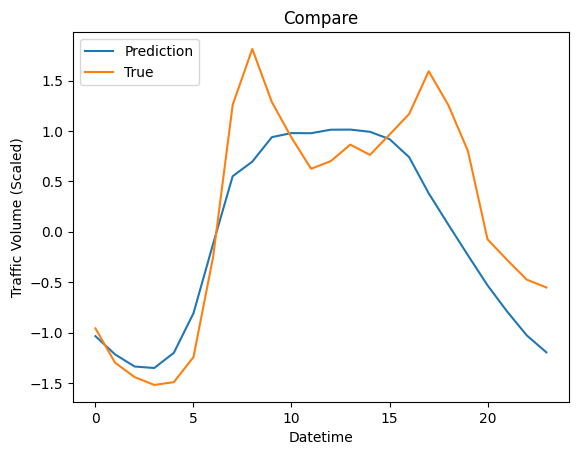

In [30]:
# Plot the training and validation accuracy
plt.plot(prediction)
plt.plot(true)
plt.title('Compare')
plt.xlabel('Datetime')
plt.ylabel('Traffic Volume (Scaled)')
plt.legend(['Prediction','True'], loc='upper left')
plt.show()

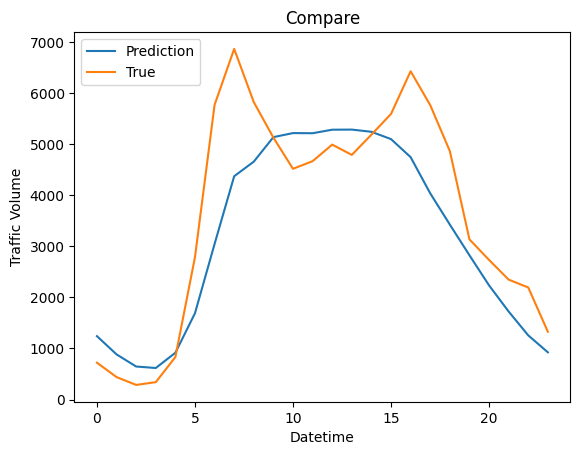

In [33]:
prediction_copies = np.repeat(prediction, df_processed.shape[1], axis = -1)
y_pred_future = scaler.inverse_transform(prediction_copies)[:,-1]

true = df_processed['traffic_volume'][-n_hours_for_prediction:].values

# Plot the training and validation accuracy
plt.plot(y_pred_future)
plt.plot(true)
plt.title('Compare')
plt.xlabel('Datetime')
plt.ylabel('Traffic Volume')
plt.legend(['Prediction','True'], loc='upper left')
plt.show()

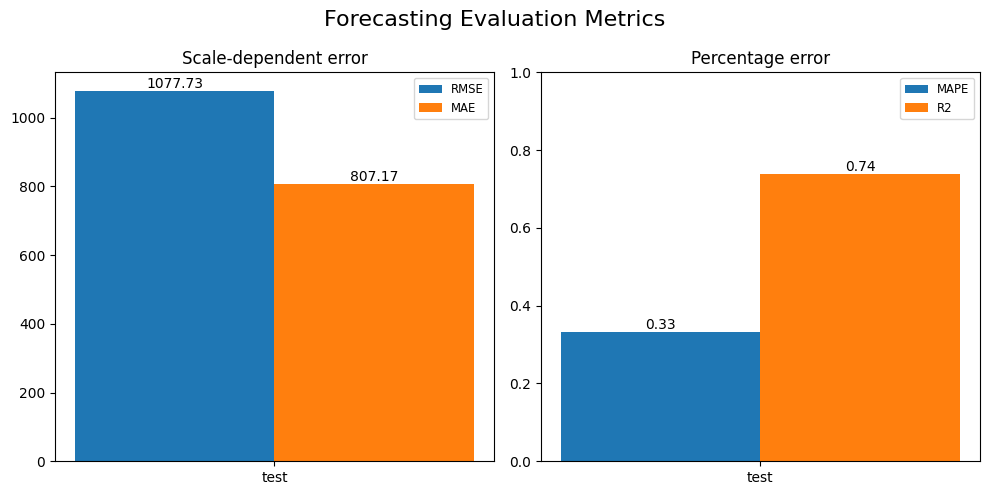

In [34]:
# Define the forecast measures
FORECAST_MEASURES = {
    "MSE": lambda actual, predicted: np.mean((actual - predicted) ** 2),
    "MAE": lambda actual, predicted: np.mean(abs(actual - predicted)),
    "MAPE": lambda actual, predicted: np.mean(abs((actual - predicted) / actual)),
    "R2": lambda actual, predicted: 1 - np.sum((actual - predicted) ** 2) / np.sum((actual - np.mean(actual)) ** 2),
}

# Compute evaluation metrics
ev1 = {
    "RMSE": [sqrt(FORECAST_MEASURES["MSE"](true, y_pred_future))],
    "MAE": [FORECAST_MEASURES["MAE"](true, y_pred_future)],
}
ev2 = {
    "MAPE": [FORECAST_MEASURES["MAPE"](true, y_pred_future)],
    "R2": [FORECAST_MEASURES["R2"](true, y_pred_future)],
}

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle("Forecasting Evaluation Metrics", fontsize=16)

# Plot scale-dependent error (e.g., RMSE, MAE)
group_labels = ["test"]
bar_labels = list(ev1.keys())
index = np.arange(len(group_labels))
bar_width = 0.8 / len(bar_labels)

axs[0].set_title("Scale-dependent error", fontsize=12)
axs[0].set_xlabel("")
axs[0].set_ylabel("")
axs[0].set_xticks(index + bar_width / 2)
axs[0].set_xticklabels(group_labels)

for i, label in enumerate(bar_labels):
    bar_values = ev1[label]
    values = axs[0].bar(
        index + i * bar_width,
        bar_values,
        width=bar_width,
        label=label
    )
    axs[0].bar_label(values, fmt="%.2f")
axs[0].legend(fontsize="small")

# Plot percentage error (e.g., MAPE, R2)
bar_labels = list(ev2.keys())
axs[1].set_title("Percentage error", fontsize=12)
axs[1].set_xlabel("")
axs[1].set_ylabel("")
axs[1].set_xticks(index + bar_width / 2)
axs[1].set_xticklabels(group_labels)
axs[1].set_ylim(0.0, 1.0)  # Percentage range

for i, label in enumerate(bar_labels):
    bar_values = ev2[label]
    values = axs[1].bar(
        index + i * bar_width,
        bar_values,
        width=bar_width,
        label=label
    )
    axs[1].bar_label(values, fmt="%.2f")
axs[1].legend(fontsize="small")

# Show the plots
plt.tight_layout()
plt.show()

### Feature Importance

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━

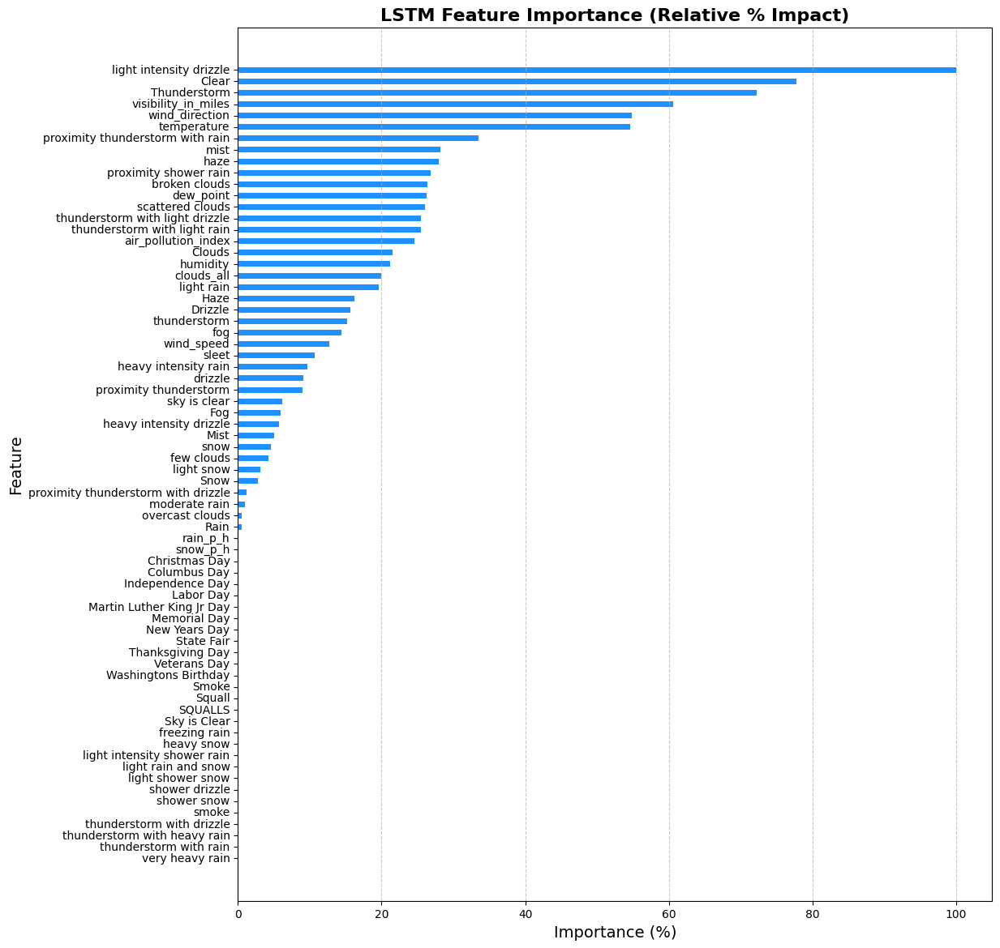

In [49]:
# Assuming df_processed is your dataframe and testX is already defined
feature_names = df_processed.columns[:-1]  # Replace with actual feature names

# Check if the feature names length matches the number of features in testX
if len(feature_names) != X_test.shape[2]:
    raise ValueError("The number of feature names does not match the number of features in testX.")

# Load the trained model
best_model_path = './best_models/model_layers_3_units_[32, 32, 32]_opt_Adam_lr_0.0001_drop_0.2_act_tanh.keras'
best_model = load_model(best_model_path)

n_days_for_prediction = 24

# Predictions for the last n_days_for_prediction days
prediction = best_model.predict(X_test[-n_days_for_prediction:])
true = Y_test[-n_days_for_prediction:]

# Compute the baseline error (absolute difference)
baseline_error = np.mean(np.abs(true - prediction))

# Initialize results list
results = []

# Loop over each feature to compute importance
for k in range(X_test.shape[2]):
    # Save original feature values
    saved_col = X_test[:, :, k].copy()

    # Shuffle the feature column
    np.random.shuffle(X_test[:, :, k])

    # Compute new predictions with shuffled feature
    shuffled_prediction = best_model.predict(X_test[-n_days_for_prediction:])
    
    # Compute error increase (absolute to avoid negative values)
    shuffled_error = np.mean(np.abs(true - shuffled_prediction))
    importance = abs(shuffled_error - baseline_error)  # Absolute difference to avoid negatives
    
    # Store results
    results.append({'feature': feature_names[k], 'importance': importance})

    # Restore original feature values
    X_test[:, :, k] = saved_col

# Normalize to percentages
max_importance = max([r['importance'] for r in results])  # Most important feature
for r in results:
    r['importance'] = (r['importance'] / max_importance) * 100  # Scale to percentage

# Sort features by importance (higher means more important)
sorted_results = sorted(results, key=lambda x: x['importance'], reverse=True)

# Extract sorted feature names and importance values
ordered_features = [item['feature'] for item in sorted_results]
ordered_importance = [item['importance'] for item in sorted_results]

# Print feature ranking
print("Features ranked from most to least important (in %):")
for rank, (feature, importance) in enumerate(zip(ordered_features, ordered_importance), 1):
    print(f"{rank}. {feature} ({importance:.2f}%)")

# Plot sorted feature importance with better y-axis spacing
plt.figure(figsize=(12, 14))  # Increase figure size
plt.barh(ordered_features, ordered_importance, color='dodgerblue', height=0.5)  # Adjust bar height
plt.gca().invert_yaxis()  # Most important feature at the top
plt.title('LSTM Feature Importance (Relative % Impact)', fontsize=16, fontweight='bold')
plt.xlabel('Importance (%)', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Increase spacing between feature names on y-axis
plt.yticks(np.arange(len(ordered_features)), ordered_features, fontsize=12)  # Larger labels
plt.gca().set_yticklabels(ordered_features, fontsize=10, verticalalignment='center', linespacing=3)  # More spacing

plt.show()

In [50]:
# Filter out features with 0% importance
filtered_results = [item for item in sorted_results if item['importance'] > 0]

# Extract sorted feature names after filtering
ordered_features = [item['feature'] for item in filtered_results]

# Return the ordered feature list
ordered_features

['light intensity drizzle',
 'Clear',
 'Thunderstorm',
 'visibility_in_miles',
 'wind_direction',
 'temperature',
 'proximity thunderstorm with rain',
 'mist',
 'haze',
 'proximity shower rain',
 'broken clouds',
 'dew_point',
 'scattered clouds',
 'thunderstorm with light drizzle',
 'thunderstorm with light rain',
 'air_pollution_index',
 'Clouds',
 'humidity',
 'clouds_all',
 'light rain',
 'Haze',
 'Drizzle',
 'thunderstorm',
 'fog',
 'wind_speed',
 'sleet',
 'heavy intensity rain',
 'drizzle',
 'proximity thunderstorm',
 'sky is clear',
 'Fog',
 'heavy intensity drizzle',
 'Mist',
 'snow',
 'few clouds',
 'light snow',
 'Snow',
 'proximity thunderstorm with drizzle',
 'moderate rain',
 'overcast clouds',
 'Rain']

### Foward Stepwise Feature Selection

In [52]:
print(X_train)

[[[ 0.68505859  1.06425737  0.20970104 ... -0.02421569 -0.01545382
   -0.01919476]
  [ 1.28568062  1.00821523 -0.29358146 ... -0.02421569 -0.01545382
   -0.01919476]
  [ 1.28568062  1.00821523 -0.29358146 ... -0.02421569 -0.01545382
   -0.01919476]
  ...
  [-1.69240361  0.9521731   0.71298355 ... -0.02421569 -0.01545382
   -0.01919476]
  [ 0.39726053  0.7840467   0.71298355 ... -0.02421569 -0.01545382
   -0.01919476]
  [-0.25341333  0.84008884  1.21626606 ... -0.02421569 -0.01545382
   -0.01919476]]

 [[ 1.28568062  1.00821523 -0.29358146 ... -0.02421569 -0.01545382
   -0.01919476]
  [ 1.28568062  1.00821523 -0.29358146 ... -0.02421569 -0.01545382
   -0.01919476]
  [ 0.67254563  1.17634163 -0.29358146 ... -0.02421569 -0.01545382
   -0.01919476]
  ...
  [ 0.39726053  0.7840467   0.71298355 ... -0.02421569 -0.01545382
   -0.01919476]
  [-0.25341333  0.84008884  1.21626606 ... -0.02421569 -0.01545382
   -0.01919476]
  [ 0.25961798  0.67196244  1.21626606 ... -0.02421569 -0.01545382
   -0.

In [56]:
len(ordered_features)

41

In [60]:
selected_features = []
best_features = []

best_performance = float('inf')  # Start with an infinitely bad performance to improve upon

kf = KFold(n_splits=3, shuffle = True, random_state = 42)

feature_names = df_processed.columns[:-1]  # Replace with your actual feature names
X_train_df = pd.DataFrame(X_train.reshape(-1, X_train.shape[2]), columns=feature_names)
X_test_df = pd.DataFrame(X_test.reshape(-1, X_test.shape[2]), columns=feature_names)


# Loop over features in the order of importance
for feature in ordered_features:
    # Add the current feature to the selected features
    selected_features.append(feature)

    # Prepare your data with the selected features (replace with your actual feature processing code)
    X_train_selected = X_train_df[selected_features].values.reshape(X_train.shape[0], X_train.shape[1], -1)  # Reshape back to 3D

    for train_idx, val_idx in kf.split(X_train_selected):
        X_train_fold, X_val_fold = X_train_selected[train_idx], X_train_selected[val_idx]
        Y_train_fold, Y_val_fold = Y_train[train_idx], Y_train[val_idx] 
    
        model = Sequential()
        model.add(LSTM(32, return_sequences=True, input_shape=(X_train_fold.shape[1], X_train_fold.shape[2]), activation='tanh'))
        model.add(Dropout(0.2))
        model.add(LSTM(32, return_sequences=True, activation='tanh'))
        model.add(Dropout(0.2))
        model.add(LSTM(32, return_sequences=False, activation='tanh'))
        model.add(Dropout(0.2))
        model.add(Dense(1))

        model.compile(loss=MeanSquaredError(), optimizer=Adam(learning_rate=0.0001), metrics=[RootMeanSquaredError()])

        # Define model checkpoint callback
        cp = ModelCheckpoint(f'./best_models_features/model_features_{len(selected_features)}.keras', 
                            save_best_only=True, monitor='val_loss', mode='min', verbose=1)

        # Fit the model with cross-validation
        history = model.fit(X_train_fold, Y_train_fold, validation_data=(X_val_fold, Y_val_fold), epochs=10, batch_size=16,
                            verbose=1, callbacks=[cp])

    print(f'With the feature: {selected_features}')

    X_test_selected = X_test_df[selected_features].values.reshape(X_test.shape[0], X_test.shape[1], -1)

    # Evaluate the model (using mean squared error as an example)
    predictions = model.predict(X_test_selected)
    performance = mean_squared_error(Y_test, predictions)  # Or any other evaluation metric

    print(f'This performance (MSE): {performance}')

    # Store the best model if performance improved
    if performance < best_performance:
        best_performance = performance
        best_features = selected_features.copy()
    
        

# Output the selected features and best performance
print("The best features were:", best_features)
print("Best performance (MSE):", best_performance)

Epoch 1/10


C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.9968 - root_mean_squared_error: 0.9983
Epoch 1: val_loss improved from inf to 0.98649, saving model to ./best_models_features/model_features_1.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.9968 - root_mean_squared_error: 0.9983 - val_loss: 0.9865 - val_root_mean_squared_error: 0.9932
Epoch 2/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.9963 - root_mean_squared_error: 0.9981
Epoch 2: val_loss improved from 0.98649 to 0.98534, saving model to ./best_models_features/model_features_1.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - loss: 0.9963 - root_mean_squared_error: 0.9981 - val_loss: 0.9853 - val_root_mean_squared_error: 0.9926
Epoch 3/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9950 - root_mean_squared_error: 0.9974
Epoch 3: val_loss improved from 0.98534 to 0.98533, saving model to ./best_models_features/model_features_1.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - loss: 0.9950 - root_mean_s

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9835 - root_mean_squared_error: 0.9917
Epoch 1: val_loss improved from inf to 0.98235, saving model to ./best_models_features/model_features_2.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 11s 19ms/step - loss: 0.9836 - root_mean_squared_error: 0.9917 - val_loss: 0.9824 - val_root_mean_squared_error: 0.9911
Epoch 2/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9985 - root_mean_squared_error: 0.9992
Epoch 2: val_loss improved from 0.98235 to 0.98028, saving model to ./best_models_features/model_features_2.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - loss: 0.9985 - root_mean_squared_error: 0.9992 - val_loss: 0.9803 - val_root_mean_squared_error: 0.9901
Epoch 3/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9988 - root_mean_squared_error: 0.9994
Epoch 3: val_loss improved from 0.98028 to 0.97583, saving model to ./best_models_features/model_features_2.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - loss: 0.9988 - root_mean_s

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9891 - root_mean_squared_error: 0.9945
Epoch 1: val_loss improved from inf to 0.98478, saving model to ./best_models_features/model_features_3.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - loss: 0.9892 - root_mean_squared_error: 0.9945 - val_loss: 0.9848 - val_root_mean_squared_error: 0.9924
Epoch 2/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9882 - root_mean_squared_error: 0.9941
Epoch 2: val_loss improved from 0.98478 to 0.98346, saving model to ./best_models_features/model_features_3.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - loss: 0.9883 - root_mean_squared_error: 0.9941 - val_loss: 0.9835 - val_root_mean_squared_error: 0.9917
Epoch 3/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9938 - root_mean_squared_error: 0.9969
Epoch 3: val_loss improved from 0.98346 to 0.98122, saving model to ./best_models_features/model_features_3.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - loss: 0.9938 - root_mean_s

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9939 - root_mean_squared_error: 0.9969
Epoch 1: val_loss improved from inf to 0.97989, saving model to ./best_models_features/model_features_4.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - loss: 0.9939 - root_mean_squared_error: 0.9969 - val_loss: 0.9799 - val_root_mean_squared_error: 0.9899
Epoch 2/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 1.0057 - root_mean_squared_error: 1.0028
Epoch 2: val_loss improved from 0.97989 to 0.97752, saving model to ./best_models_features/model_features_4.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - loss: 1.0057 - root_mean_squared_error: 1.0027 - val_loss: 0.9775 - val_root_mean_squared_error: 0.9887
Epoch 3/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9817 - root_mean_squared_error: 0.9908
Epoch 3: val_loss improved from 0.97752 to 0.97326, saving model to ./best_models_features/model_features_4.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - loss: 0.9818 - root_mean_s

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 1.0043 - root_mean_squared_error: 1.0020
Epoch 1: val_loss improved from inf to 0.98444, saving model to ./best_models_features/model_features_5.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - loss: 1.0043 - root_mean_squared_error: 1.0020 - val_loss: 0.9844 - val_root_mean_squared_error: 0.9922
Epoch 2/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9854 - root_mean_squared_error: 0.9925
Epoch 2: val_loss improved from 0.98444 to 0.98209, saving model to ./best_models_features/model_features_5.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9854 - root_mean_squared_error: 0.9925 - val_loss: 0.9821 - val_root_mean_squared_error: 0.9910
Epoch 3/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 1.0221 - root_mean_squared_error: 1.0109
Epoch 3: val_loss improved from 0.98209 to 0.98091, saving model to ./best_models_features/model_features_5.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 1.0219 - root_mean_s

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9968 - root_mean_squared_error: 0.9984
Epoch 1: val_loss improved from inf to 0.97849, saving model to ./best_models_features/model_features_6.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - loss: 0.9968 - root_mean_squared_error: 0.9984 - val_loss: 0.9785 - val_root_mean_squared_error: 0.9892
Epoch 2/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9833 - root_mean_squared_error: 0.9916
Epoch 2: val_loss improved from 0.97849 to 0.96463, saving model to ./best_models_features/model_features_6.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9833 - root_mean_squared_error: 0.9916 - val_loss: 0.9646 - val_root_mean_squared_error: 0.9822
Epoch 3/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9852 - root_mean_squared_error: 0.9925
Epoch 3: val_loss improved from 0.96463 to 0.92701, saving model to ./best_models_features/model_features_6.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9851 - root_mean_s

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9905 - root_mean_squared_error: 0.9952
Epoch 1: val_loss improved from inf to 0.96989, saving model to ./best_models_features/model_features_7.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.9905 - root_mean_squared_error: 0.9952 - val_loss: 0.9699 - val_root_mean_squared_error: 0.9848
Epoch 2/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9766 - root_mean_squared_error: 0.9882
Epoch 2: val_loss improved from 0.96989 to 0.94817, saving model to ./best_models_features/model_features_7.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9766 - root_mean_squared_error: 0.9882 - val_loss: 0.9482 - val_root_mean_squared_error: 0.9737
Epoch 3/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9449 - root_mean_squared_error: 0.9720
Epoch 3: val_loss improved from 0.94817 to 0.82111, saving model to ./best_models_features/model_features_7.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9448 - root_mean_s

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9941 - root_mean_squared_error: 0.9970
Epoch 1: val_loss improved from inf to 0.97070, saving model to ./best_models_features/model_features_8.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 18ms/step - loss: 0.9941 - root_mean_squared_error: 0.9970 - val_loss: 0.9707 - val_root_mean_squared_error: 0.9852
Epoch 2/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9783 - root_mean_squared_error: 0.9890
Epoch 2: val_loss improved from 0.97070 to 0.93735, saving model to ./best_models_features/model_features_8.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9782 - root_mean_squared_error: 0.9890 - val_loss: 0.9373 - val_root_mean_squared_error: 0.9682
Epoch 3/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9103 - root_mean_squared_error: 0.9541
Epoch 3: val_loss improved from 0.93735 to 0.79104, saving model to ./best_models_features/model_features_8.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9103 - root_mean_s

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 1.0036 - root_mean_squared_error: 1.0018
Epoch 1: val_loss improved from inf to 0.96688, saving model to ./best_models_features/model_features_9.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - loss: 1.0035 - root_mean_squared_error: 1.0017 - val_loss: 0.9669 - val_root_mean_squared_error: 0.9833
Epoch 2/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9714 - root_mean_squared_error: 0.9855
Epoch 2: val_loss improved from 0.96688 to 0.93154, saving model to ./best_models_features/model_features_9.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9714 - root_mean_squared_error: 0.9855 - val_loss: 0.9315 - val_root_mean_squared_error: 0.9652
Epoch 3/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9407 - root_mean_squared_error: 0.9697
Epoch 3: val_loss improved from 0.93154 to 0.69195, saving model to ./best_models_features/model_features_9.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9406 - root_mean_s

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0083 - root_mean_squared_error: 1.0040
Epoch 1: val_loss improved from inf to 0.96655, saving model to ./best_models_features/model_features_10.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 1.0081 - root_mean_squared_error: 1.0040 - val_loss: 0.9665 - val_root_mean_squared_error: 0.9831
Epoch 2/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9841 - root_mean_squared_error: 0.9919
Epoch 2: val_loss improved from 0.96655 to 0.93790, saving model to ./best_models_features/model_features_10.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9841 - root_mean_squared_error: 0.9919 - val_loss: 0.9379 - val_root_mean_squared_error: 0.9685
Epoch 3/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9370 - root_mean_squared_error: 0.9679
Epoch 3: val_loss improved from 0.93790 to 0.83323, saving model to ./best_models_features/model_features_10.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9369 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 1.0111 - root_mean_squared_error: 1.0054
Epoch 1: val_loss improved from inf to 0.97396, saving model to ./best_models_features/model_features_11.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - loss: 1.0110 - root_mean_squared_error: 1.0054 - val_loss: 0.9740 - val_root_mean_squared_error: 0.9869
Epoch 2/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9901 - root_mean_squared_error: 0.9950
Epoch 2: val_loss improved from 0.97396 to 0.95559, saving model to ./best_models_features/model_features_11.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9900 - root_mean_squared_error: 0.9949 - val_loss: 0.9556 - val_root_mean_squared_error: 0.9775
Epoch 3/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9468 - root_mean_squared_error: 0.9730
Epoch 3: val_loss improved from 0.95559 to 0.91507, saving model to ./best_models_features/model_features_11.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - loss: 0.9469 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9767 - root_mean_squared_error: 0.9882
Epoch 1: val_loss improved from inf to 0.96653, saving model to ./best_models_features/model_features_12.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - loss: 0.9767 - root_mean_squared_error: 0.9883 - val_loss: 0.9665 - val_root_mean_squared_error: 0.9831
Epoch 2/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9616 - root_mean_squared_error: 0.9806
Epoch 2: val_loss improved from 0.96653 to 0.93374, saving model to ./best_models_features/model_features_12.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9617 - root_mean_squared_error: 0.9806 - val_loss: 0.9337 - val_root_mean_squared_error: 0.9663
Epoch 3/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9237 - root_mean_squared_error: 0.9609
Epoch 3: val_loss improved from 0.93374 to 0.73154, saving model to ./best_models_features/model_features_12.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - loss: 0.9233 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9742 - root_mean_squared_error: 0.9870
Epoch 1: val_loss improved from inf to 0.96262, saving model to ./best_models_features/model_features_13.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.9744 - root_mean_squared_error: 0.9870 - val_loss: 0.9626 - val_root_mean_squared_error: 0.9811
Epoch 2/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9601 - root_mean_squared_error: 0.9798
Epoch 2: val_loss improved from 0.96262 to 0.93107, saving model to ./best_models_features/model_features_13.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - loss: 0.9601 - root_mean_squared_error: 0.9798 - val_loss: 0.9311 - val_root_mean_squared_error: 0.9649
Epoch 3/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9341 - root_mean_squared_error: 0.9663
Epoch 3: val_loss improved from 0.93107 to 0.84259, saving model to ./best_models_features/model_features_13.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9339 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9965 - root_mean_squared_error: 0.9982
Epoch 1: val_loss improved from inf to 0.96210, saving model to ./best_models_features/model_features_14.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 18ms/step - loss: 0.9965 - root_mean_squared_error: 0.9982 - val_loss: 0.9621 - val_root_mean_squared_error: 0.9809
Epoch 2/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9861 - root_mean_squared_error: 0.9929
Epoch 2: val_loss improved from 0.96210 to 0.91977, saving model to ./best_models_features/model_features_14.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9860 - root_mean_squared_error: 0.9929 - val_loss: 0.9198 - val_root_mean_squared_error: 0.9590
Epoch 3/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9022 - root_mean_squared_error: 0.9498
Epoch 3: val_loss improved from 0.91977 to 0.77248, saving model to ./best_models_features/model_features_14.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9020 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9936 - root_mean_squared_error: 0.9967
Epoch 1: val_loss improved from inf to 0.96929, saving model to ./best_models_features/model_features_15.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.9936 - root_mean_squared_error: 0.9967 - val_loss: 0.9693 - val_root_mean_squared_error: 0.9845
Epoch 2/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9985 - root_mean_squared_error: 0.9990
Epoch 2: val_loss improved from 0.96929 to 0.94056, saving model to ./best_models_features/model_features_15.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9984 - root_mean_squared_error: 0.9990 - val_loss: 0.9406 - val_root_mean_squared_error: 0.9698
Epoch 3/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9511 - root_mean_squared_error: 0.9752
Epoch 3: val_loss improved from 0.94056 to 0.85822, saving model to ./best_models_features/model_features_15.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9510 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9857 - root_mean_squared_error: 0.9928
Epoch 1: val_loss improved from inf to 0.97292, saving model to ./best_models_features/model_features_16.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.9857 - root_mean_squared_error: 0.9928 - val_loss: 0.9729 - val_root_mean_squared_error: 0.9864
Epoch 2/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9883 - root_mean_squared_error: 0.9940
Epoch 2: val_loss improved from 0.97292 to 0.95756, saving model to ./best_models_features/model_features_16.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9883 - root_mean_squared_error: 0.9940 - val_loss: 0.9576 - val_root_mean_squared_error: 0.9786
Epoch 3/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9508 - root_mean_squared_error: 0.9750
Epoch 3: val_loss improved from 0.95756 to 0.93253, saving model to ./best_models_features/model_features_16.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9508 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9802 - root_mean_squared_error: 0.9900
Epoch 1: val_loss improved from inf to 0.97372, saving model to ./best_models_features/model_features_17.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.9803 - root_mean_squared_error: 0.9901 - val_loss: 0.9737 - val_root_mean_squared_error: 0.9868
Epoch 2/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9783 - root_mean_squared_error: 0.9890
Epoch 2: val_loss improved from 0.97372 to 0.95810, saving model to ./best_models_features/model_features_17.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - loss: 0.9783 - root_mean_squared_error: 0.9890 - val_loss: 0.9581 - val_root_mean_squared_error: 0.9788
Epoch 3/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9672 - root_mean_squared_error: 0.9835
Epoch 3: val_loss improved from 0.95810 to 0.91716, saving model to ./best_models_features/model_features_17.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9672 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0027 - root_mean_squared_error: 1.0013
Epoch 1: val_loss improved from inf to 0.97114, saving model to ./best_models_features/model_features_18.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 1.0027 - root_mean_squared_error: 1.0013 - val_loss: 0.9711 - val_root_mean_squared_error: 0.9855
Epoch 2/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9859 - root_mean_squared_error: 0.9929
Epoch 2: val_loss improved from 0.97114 to 0.95481, saving model to ./best_models_features/model_features_18.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9859 - root_mean_squared_error: 0.9929 - val_loss: 0.9548 - val_root_mean_squared_error: 0.9771
Epoch 3/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9770 - root_mean_squared_error: 0.9883
Epoch 3: val_loss improved from 0.95481 to 0.92117, saving model to ./best_models_features/model_features_18.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9768 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9968 - root_mean_squared_error: 0.9983
Epoch 1: val_loss improved from inf to 0.97242, saving model to ./best_models_features/model_features_19.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 11s 17ms/step - loss: 0.9968 - root_mean_squared_error: 0.9983 - val_loss: 0.9724 - val_root_mean_squared_error: 0.9861
Epoch 2/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9747 - root_mean_squared_error: 0.9871
Epoch 2: val_loss improved from 0.97242 to 0.96055, saving model to ./best_models_features/model_features_19.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9748 - root_mean_squared_error: 0.9872 - val_loss: 0.9606 - val_root_mean_squared_error: 0.9801
Epoch 3/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9705 - root_mean_squared_error: 0.9851
Epoch 3: val_loss improved from 0.96055 to 0.93718, saving model to ./best_models_features/model_features_19.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9705 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0035 - root_mean_squared_error: 1.0017
Epoch 1: val_loss improved from inf to 0.97012, saving model to ./best_models_features/model_features_20.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 1.0035 - root_mean_squared_error: 1.0017 - val_loss: 0.9701 - val_root_mean_squared_error: 0.9849
Epoch 2/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9910 - root_mean_squared_error: 0.9955
Epoch 2: val_loss improved from 0.97012 to 0.95045, saving model to ./best_models_features/model_features_20.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9910 - root_mean_squared_error: 0.9955 - val_loss: 0.9505 - val_root_mean_squared_error: 0.9749
Epoch 3/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9452 - root_mean_squared_error: 0.9722
Epoch 3: val_loss improved from 0.95045 to 0.90412, saving model to ./best_models_features/model_features_20.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - loss: 0.9452 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0182 - root_mean_squared_error: 1.0090
Epoch 1: val_loss improved from inf to 0.96923, saving model to ./best_models_features/model_features_21.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 1.0181 - root_mean_squared_error: 1.0089 - val_loss: 0.9692 - val_root_mean_squared_error: 0.9845
Epoch 2/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9857 - root_mean_squared_error: 0.9928
Epoch 2: val_loss improved from 0.96923 to 0.94327, saving model to ./best_models_features/model_features_21.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9856 - root_mean_squared_error: 0.9927 - val_loss: 0.9433 - val_root_mean_squared_error: 0.9712
Epoch 3/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9569 - root_mean_squared_error: 0.9781
Epoch 3: val_loss improved from 0.94327 to 0.87937, saving model to ./best_models_features/model_features_21.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9568 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.9866 - root_mean_squared_error: 0.9932
Epoch 1: val_loss improved from inf to 0.96449, saving model to ./best_models_features/model_features_22.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - loss: 0.9867 - root_mean_squared_error: 0.9932 - val_loss: 0.9645 - val_root_mean_squared_error: 0.9821
Epoch 2/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9825 - root_mean_squared_error: 0.9912
Epoch 2: val_loss improved from 0.96449 to 0.94904, saving model to ./best_models_features/model_features_22.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9824 - root_mean_squared_error: 0.9911 - val_loss: 0.9490 - val_root_mean_squared_error: 0.9742
Epoch 3/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9562 - root_mean_squared_error: 0.9777
Epoch 3: val_loss improved from 0.94904 to 0.92457, saving model to ./best_models_features/model_features_22.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9562 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 1.0035 - root_mean_squared_error: 1.0017
Epoch 1: val_loss improved from inf to 0.96816, saving model to ./best_models_features/model_features_23.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - loss: 1.0035 - root_mean_squared_error: 1.0017 - val_loss: 0.9682 - val_root_mean_squared_error: 0.9840
Epoch 2/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9911 - root_mean_squared_error: 0.9955
Epoch 2: val_loss improved from 0.96816 to 0.95219, saving model to ./best_models_features/model_features_23.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9910 - root_mean_squared_error: 0.9955 - val_loss: 0.9522 - val_root_mean_squared_error: 0.9758
Epoch 3/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9639 - root_mean_squared_error: 0.9818
Epoch 3: val_loss improved from 0.95219 to 0.92715, saving model to ./best_models_features/model_features_23.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9639 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 1.0097 - root_mean_squared_error: 1.0048
Epoch 1: val_loss improved from inf to 0.97427, saving model to ./best_models_features/model_features_24.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - loss: 1.0096 - root_mean_squared_error: 1.0047 - val_loss: 0.9743 - val_root_mean_squared_error: 0.9871
Epoch 2/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9792 - root_mean_squared_error: 0.9895
Epoch 2: val_loss improved from 0.97427 to 0.96343, saving model to ./best_models_features/model_features_24.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9792 - root_mean_squared_error: 0.9895 - val_loss: 0.9634 - val_root_mean_squared_error: 0.9815
Epoch 3/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9786 - root_mean_squared_error: 0.9889
Epoch 3: val_loss improved from 0.96343 to 0.94168, saving model to ./best_models_features/model_features_24.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9785 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 1.0041 - root_mean_squared_error: 1.0020
Epoch 1: val_loss improved from inf to 0.96834, saving model to ./best_models_features/model_features_25.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - loss: 1.0041 - root_mean_squared_error: 1.0020 - val_loss: 0.9683 - val_root_mean_squared_error: 0.9840
Epoch 2/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9839 - root_mean_squared_error: 0.9918
Epoch 2: val_loss improved from 0.96834 to 0.95155, saving model to ./best_models_features/model_features_25.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9838 - root_mean_squared_error: 0.9918 - val_loss: 0.9516 - val_root_mean_squared_error: 0.9755
Epoch 3/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9717 - root_mean_squared_error: 0.9857
Epoch 3: val_loss improved from 0.95155 to 0.92302, saving model to ./best_models_features/model_features_25.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9717 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 1.0163 - root_mean_squared_error: 1.0079
Epoch 1: val_loss improved from inf to 0.96615, saving model to ./best_models_features/model_features_26.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - loss: 1.0162 - root_mean_squared_error: 1.0079 - val_loss: 0.9661 - val_root_mean_squared_error: 0.9829
Epoch 2/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9838 - root_mean_squared_error: 0.9919
Epoch 2: val_loss improved from 0.96615 to 0.94510, saving model to ./best_models_features/model_features_26.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9838 - root_mean_squared_error: 0.9918 - val_loss: 0.9451 - val_root_mean_squared_error: 0.9722
Epoch 3/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9411 - root_mean_squared_error: 0.9701
Epoch 3: val_loss improved from 0.94510 to 0.88435, saving model to ./best_models_features/model_features_26.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9411 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9999 - root_mean_squared_error: 0.9999
Epoch 1: val_loss improved from inf to 0.96803, saving model to ./best_models_features/model_features_27.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 13s 17ms/step - loss: 0.9999 - root_mean_squared_error: 0.9999 - val_loss: 0.9680 - val_root_mean_squared_error: 0.9839
Epoch 2/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9663 - root_mean_squared_error: 0.9830
Epoch 2: val_loss improved from 0.96803 to 0.94830, saving model to ./best_models_features/model_features_27.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9664 - root_mean_squared_error: 0.9830 - val_loss: 0.9483 - val_root_mean_squared_error: 0.9738
Epoch 3/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9405 - root_mean_squared_error: 0.9697
Epoch 3: val_loss improved from 0.94830 to 0.90375, saving model to ./best_models_features/model_features_27.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9405 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0126 - root_mean_squared_error: 1.0063
Epoch 1: val_loss improved from inf to 0.97184, saving model to ./best_models_features/model_features_28.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 1.0126 - root_mean_squared_error: 1.0062 - val_loss: 0.9718 - val_root_mean_squared_error: 0.9858
Epoch 2/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9834 - root_mean_squared_error: 0.9916
Epoch 2: val_loss improved from 0.97184 to 0.95607, saving model to ./best_models_features/model_features_28.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9834 - root_mean_squared_error: 0.9916 - val_loss: 0.9561 - val_root_mean_squared_error: 0.9778
Epoch 3/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9726 - root_mean_squared_error: 0.9861
Epoch 3: val_loss improved from 0.95607 to 0.93430, saving model to ./best_models_features/model_features_28.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9725 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0019 - root_mean_squared_error: 1.0009
Epoch 1: val_loss improved from inf to 0.96908, saving model to ./best_models_features/model_features_29.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 1.0018 - root_mean_squared_error: 1.0009 - val_loss: 0.9691 - val_root_mean_squared_error: 0.9844
Epoch 2/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9910 - root_mean_squared_error: 0.9954
Epoch 2: val_loss improved from 0.96908 to 0.94977, saving model to ./best_models_features/model_features_29.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9909 - root_mean_squared_error: 0.9954 - val_loss: 0.9498 - val_root_mean_squared_error: 0.9746
Epoch 3/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9634 - root_mean_squared_error: 0.9814
Epoch 3: val_loss improved from 0.94977 to 0.91652, saving model to ./best_models_features/model_features_29.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9634 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0227 - root_mean_squared_error: 1.0112
Epoch 1: val_loss improved from inf to 0.97478, saving model to ./best_models_features/model_features_30.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - loss: 1.0226 - root_mean_squared_error: 1.0112 - val_loss: 0.9748 - val_root_mean_squared_error: 0.9873
Epoch 2/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9925 - root_mean_squared_error: 0.9962
Epoch 2: val_loss improved from 0.97478 to 0.96408, saving model to ./best_models_features/model_features_30.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9925 - root_mean_squared_error: 0.9962 - val_loss: 0.9641 - val_root_mean_squared_error: 0.9819
Epoch 3/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9690 - root_mean_squared_error: 0.9844
Epoch 3: val_loss improved from 0.96408 to 0.94843, saving model to ./best_models_features/model_features_30.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9690 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0000 - root_mean_squared_error: 0.9999
Epoch 1: val_loss improved from inf to 0.96701, saving model to ./best_models_features/model_features_31.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 1.0000 - root_mean_squared_error: 0.9999 - val_loss: 0.9670 - val_root_mean_squared_error: 0.9834
Epoch 2/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9735 - root_mean_squared_error: 0.9866
Epoch 2: val_loss improved from 0.96701 to 0.94887, saving model to ./best_models_features/model_features_31.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9736 - root_mean_squared_error: 0.9867 - val_loss: 0.9489 - val_root_mean_squared_error: 0.9741
Epoch 3/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9661 - root_mean_squared_error: 0.9829
Epoch 3: val_loss improved from 0.94887 to 0.92019, saving model to ./best_models_features/model_features_31.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9661 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0097 - root_mean_squared_error: 1.0048
Epoch 1: val_loss improved from inf to 0.97393, saving model to ./best_models_features/model_features_32.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 1.0096 - root_mean_squared_error: 1.0047 - val_loss: 0.9739 - val_root_mean_squared_error: 0.9869
Epoch 2/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9950 - root_mean_squared_error: 0.9974
Epoch 2: val_loss improved from 0.97393 to 0.96212, saving model to ./best_models_features/model_features_32.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9950 - root_mean_squared_error: 0.9974 - val_loss: 0.9621 - val_root_mean_squared_error: 0.9809
Epoch 3/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9805 - root_mean_squared_error: 0.9902
Epoch 3: val_loss improved from 0.96212 to 0.93855, saving model to ./best_models_features/model_features_32.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9805 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0053 - root_mean_squared_error: 1.0026
Epoch 1: val_loss improved from inf to 0.96693, saving model to ./best_models_features/model_features_33.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 1.0053 - root_mean_squared_error: 1.0026 - val_loss: 0.9669 - val_root_mean_squared_error: 0.9833
Epoch 2/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9785 - root_mean_squared_error: 0.9891
Epoch 2: val_loss improved from 0.96693 to 0.94292, saving model to ./best_models_features/model_features_33.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9785 - root_mean_squared_error: 0.9891 - val_loss: 0.9429 - val_root_mean_squared_error: 0.9710
Epoch 3/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9611 - root_mean_squared_error: 0.9803
Epoch 3: val_loss improved from 0.94292 to 0.89876, saving model to ./best_models_features/model_features_33.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9609 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0104 - root_mean_squared_error: 1.0051
Epoch 1: val_loss improved from inf to 0.96880, saving model to ./best_models_features/model_features_34.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 1.0103 - root_mean_squared_error: 1.0051 - val_loss: 0.9688 - val_root_mean_squared_error: 0.9843
Epoch 2/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9693 - root_mean_squared_error: 0.9844
Epoch 2: val_loss improved from 0.96880 to 0.94660, saving model to ./best_models_features/model_features_34.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9693 - root_mean_squared_error: 0.9845 - val_loss: 0.9466 - val_root_mean_squared_error: 0.9729
Epoch 3/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9517 - root_mean_squared_error: 0.9755
Epoch 3: val_loss improved from 0.94660 to 0.90623, saving model to ./best_models_features/model_features_34.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9516 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0085 - root_mean_squared_error: 1.0042
Epoch 1: val_loss improved from inf to 0.96722, saving model to ./best_models_features/model_features_35.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 1.0084 - root_mean_squared_error: 1.0042 - val_loss: 0.9672 - val_root_mean_squared_error: 0.9835
Epoch 2/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0010 - root_mean_squared_error: 1.0005
Epoch 2: val_loss improved from 0.96722 to 0.95004, saving model to ./best_models_features/model_features_35.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 1.0009 - root_mean_squared_error: 1.0004 - val_loss: 0.9500 - val_root_mean_squared_error: 0.9747
Epoch 3/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9580 - root_mean_squared_error: 0.9787
Epoch 3: val_loss improved from 0.95004 to 0.92437, saving model to ./best_models_features/model_features_35.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.9580 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9906 - root_mean_squared_error: 0.9952
Epoch 1: val_loss improved from inf to 0.96320, saving model to ./best_models_features/model_features_36.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.9907 - root_mean_squared_error: 0.9953 - val_loss: 0.9632 - val_root_mean_squared_error: 0.9814
Epoch 2/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9785 - root_mean_squared_error: 0.9891
Epoch 2: val_loss improved from 0.96320 to 0.93617, saving model to ./best_models_features/model_features_36.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9785 - root_mean_squared_error: 0.9891 - val_loss: 0.9362 - val_root_mean_squared_error: 0.9676
Epoch 3/10
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9330 - root_mean_squared_error: 0.9659
Epoch 3: val_loss improved from 0.93617 to 0.85193, saving model to ./best_models_features/model_features_36.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9330 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0046 - root_mean_squared_error: 1.0022
Epoch 1: val_loss improved from inf to 0.96030, saving model to ./best_models_features/model_features_37.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 1.0046 - root_mean_squared_error: 1.0022 - val_loss: 0.9603 - val_root_mean_squared_error: 0.9799
Epoch 2/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9781 - root_mean_squared_error: 0.9889
Epoch 2: val_loss improved from 0.96030 to 0.93785, saving model to ./best_models_features/model_features_37.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9781 - root_mean_squared_error: 0.9889 - val_loss: 0.9379 - val_root_mean_squared_error: 0.9684
Epoch 3/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9419 - root_mean_squared_error: 0.9705
Epoch 3: val_loss improved from 0.93785 to 0.89160, saving model to ./best_models_features/model_features_37.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9419 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0068 - root_mean_squared_error: 1.0033
Epoch 1: val_loss improved from inf to 0.96792, saving model to ./best_models_features/model_features_38.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 1.0067 - root_mean_squared_error: 1.0033 - val_loss: 0.9679 - val_root_mean_squared_error: 0.9838
Epoch 2/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9917 - root_mean_squared_error: 0.9957
Epoch 2: val_loss improved from 0.96792 to 0.95434, saving model to ./best_models_features/model_features_38.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9916 - root_mean_squared_error: 0.9956 - val_loss: 0.9543 - val_root_mean_squared_error: 0.9769
Epoch 3/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9867 - root_mean_squared_error: 0.9933
Epoch 3: val_loss improved from 0.95434 to 0.93470, saving model to ./best_models_features/model_features_38.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9866 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0193 - root_mean_squared_error: 1.0095
Epoch 1: val_loss improved from inf to 0.96323, saving model to ./best_models_features/model_features_39.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 1.0193 - root_mean_squared_error: 1.0095 - val_loss: 0.9632 - val_root_mean_squared_error: 0.9814
Epoch 2/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9662 - root_mean_squared_error: 0.9828
Epoch 2: val_loss improved from 0.96323 to 0.93090, saving model to ./best_models_features/model_features_39.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9662 - root_mean_squared_error: 0.9828 - val_loss: 0.9309 - val_root_mean_squared_error: 0.9648
Epoch 3/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9335 - root_mean_squared_error: 0.9661
Epoch 3: val_loss improved from 0.93090 to 0.86400, saving model to ./best_models_features/model_features_39.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9334 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9932 - root_mean_squared_error: 0.9965
Epoch 1: val_loss improved from inf to 0.96367, saving model to ./best_models_features/model_features_40.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - loss: 0.9932 - root_mean_squared_error: 0.9965 - val_loss: 0.9637 - val_root_mean_squared_error: 0.9817
Epoch 2/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9900 - root_mean_squared_error: 0.9950
Epoch 2: val_loss improved from 0.96367 to 0.93718, saving model to ./best_models_features/model_features_40.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - loss: 0.9899 - root_mean_squared_error: 0.9949 - val_loss: 0.9372 - val_root_mean_squared_error: 0.9681
Epoch 3/10
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9419 - root_mean_squared_error: 0.9704
Epoch 3: val_loss improved from 0.93718 to 0.89837, saving model to ./best_models_features/model_features_40.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9419 - root_mea

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 1.0020 - root_mean_squared_error: 1.0008
Epoch 1: val_loss improved from inf to 0.97210, saving model to ./best_models_features/model_features_41.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - loss: 1.0020 - root_mean_squared_error: 1.0008 - val_loss: 0.9721 - val_root_mean_squared_error: 0.9860
Epoch 2/10
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9799 - root_mean_squared_error: 0.9898
Epoch 2: val_loss improved from 0.97210 to 0.95488, saving model to ./best_models_features/model_features_41.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - loss: 0.9799 - root_mean_squared_error: 0.9898 - val_loss: 0.9549 - val_root_mean_squared_error: 0.9772
Epoch 3/10
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9623 - root_mean_squared_error: 0.9809
Epoch 3: val_loss improved from 0.95488 to 0.92265, saving model to ./best_models_features/model_features_41.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.9623 - root_mea

In [63]:
# Load the best model (from the last fold or the one with the best validation loss)
best_model_path = './best_models_features/model_features_16.keras'
best_model_lstm = load_model(best_model_path)

n_hours_for_prediction = 24

feature_names = df_processed.columns[:-1]

X_test_df = pd.DataFrame(X_test.reshape(-1, X_test.shape[2]), columns=feature_names)

X_test_selected = X_test_df[best_features].values.reshape(X_test.shape[0], X_test.shape[1], -1)

prediction = best_model_lstm.predict(X_test_selected[-n_hours_for_prediction:])


true = Y_test[-n_hours_for_prediction:]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


In [64]:
true = Y_test[-n_hours_for_prediction:]

In [65]:
print(f"pred:{n_hours_for_prediction}")
print(f"true:{true}")

pred:24
true:[-0.95833686 -1.29900632 -1.44196582 -1.51952896 -1.49215373 -1.24324197
 -0.25215746  1.25905632  1.81416503  1.28643154  0.93410226  0.62486362
  0.70039896  0.8646503   0.76275364  0.96350528  1.16881946  1.59262849
  1.25652157  0.80077478 -0.0752324  -0.27953268 -0.47470789 -0.55277798]


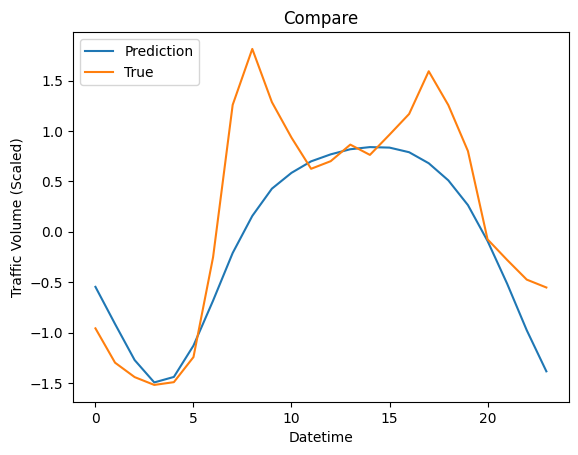

In [66]:
# Plot the training and validation accuracy
plt.plot(prediction)
plt.plot(true)
plt.title('Compare')
plt.xlabel('Datetime')
plt.ylabel('Traffic Volume (Scaled)')
plt.legend(['Prediction','True'], loc='upper left')
plt.show()

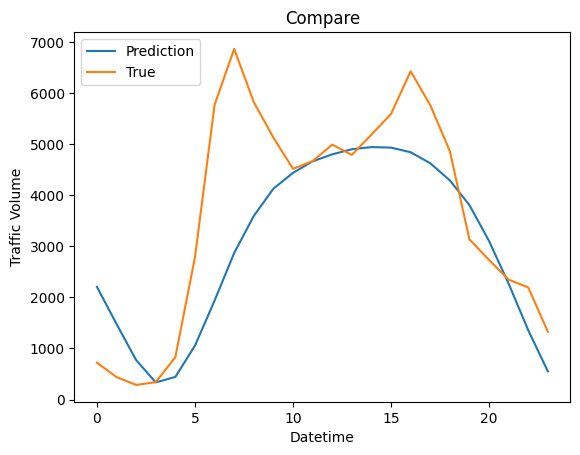

In [67]:
prediction_copies = np.repeat(prediction, df_processed.shape[1], axis = -1)
y_pred_future = scaler.inverse_transform(prediction_copies)[:,-1]

true = df_processed['traffic_volume'][-n_hours_for_prediction:].values

# Plot the training and validation accuracy
plt.plot(y_pred_future)
plt.plot(true)
plt.title('Compare')
plt.xlabel('Datetime')
plt.ylabel('Traffic Volume')
plt.legend(['Prediction','True'], loc='upper left')
plt.show()

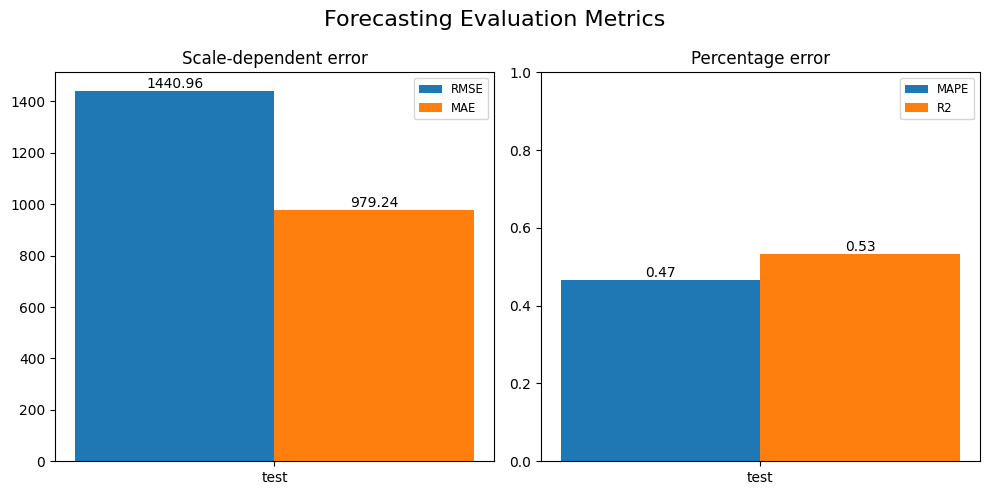

In [68]:
# Define the forecast measures
FORECAST_MEASURES = {
    "MSE": lambda actual, predicted: np.mean((actual - predicted) ** 2),
    "MAE": lambda actual, predicted: np.mean(abs(actual - predicted)),
    "MAPE": lambda actual, predicted: np.mean(abs((actual - predicted) / actual)),
    "R2": lambda actual, predicted: 1 - np.sum((actual - predicted) ** 2) / np.sum((actual - np.mean(actual)) ** 2),
}

# Compute evaluation metrics
ev1 = {
    "RMSE": [sqrt(FORECAST_MEASURES["MSE"](true, y_pred_future))],
    "MAE": [FORECAST_MEASURES["MAE"](true, y_pred_future)],
}
ev2 = {
    "MAPE": [FORECAST_MEASURES["MAPE"](true, y_pred_future)],
    "R2": [FORECAST_MEASURES["R2"](true, y_pred_future)],
}

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle("Forecasting Evaluation Metrics", fontsize=16)

# Plot scale-dependent error (e.g., RMSE, MAE)
group_labels = ["test"]
bar_labels = list(ev1.keys())
index = np.arange(len(group_labels))
bar_width = 0.8 / len(bar_labels)

axs[0].set_title("Scale-dependent error", fontsize=12)
axs[0].set_xlabel("")
axs[0].set_ylabel("")
axs[0].set_xticks(index + bar_width / 2)
axs[0].set_xticklabels(group_labels)

for i, label in enumerate(bar_labels):
    bar_values = ev1[label]
    values = axs[0].bar(
        index + i * bar_width,
        bar_values,
        width=bar_width,
        label=label
    )
    axs[0].bar_label(values, fmt="%.2f")
axs[0].legend(fontsize="small")

# Plot percentage error (e.g., MAPE, R2)
bar_labels = list(ev2.keys())
axs[1].set_title("Percentage error", fontsize=12)
axs[1].set_xlabel("")
axs[1].set_ylabel("")
axs[1].set_xticks(index + bar_width / 2)
axs[1].set_xticklabels(group_labels)
axs[1].set_ylim(0.0, 1.0)  # Percentage range

for i, label in enumerate(bar_labels):
    bar_values = ev2[label]
    values = axs[1].bar(
        index + i * bar_width,
        bar_values,
        width=bar_width,
        label=label
    )
    axs[1].bar_label(values, fmt="%.2f")
axs[1].legend(fontsize="small")

# Show the plots
plt.tight_layout()
plt.show()

## GRU

### Hyperparameter Tuning

In [26]:
# Function to build GRU model
def build_gru_model(hp):
    model = Sequential()
    model.add(GRU(
        units=hp.Int('gru_units', min_value=32, max_value=256, step=32),
        return_sequences=True,
        input_shape=(X_train.shape[1], X_train.shape[2])
    ))
    if hp.Boolean("extra_layer"):
        model.add(GRU(units=hp.Int('gru_units_2', min_value=16, max_value=128, step=16)))
    model.add(Dense(1))
    model.compile(
        optimizer=Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])),
        loss='mse',
        metrics=['mae']
    )
    return model

# Keras Tuner - Bayesian Optimization
tuner = kt.BayesianOptimization(
    build_gru_model,
    objective='val_loss',
    max_trials=20,
    executions_per_trial=2,
    directory='/gru_tuning_final',
    project_name='traffic_forecasting'
)

# Run hyperparameter search
tuner.search(X_train, Y_train, validation_data=(X_val, Y_val), epochs=20, batch_size=16, verbose=1)

# Retrieve the best model
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
best_model = tuner.hypermodel.build(best_hps)

# Train best model
history = best_model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=50, batch_size=16, verbose=1)

# Evaluate on test set
test_loss, test_mae = best_model.evaluate(X_test, Y_test)
print(f'Best Model Test Loss: {test_loss}, MAE: {test_mae}')

Trial 20 Complete [00h 06m 03s]
val_loss: 0.5074810683727264

Best val_loss So Far: 0.4811549782752991
Total elapsed time: 02h 04m 40s
Epoch 1/50
609/609 ━━━━━━━━━━━━━━━━━━━━ 12s 17ms/step - loss: 0.9664 - mae: 0.8537 - val_loss: 0.9723 - val_mae: 0.8527
Epoch 2/50
609/609 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.8062 - mae: 0.7559 - val_loss: 0.8404 - val_mae: 0.7709
Epoch 3/50
609/609 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.5491 - mae: 0.5910 - val_loss: 0.5558 - val_mae: 0.5780
Epoch 4/50
609/609 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.3672 - mae: 0.4674 - val_loss: 0.5190 - val_mae: 0.5450
Epoch 5/50
609/609 ━━━━━━━━━━━━━━━━━━━━ 11s 17ms/step - loss: 0.3127 - mae: 0.4277 - val_loss: 0.5061 - val_mae: 0.5348
Epoch 6/50
609/609 ━━━━━━━━━━━━━━━━━━━━ 11s 17ms/step - loss: 0.2661 - mae: 0.3898 - val_loss: 0.5573 - val_mae: 0.5628
Epoch 7/50
609/609 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.2441 - mae: 0.3681 - val_loss: 0.5321 - val_mae: 0.5367
Epoch 8/50
609/609 ━━━━━━

Predictions

In [27]:
n_hours_for_prediction = 24

prediction = best_model.predict(X_test[-n_hours_for_prediction:])

true = Y_test[-n_hours_for_prediction:]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


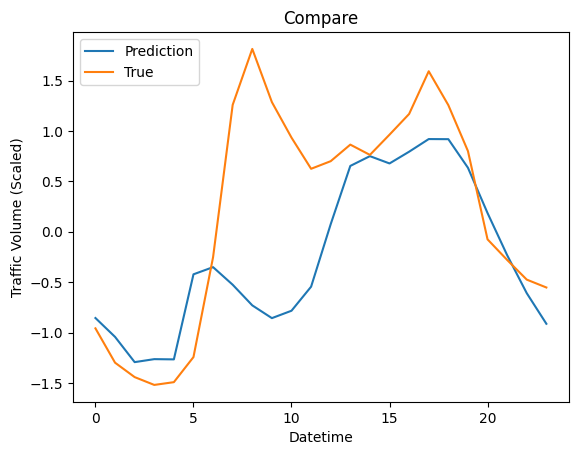

In [28]:
# Plot the training and validation accuracy
plt.plot(prediction)
plt.plot(true)
plt.title('Compare')
plt.xlabel('Datetime')
plt.ylabel('Traffic Volume (Scaled)')
plt.legend(['Prediction','True'], loc='upper left')
plt.show()

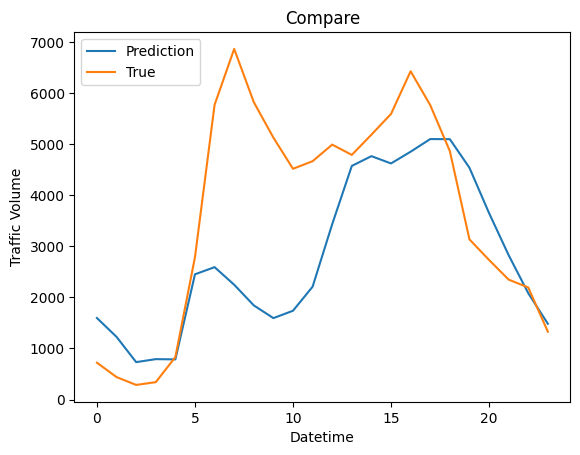

In [29]:
prediction_copies = np.repeat(prediction, df_processed.shape[1], axis = -1)
y_pred_future = scaler.inverse_transform(prediction_copies)[:,-1]

true = df_processed['traffic_volume'][-n_hours_for_prediction:].values

# Plot the training and validation accuracy
plt.plot(y_pred_future)
plt.plot(true)
plt.title('Compare')
plt.xlabel('Datetime')
plt.ylabel('Traffic Volume')
plt.legend(['Prediction','True'], loc='upper left')
plt.show()

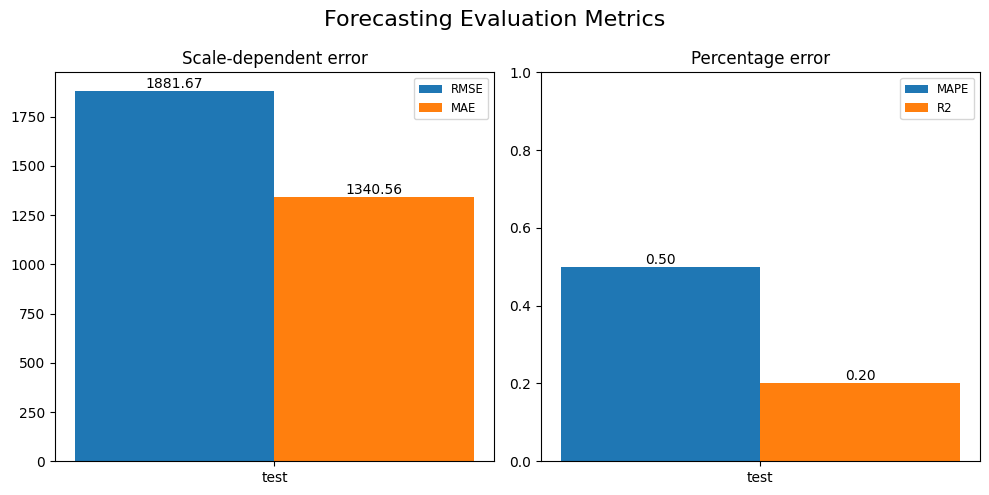

In [30]:
# Define the forecast measures
FORECAST_MEASURES = {
    "MSE": lambda actual, predicted: np.mean((actual - predicted) ** 2),
    "MAE": lambda actual, predicted: np.mean(abs(actual - predicted)),
    "MAPE": lambda actual, predicted: np.mean(abs((actual - predicted) / actual)),
    "R2": lambda actual, predicted: 1 - np.sum((actual - predicted) ** 2) / np.sum((actual - np.mean(actual)) ** 2),
}

# Compute evaluation metrics
ev1 = {
    "RMSE": [sqrt(FORECAST_MEASURES["MSE"](true, y_pred_future))],
    "MAE": [FORECAST_MEASURES["MAE"](true, y_pred_future)],
}
ev2 = {
    "MAPE": [FORECAST_MEASURES["MAPE"](true, y_pred_future)],
    "R2": [FORECAST_MEASURES["R2"](true, y_pred_future)],
}

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle("Forecasting Evaluation Metrics", fontsize=16)

# Plot scale-dependent error (e.g., RMSE, MAE)
group_labels = ["test"]
bar_labels = list(ev1.keys())
index = np.arange(len(group_labels))
bar_width = 0.8 / len(bar_labels)

axs[0].set_title("Scale-dependent error", fontsize=12)
axs[0].set_xlabel("")
axs[0].set_ylabel("")
axs[0].set_xticks(index + bar_width / 2)
axs[0].set_xticklabels(group_labels)

for i, label in enumerate(bar_labels):
    bar_values = ev1[label]
    values = axs[0].bar(
        index + i * bar_width,
        bar_values,
        width=bar_width,
        label=label
    )
    axs[0].bar_label(values, fmt="%.2f")
axs[0].legend(fontsize="small")

# Plot percentage error (e.g., MAPE, R2)
bar_labels = list(ev2.keys())
axs[1].set_title("Percentage error", fontsize=12)
axs[1].set_xlabel("")
axs[1].set_ylabel("")
axs[1].set_xticks(index + bar_width / 2)
axs[1].set_xticklabels(group_labels)
axs[1].set_ylim(0.0, 1.0)  # Percentage range

for i, label in enumerate(bar_labels):
    bar_values = ev2[label]
    values = axs[1].bar(
        index + i * bar_width,
        bar_values,
        width=bar_width,
        label=label
    )
    axs[1].bar_label(values, fmt="%.2f")
axs[1].legend(fontsize="small")

# Show the plots
plt.tight_layout()
plt.show()

In [31]:
# Retrieve the best hyperparameters from the tuner
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Print best hyperparameters
print(f"Best GRU Units: {best_hps.get('gru_units')}")
print(f"Extra Layer: {best_hps.get('extra_layer')}")
if best_hps.get('extra_layer'):  # If extra layer exists
    print(f"Best GRU Units for Second Layer: {best_hps.get('gru_units_2')}")
print(f"Best Learning Rate: {best_hps.get('learning_rate')}")

Best GRU Units: 192
Extra Layer: True
Best GRU Units for Second Layer: 16
Best Learning Rate: 0.0001


### Feature Importance

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━

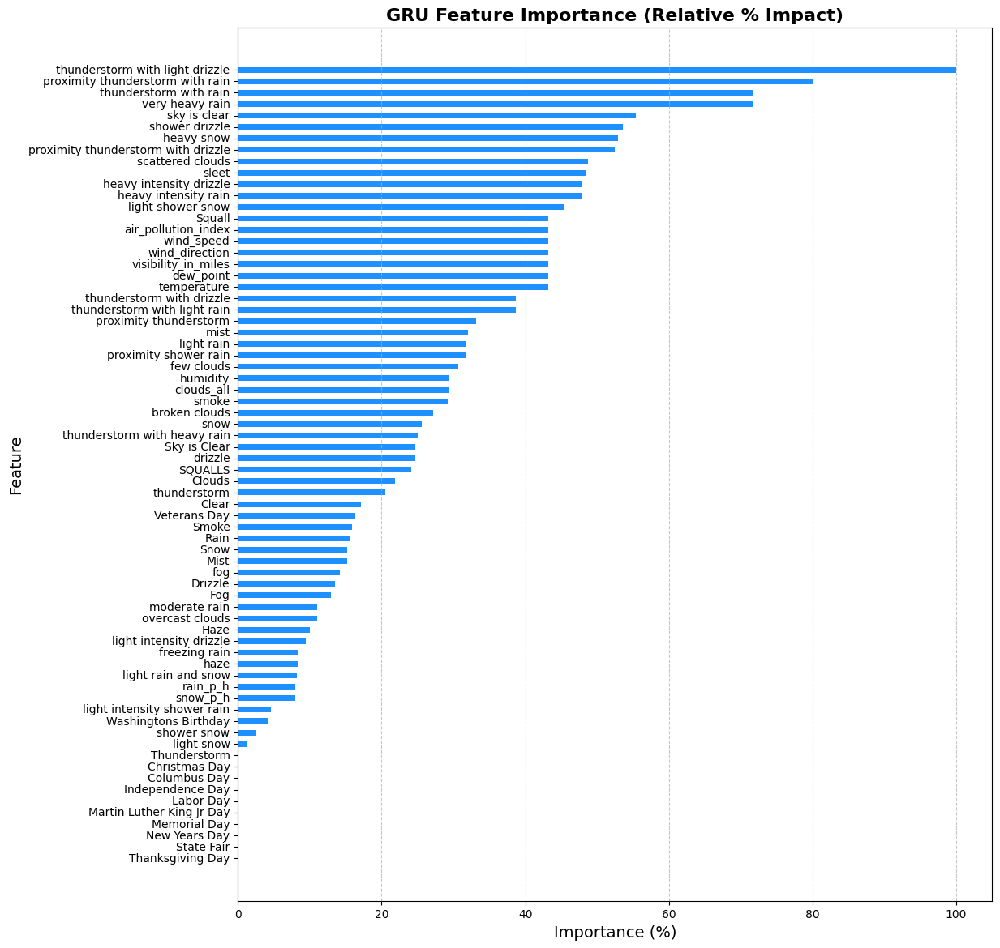

In [40]:
# Assuming df_processed is your dataframe and testX is already defined
feature_names = df_processed.columns[:-1]  # Replace with actual feature names

# Check if the feature names length matches the number of features in testX
if len(feature_names) != X_test.shape[2]:
    raise ValueError("The number of feature names does not match the number of features in X_test.")

n_days_for_prediction = 24

# Predictions for the last n_days_for_prediction days
prediction = best_model.predict(X_test[-n_days_for_prediction:])
true = Y_test[-n_days_for_prediction:]

# Compute the baseline error (absolute difference)
baseline_error = np.mean(np.abs(true - prediction))

# Initialize results list
results = []

# Function to compute feature importance for a given feature index
def compute_feature_importance(k):
    np.random.seed(42)  # Set seed for reproducibility
    
    saved_col = X_test[:, :, k].copy()  # Save original feature values
    
    # Shuffle the feature column
    np.random.shuffle(X_test[:, :, k])

    # Compute new predictions with shuffled feature
    shuffled_prediction = best_model.predict(X_test[-n_days_for_prediction:])
    
    # Compute error increase (absolute to avoid negative values)
    shuffled_error = np.mean(np.abs(true - shuffled_prediction))
    importance = abs(shuffled_error - baseline_error)  # Absolute difference to avoid negatives
    
    # Restore original feature values
    X_test[:, :, k] = saved_col
    
    return {'feature': feature_names[k], 'importance': importance}

# Parallelize the computation using ThreadPoolExecutor
with ThreadPoolExecutor() as executor:
    results = list(executor.map(compute_feature_importance, range(X_test.shape[2])))

# Normalize to percentages
max_importance = max([r['importance'] for r in results])  # Most important feature
for r in results:
    r['importance'] = (r['importance'] / max_importance) * 100  # Scale to percentage

# Sort features by importance (higher means more important)
sorted_results = sorted(results, key=lambda x: x['importance'], reverse=True)

# Extract sorted feature names and importance values
ordered_features = [item['feature'] for item in sorted_results]
ordered_importance = [item['importance'] for item in sorted_results]

# Print feature ranking
print("Features ranked from most to least important (in %):")
for rank, (feature, importance) in enumerate(zip(ordered_features, ordered_importance), 1):
    print(f"{rank}. {feature} ({importance:.2f}%)")

# Plot sorted feature importance with better y-axis spacing
plt.figure(figsize=(12, 14))  # Increase figure size
plt.barh(ordered_features, ordered_importance, color='dodgerblue', height=0.5)  # Adjust bar height
plt.gca().invert_yaxis()  # Most important feature at the top
plt.title('GRU Feature Importance (Relative % Impact)', fontsize=16, fontweight='bold')
plt.xlabel('Importance (%)', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Increase spacing between feature names on y-axis
plt.yticks(np.arange(len(ordered_features)), ordered_features, fontsize=12)  # Larger labels
plt.gca().set_yticklabels(ordered_features, fontsize=10, verticalalignment='center', linespacing=3)  # More spacing

plt.show()

### Feature Selection

In [42]:
# Set an importance threshold (e.g., 50%)
importance_threshold = 50

# Select features with importance above the threshold
selected_features_50 = [feature for feature, importance in zip(ordered_features, ordered_importance) if importance > importance_threshold]
selected_importance = [importance for importance in ordered_importance if importance > importance_threshold]

# Print selected features
print(f"Features selected with importance above {importance_threshold}%:")
for rank, (feature, importance) in enumerate(zip(selected_features_50, selected_importance), 1):
    print(f"{rank}. {feature} ({importance:.2f}%)")

Features selected with importance above 50%:
1. thunderstorm with light drizzle (100.00%)
2. proximity thunderstorm with rain (80.03%)
3. thunderstorm with rain (71.63%)
4. very heavy rain (71.63%)
5. sky is clear (55.37%)
6. shower drizzle (53.55%)
7. heavy snow (52.97%)
8. proximity thunderstorm with drizzle (52.50%)


In [47]:
# Predefined hyperparameters (based on your previous output)
gru_units = 192
extra_layer = True
gru_units_2 = 16
learning_rate = 0.0001

# Initialize variables
selected_features = []
best_features = []
best_performance = float('inf')  # Start with an infinitely bad performance to improve upon

# KFold Cross-validation
kf = KFold(n_splits=3, shuffle=True, random_state=42)

# Convert your data into DataFrames to easily manage feature subsets
feature_names = df_processed.columns[:-1]  # Replace with actual feature names
X_train_df = pd.DataFrame(X_train.reshape(-1, X_train.shape[2]), columns=feature_names)
X_test_df = pd.DataFrame(X_test.reshape(-1, X_test.shape[2]), columns=feature_names)

# Loop over features in the order of importance
for feature in selected_features_50:
    # Add the current feature to the selected features
    selected_features.append(feature)

    # Prepare data with selected features
    X_train_selected = X_train_df[selected_features].values.reshape(X_train.shape[0], X_train.shape[1], -1)  # Reshape to 3D
    X_test_selected = X_test_df[selected_features].values.reshape(X_test.shape[0], X_test.shape[1], -1)

    # KFold cross-validation for this set of features
    for train_idx, val_idx in kf.split(X_train_selected):
        X_train_fold, X_val_fold = X_train_selected[train_idx], X_train_selected[val_idx]
        Y_train_fold, Y_val_fold = Y_train[train_idx], Y_train[val_idx]

        model = Sequential()
        model.add(GRU(
            units=gru_units,
            return_sequences=True,
            input_shape=(X_train_fold.shape[1], X_train_fold.shape[2])
        ))
        if extra_layer:
            model.add(GRU(units=gru_units_2))
        model.add(Dense(1))
        model.compile(
            optimizer=Adam(learning_rate=learning_rate),
            loss='mse',
            metrics=['mae']
        )

        # Define model checkpoint callback
        cp = ModelCheckpoint(f'./best_models_features_gru/model_gru_features_{len(selected_features)}.keras', 
                            save_best_only=True, monitor='val_loss', mode='min', verbose=1)


        # Fit the model
        model.fit(X_train_fold, Y_train_fold, epochs=10, batch_size=16, validation_data=(X_val_fold, Y_val_fold), verbose=1, callbacks=[cp])

    # Evaluate the model on the test set
    predictions = model.predict(X_test_selected)
    performance = mean_squared_error(Y_test, predictions)  # MSE as performance metric
    print(f'Performance with features {selected_features}: {performance}')

    # Store the best model if performance improves
    if performance < best_performance:
        best_performance = performance
        best_features = selected_features.copy()

# Output the best selected features and performance
print("The best features were:", best_features)
print("Best performance (MSE):", best_performance)

Epoch 1/10


C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


406/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9963 - mae: 0.8789
Epoch 1: val_loss improved from inf to 0.98557, saving model to ./best_models_features_gru/model_gru_features_1.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 10s 19ms/step - loss: 0.9963 - mae: 0.8789 - val_loss: 0.9856 - val_mae: 0.8741
Epoch 2/10
406/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9730 - mae: 0.8657
Epoch 2: val_loss improved from 0.98557 to 0.98554, saving model to ./best_models_features_gru/model_gru_features_1.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - loss: 0.9730 - mae: 0.8657 - val_loss: 0.9855 - val_mae: 0.8723
Epoch 3/10
403/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9887 - mae: 0.8785
Epoch 3: val_loss improved from 0.98554 to 0.98505, saving model to ./best_models_features_gru/model_gru_features_1.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - loss: 0.9886 - mae: 0.8784 - val_loss: 0.9851 - val_mae: 0.8732
Epoch 4/10
405/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9992 - mae: 0.8

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


403/406 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9713 - mae: 0.8675
Epoch 1: val_loss improved from inf to 0.98586, saving model to ./best_models_features_gru/model_gru_features_2.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 10s 19ms/step - loss: 0.9715 - mae: 0.8675 - val_loss: 0.9859 - val_mae: 0.8741
Epoch 2/10
406/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9935 - mae: 0.8812
Epoch 2: val_loss improved from 0.98586 to 0.98496, saving model to ./best_models_features_gru/model_gru_features_2.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - loss: 0.9935 - mae: 0.8812 - val_loss: 0.9850 - val_mae: 0.8730
Epoch 3/10
406/406 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9756 - mae: 0.8697
Epoch 3: val_loss did not improve from 0.98496
406/406 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - loss: 0.9756 - mae: 0.8697 - val_loss: 0.9853 - val_mae: 0.8731
Epoch 4/10
403/406 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9942 - mae: 0.8801
Epoch 4: val_loss did not improve from 0.98496
406/406 ━━━━━━━━━━━━━━━━

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


405/406 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9784 - mae: 0.8698
Epoch 1: val_loss improved from inf to 0.98487, saving model to ./best_models_features_gru/model_gru_features_3.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - loss: 0.9784 - mae: 0.8698 - val_loss: 0.9849 - val_mae: 0.8732
Epoch 2/10
405/406 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9855 - mae: 0.8748
Epoch 2: val_loss improved from 0.98487 to 0.98485, saving model to ./best_models_features_gru/model_gru_features_3.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - loss: 0.9855 - mae: 0.8748 - val_loss: 0.9848 - val_mae: 0.8730
Epoch 3/10
404/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9815 - mae: 0.8711
Epoch 3: val_loss improved from 0.98485 to 0.98472, saving model to ./best_models_features_gru/model_gru_features_3.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - loss: 0.9815 - mae: 0.8712 - val_loss: 0.9847 - val_mae: 0.8733
Epoch 4/10
405/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9611 - mae: 0.86

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


404/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9873 - mae: 0.8758
Epoch 1: val_loss improved from inf to 0.98427, saving model to ./best_models_features_gru/model_gru_features_4.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 10s 19ms/step - loss: 0.9873 - mae: 0.8758 - val_loss: 0.9843 - val_mae: 0.8728
Epoch 2/10
406/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9833 - mae: 0.8749
Epoch 2: val_loss improved from 0.98427 to 0.98401, saving model to ./best_models_features_gru/model_gru_features_4.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - loss: 0.9833 - mae: 0.8749 - val_loss: 0.9840 - val_mae: 0.8717
Epoch 3/10
406/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9962 - mae: 0.8786
Epoch 3: val_loss improved from 0.98401 to 0.98394, saving model to ./best_models_features_gru/model_gru_features_4.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - loss: 0.9962 - mae: 0.8786 - val_loss: 0.9839 - val_mae: 0.8720
Epoch 4/10
405/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9803 - mae: 0.8

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


404/406 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9931 - mae: 0.8768
Epoch 1: val_loss improved from inf to 0.96988, saving model to ./best_models_features_gru/model_gru_features_5.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - loss: 0.9930 - mae: 0.8768 - val_loss: 0.9699 - val_mae: 0.8650
Epoch 2/10
403/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9680 - mae: 0.8660
Epoch 2: val_loss improved from 0.96988 to 0.96556, saving model to ./best_models_features_gru/model_gru_features_5.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - loss: 0.9680 - mae: 0.8660 - val_loss: 0.9656 - val_mae: 0.8591
Epoch 3/10
403/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9728 - mae: 0.8668
Epoch 3: val_loss improved from 0.96556 to 0.96137, saving model to ./best_models_features_gru/model_gru_features_5.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - loss: 0.9727 - mae: 0.8668 - val_loss: 0.9614 - val_mae: 0.8558
Epoch 4/10
405/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9626 - mae: 0.86

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


403/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9730 - mae: 0.8674
Epoch 1: val_loss improved from inf to 0.96423, saving model to ./best_models_features_gru/model_gru_features_6.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 10s 19ms/step - loss: 0.9730 - mae: 0.8674 - val_loss: 0.9642 - val_mae: 0.8601
Epoch 2/10
406/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9753 - mae: 0.8699
Epoch 2: val_loss improved from 0.96423 to 0.96367, saving model to ./best_models_features_gru/model_gru_features_6.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - loss: 0.9753 - mae: 0.8699 - val_loss: 0.9637 - val_mae: 0.8584
Epoch 3/10
403/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9689 - mae: 0.8664
Epoch 3: val_loss did not improve from 0.96367
406/406 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - loss: 0.9689 - mae: 0.8663 - val_loss: 0.9683 - val_mae: 0.8612
Epoch 4/10
404/406 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.9584 - mae: 0.8597
Epoch 4: val_loss did not improve from 0.96367
406/406 ━━━━━━━━━━━━━━━━

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


404/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 1.0018 - mae: 0.8793
Epoch 1: val_loss improved from inf to 0.96510, saving model to ./best_models_features_gru/model_gru_features_7.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - loss: 1.0017 - mae: 0.8793 - val_loss: 0.9651 - val_mae: 0.8580
Epoch 2/10
405/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9630 - mae: 0.8596
Epoch 2: val_loss did not improve from 0.96510
406/406 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - loss: 0.9631 - mae: 0.8597 - val_loss: 0.9729 - val_mae: 0.8582
Epoch 3/10
404/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9667 - mae: 0.8611
Epoch 3: val_loss improved from 0.96510 to 0.95647, saving model to ./best_models_features_gru/model_gru_features_7.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - loss: 0.9666 - mae: 0.8611 - val_loss: 0.9565 - val_mae: 0.8524
Epoch 4/10
405/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9759 - mae: 0.8654
Epoch 4: val_loss did not improve from 0.95647
406/406 ━━━━━━━━━━━━━━━━━

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


403/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9882 - mae: 0.8753
Epoch 1: val_loss improved from inf to 0.96214, saving model to ./best_models_features_gru/model_gru_features_8.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 10s 19ms/step - loss: 0.9880 - mae: 0.8752 - val_loss: 0.9621 - val_mae: 0.8589
Epoch 2/10
404/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9632 - mae: 0.8610
Epoch 2: val_loss improved from 0.96214 to 0.96074, saving model to ./best_models_features_gru/model_gru_features_8.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - loss: 0.9632 - mae: 0.8610 - val_loss: 0.9607 - val_mae: 0.8581
Epoch 3/10
403/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9550 - mae: 0.8557
Epoch 3: val_loss improved from 0.96074 to 0.95656, saving model to ./best_models_features_gru/model_gru_features_8.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - loss: 0.9550 - mae: 0.8557 - val_loss: 0.9566 - val_mae: 0.8554
Epoch 4/10
406/406 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.9486 - mae: 0.8

### Final Training

In [48]:
# Load the best model (from the last fold or the one with the best validation loss)
best_model_path = './best_models_features_gru/model_gru_features_6.keras'
best_model_lstm = load_model(best_model_path)

n_hours_for_prediction = 24

feature_names = df_processed.columns[:-1]

X_test_df = pd.DataFrame(X_test.reshape(-1, X_test.shape[2]), columns=feature_names)

X_test_selected = X_test_df[best_features].values.reshape(X_test.shape[0], X_test.shape[1], -1)

prediction = best_model_lstm.predict(X_test_selected[-n_hours_for_prediction:])


true = Y_test[-n_hours_for_prediction:]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


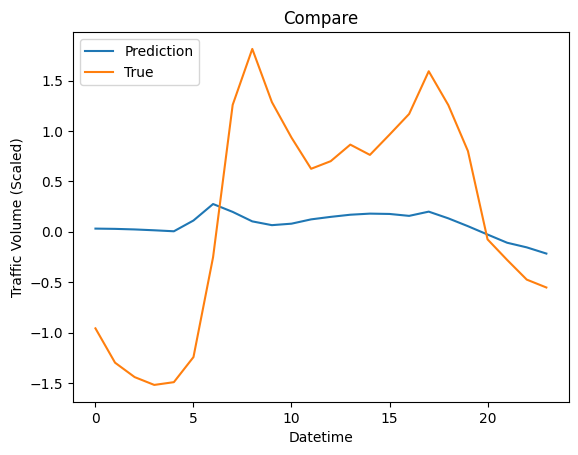

In [49]:
# Plot the training and validation accuracy
plt.plot(prediction)
plt.plot(true)
plt.title('Compare')
plt.xlabel('Datetime')
plt.ylabel('Traffic Volume (Scaled)')
plt.legend(['Prediction','True'], loc='upper left')
plt.show()

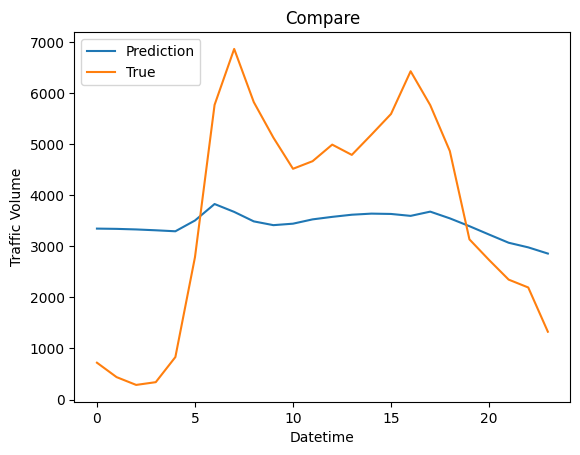

In [50]:
prediction_copies = np.repeat(prediction, df_processed.shape[1], axis = -1)
y_pred_future = scaler.inverse_transform(prediction_copies)[:,-1]

true = df_processed['traffic_volume'][-n_hours_for_prediction:].values

# Plot the training and validation accuracy
plt.plot(y_pred_future)
plt.plot(true)
plt.title('Compare')
plt.xlabel('Datetime')
plt.ylabel('Traffic Volume')
plt.legend(['Prediction','True'], loc='upper left')
plt.show()

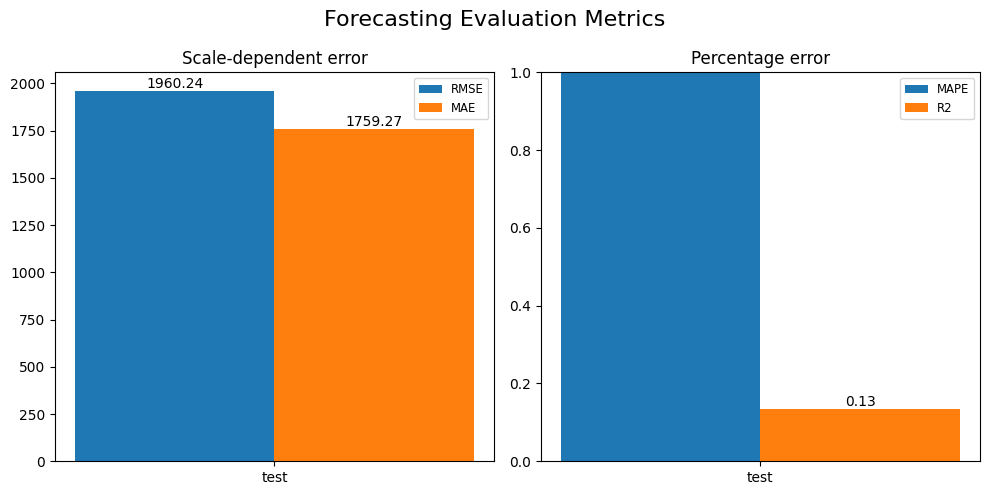

In [51]:
# Define the forecast measures
FORECAST_MEASURES = {
    "MSE": lambda actual, predicted: np.mean((actual - predicted) ** 2),
    "MAE": lambda actual, predicted: np.mean(abs(actual - predicted)),
    "MAPE": lambda actual, predicted: np.mean(abs((actual - predicted) / actual)),
    "R2": lambda actual, predicted: 1 - np.sum((actual - predicted) ** 2) / np.sum((actual - np.mean(actual)) ** 2),
}

# Compute evaluation metrics
ev1 = {
    "RMSE": [sqrt(FORECAST_MEASURES["MSE"](true, y_pred_future))],
    "MAE": [FORECAST_MEASURES["MAE"](true, y_pred_future)],
}
ev2 = {
    "MAPE": [FORECAST_MEASURES["MAPE"](true, y_pred_future)],
    "R2": [FORECAST_MEASURES["R2"](true, y_pred_future)],
}

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle("Forecasting Evaluation Metrics", fontsize=16)

# Plot scale-dependent error (e.g., RMSE, MAE)
group_labels = ["test"]
bar_labels = list(ev1.keys())
index = np.arange(len(group_labels))
bar_width = 0.8 / len(bar_labels)

axs[0].set_title("Scale-dependent error", fontsize=12)
axs[0].set_xlabel("")
axs[0].set_ylabel("")
axs[0].set_xticks(index + bar_width / 2)
axs[0].set_xticklabels(group_labels)

for i, label in enumerate(bar_labels):
    bar_values = ev1[label]
    values = axs[0].bar(
        index + i * bar_width,
        bar_values,
        width=bar_width,
        label=label
    )
    axs[0].bar_label(values, fmt="%.2f")
axs[0].legend(fontsize="small")

# Plot percentage error (e.g., MAPE, R2)
bar_labels = list(ev2.keys())
axs[1].set_title("Percentage error", fontsize=12)
axs[1].set_xlabel("")
axs[1].set_ylabel("")
axs[1].set_xticks(index + bar_width / 2)
axs[1].set_xticklabels(group_labels)
axs[1].set_ylim(0.0, 1.0)  # Percentage range

for i, label in enumerate(bar_labels):
    bar_values = ev2[label]
    values = axs[1].bar(
        index + i * bar_width,
        bar_values,
        width=bar_width,
        label=label
    )
    axs[1].bar_label(values, fmt="%.2f")
axs[1].legend(fontsize="small")

# Show the plots
plt.tight_layout()
plt.show()

## TCN

In [33]:
print((X_train.shape[1], X_train.shape[2]))

(48, 70)


In [33]:
# Function to build TCN model
def build_tcn_model(hp):
    model = Sequential()

    # Set the number of layers
    num_layers = hp.Int('num_layers', min_value=1, max_value=4, step=1)

    # Define the dilation values
    dilations = [1, 2, 4, 8]

    # Choose the activation function
    activation = hp.Choice('activation', ['relu', 'tanh', 'sigmoid', 'swish'])

    # Add the layers to the model
    for i in range(num_layers):
        # Select dilation values depending on the layer index
        dilation_rate = dilations[i % len(dilations)]  # Use cycling dilations

        # First layer: input shape
        if i == 0:
            model.add(InputLayer(input_shape=(48, 70)))  # Explicit input layer
            model.add(Conv1D(
                filters=hp.Int(f'nb_filters_{i}', min_value=16, max_value=128, step=16),
                kernel_size=hp.Choice(f'kernel_size_{i}', [2, 3, 5, 7]),
                dilation_rate=dilation_rate,  # Dilated convolutions
                activation=activation,  # Use the selected activation
                padding='causal',  # Causal padding for temporal data
                strides=1
            ))
            model.add(Dropout(hp.Float(f'dropout_rate_{i}', min_value=0.2, max_value=0.5, step=0.1)))  # Dropout after Conv1D
        else:
            # Subsequent layers with the same input shape
            model.add(Conv1D(
                filters=hp.Int(f'nb_filters_{i}', min_value=16, max_value=128, step=16),
                kernel_size=hp.Choice(f'kernel_size_{i}', [2, 3, 5]),
                dilation_rate=dilation_rate,  # Dilated convolutions
                activation=activation,  # Use the selected activation
                padding='causal',  # Causal padding for temporal data
                strides=1
            ))
            model.add(Dropout(hp.Float(f'dropout_rate_{i}', min_value=0.2, max_value=0.5, step=0.1)))  # Dropout after Conv1D

    # Final output layer
    model.add(Dense(1))  # Output layer for regression

    # Choose the optimizer with a variable learning rate
    learning_rate = hp.Float('learning_rate', min_value=1e-5, max_value=1e-2, sampling='log')
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error', metrics=['mae'])

    return model

# Keras Tuner - Bayesian Optimization
tuner = kt.BayesianOptimization(
    build_tcn_model,
    objective='val_loss',
    max_trials=50,
    executions_per_trial=2,
    directory='/tcn_tuning_final',
    project_name='traffic_forecasting',
    overwrite=True
)

# Run the hyperparameter search
tuner.search(X_train, Y_train, validation_data=(X_val, Y_val), epochs=50, batch_size=16, verbose=1)

# Retrieve the best model
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
best_model = tuner.hypermodel.build(best_hps)

# Train the best model
history = best_model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=50, batch_size=16, verbose=1)

# Evaluate the model on the test set
test_loss, test_mae = best_model.evaluate(X_test, Y_test)
print(f'Best Model Test Loss: {test_loss}, MAE: {test_mae}')

Trial 50 Complete [00h 02m 08s]
val_loss: 1.0745010375976562

Best val_loss So Far: 1.0745010375976562
Total elapsed time: 02h 20m 31s
Epoch 1/50
609/609 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.1550 - mae: 0.9156 - val_loss: 1.0974 - val_mae: 0.9098
Epoch 2/50
609/609 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0764 - mae: 0.9010 - val_loss: 1.0782 - val_mae: 0.9145
Epoch 3/50
609/609 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0351 - mae: 0.8883 - val_loss: 1.1073 - val_mae: 0.9357
Epoch 4/50
609/609 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0087 - mae: 0.8826 - val_loss: 1.1021 - val_mae: 0.9337
Epoch 5/50
609/609 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9955 - mae: 0.8767 - val_loss: 1.0843 - val_mae: 0.9250
Epoch 6/50
609/609 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9901 - mae: 0.8750 - val_loss: 1.0863 - val_mae: 0.9260
Epoch 7/50
609/609 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9847 - mae: 0.8718 - val_loss: 1.1035 - val_mae: 0.9343
Epoch 8/50
609/609 ━━━━━━━━━━━━━━━━━━━━

Predictions

In [36]:
n_hours_for_prediction = 24

prediction = best_model.predict(X_test[-n_hours_for_prediction:])

true = Y_test[-n_hours_for_prediction:]

prediction = prediction[:, -1, 0]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


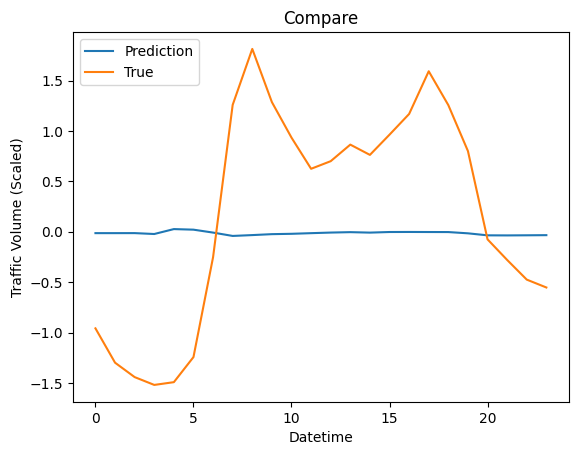

In [37]:
# Plot the training and validation accuracy
plt.plot(prediction)
plt.plot(true)
plt.title('Compare')
plt.xlabel('Datetime')
plt.ylabel('Traffic Volume (Scaled)')
plt.legend(['Prediction','True'], loc='upper left')
plt.show()

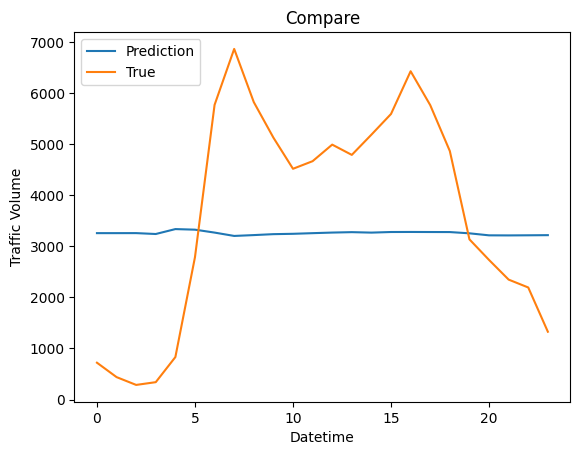

In [40]:
# Repeat the prediction for each feature (make sure the number of features is correct)
prediction_copies = np.repeat(prediction, df_processed.shape[1], axis=-1)  # Shape: (24, n_features)

# If you want to match the correct feature size, make sure prediction is reshaped correctly
prediction_copies = prediction_copies.reshape(-1, df_processed.shape[1])  # Reshape to (24, 71)

# Inverse transform the predictions
y_pred_future = scaler.inverse_transform(prediction_copies)[:,-1]  # Take the last column after inverse transform

true = df_processed['traffic_volume'][-n_hours_for_prediction:].values

# Plot the training and validation accuracy
plt.plot(y_pred_future)
plt.plot(true)
plt.title('Compare')
plt.xlabel('Datetime')
plt.ylabel('Traffic Volume')
plt.legend(['Prediction','True'], loc='upper left')
plt.show()


R2 value: -0.03495367101484659


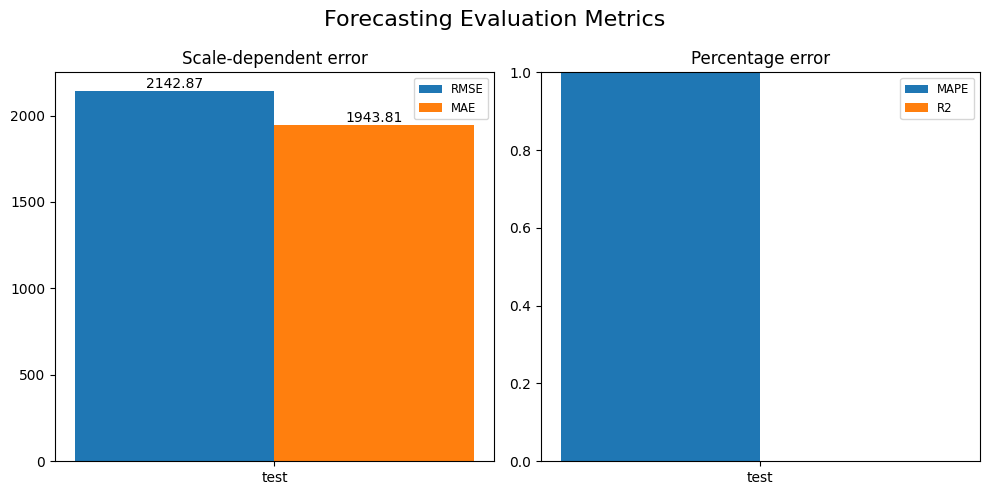

In [44]:
# Define the forecast measures
FORECAST_MEASURES = {
    "MSE": lambda actual, predicted: np.mean((actual - predicted) ** 2),
    "MAE": lambda actual, predicted: np.mean(abs(actual - predicted)),
    "MAPE": lambda actual, predicted: np.mean(abs((actual - predicted) / actual)),
    "R2": lambda actual, predicted: 1 - np.sum((actual - predicted) ** 2) / np.sum((actual - np.mean(actual)) ** 2) if np.sum((actual - np.mean(actual)) ** 2) != 0 else np.nan,  # Handle division by zero
}

# Compute evaluation metrics
ev1 = {
    "RMSE": [sqrt(FORECAST_MEASURES["MSE"](true, y_pred_future))],
    "MAE": [FORECAST_MEASURES["MAE"](true, y_pred_future)],
}
ev2 = {
    "MAPE": [FORECAST_MEASURES["MAPE"](true, y_pred_future)],
    "R2": [FORECAST_MEASURES["R2"](true, y_pred_future)],
}

# Check if R² is NaN
r2_value = FORECAST_MEASURES["R2"](true, y_pred_future)
print("R2 value:", r2_value)  # Check R² value in the console

# If R² is NaN, set it to a default value (e.g., 0)
if np.isnan(r2_value):
    r2_value = 0  # You can choose to set it to any default value
    print("R2 was NaN, setting it to 0")

# Update the evaluation metrics with the potentially adjusted R² value
ev2["R2"] = [r2_value]

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle("Forecasting Evaluation Metrics", fontsize=16)

# Plot scale-dependent error (e.g., RMSE, MAE)
group_labels = ["test"]
bar_labels = list(ev1.keys())
index = np.arange(len(group_labels))
bar_width = 0.8 / len(bar_labels)

axs[0].set_title("Scale-dependent error", fontsize=12)
axs[0].set_xlabel("")
axs[0].set_ylabel("")
axs[0].set_xticks(index + bar_width / 2)
axs[0].set_xticklabels(group_labels)

for i, label in enumerate(bar_labels):
    bar_values = ev1[label]
    values = axs[0].bar(
        index + i * bar_width,
        bar_values,
        width=bar_width,
        label=label
    )
    axs[0].bar_label(values, fmt="%.2f")
axs[0].legend(fontsize="small")

# Plot percentage error (e.g., MAPE, R2)
bar_labels = list(ev2.keys())
axs[1].set_title("Percentage error", fontsize=12)
axs[1].set_xlabel("")
axs[1].set_ylabel("")
axs[1].set_xticks(index + bar_width / 2)
axs[1].set_xticklabels(group_labels)
axs[1].set_ylim(0.0, 1.0)  # Percentage range

for i, label in enumerate(bar_labels):
    bar_values = ev2[label]
    values = axs[1].bar(
        index + i * bar_width,
        bar_values,
        width=bar_width,
        label=label
    )
    axs[1].bar_label(values, fmt="%.2f")
axs[1].legend(fontsize="small")

# Show the plots
plt.tight_layout()
plt.show()

In [49]:
# Retrieve the best hyperparameters from the tuner
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Print the hyperparameters for each layer
for i in range(best_hps.get('num_layers')):
    print(f"Best Filters for Layer {i}: {best_hps.get(f'nb_filters_{i}')}")
    print(f"Best Kernel Size for Layer {i}: {best_hps.get(f'kernel_size_{i}')}")
    print(f"Best Dropout Rate for Layer {i}: {best_hps.get(f'dropout_rate_{i}')}")
    
# Print the activation function for the model
print(f"Best Activation Function: {best_hps.get('activation')}")

# Print the learning rate
print(f"Best Learning Rate: {best_hps.get('learning_rate')}")


Best Filters for Layer 0: 112
Best Kernel Size for Layer 0: 2
Best Dropout Rate for Layer 0: 0.30000000000000004
Best Activation Function: sigmoid
Best Learning Rate: 0.0008618199234381954


### Feature Importance

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1

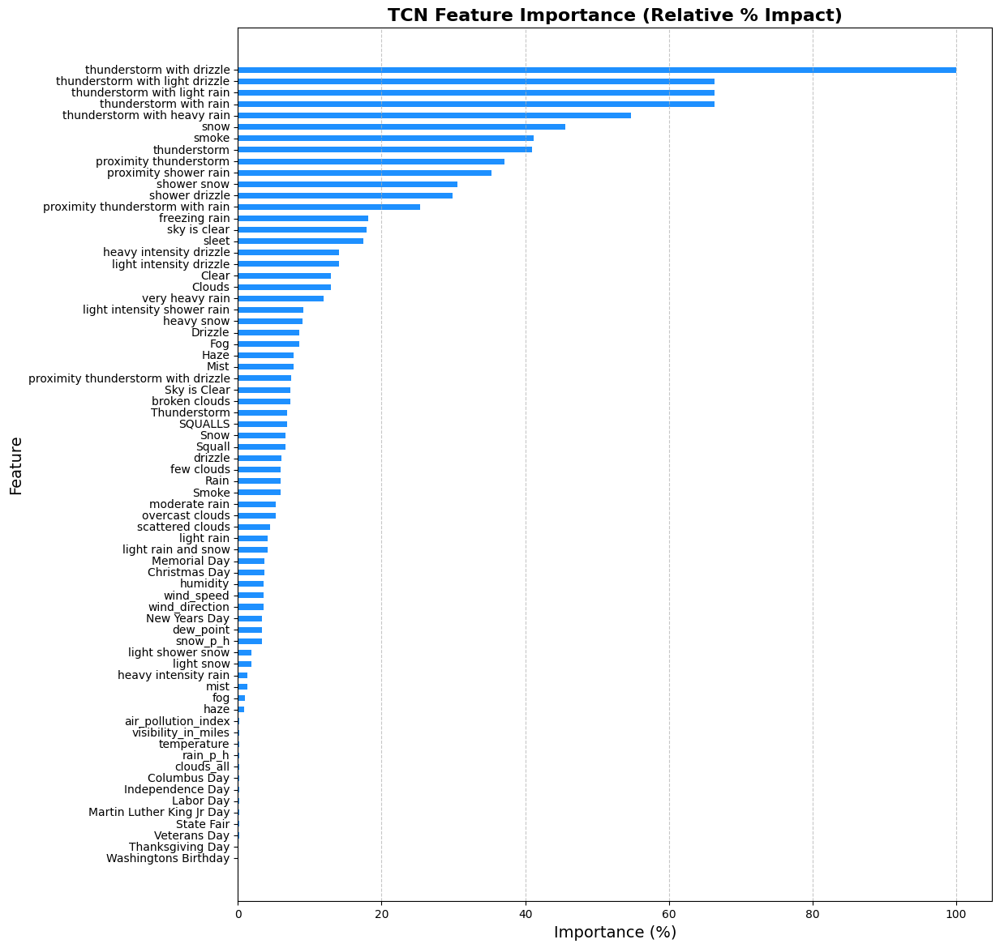

In [50]:
# Assuming df_processed is your dataframe and X_test, Y_test are defined
feature_names = df_processed.columns[:-1]  # Replace with actual feature names

# Check if the feature names length matches the number of features in X_test
if len(feature_names) != X_test.shape[2]:
    raise ValueError("The number of feature names does not match the number of features in X_test.")

n_days_for_prediction = 24  # Number of days for prediction

# Predictions for the last n_days_for_prediction days
prediction = best_model.predict(X_test[-n_days_for_prediction:])
true = Y_test[-n_days_for_prediction:]

# Compute the baseline error (absolute difference)
baseline_error = np.mean(np.abs(true - prediction))

# Initialize results list
results = []

# Function to compute feature importance for a given feature index
def compute_feature_importance(k):
    np.random.seed(42)  # Set seed for reproducibility
    
    saved_col = X_test[:, :, k].copy()  # Save original feature values
    
    # Shuffle the feature column
    np.random.shuffle(X_test[:, :, k])

    # Compute new predictions with shuffled feature
    shuffled_prediction = best_model.predict(X_test[-n_days_for_prediction:])
    
    # Compute error increase (absolute to avoid negative values)
    shuffled_error = np.mean(np.abs(true - shuffled_prediction))
    importance = abs(shuffled_error - baseline_error)  # Absolute difference to avoid negatives
    
    # Restore original feature values
    X_test[:, :, k] = saved_col
    
    return {'feature': feature_names[k], 'importance': importance}

# Parallelize the computation using ThreadPoolExecutor
with ThreadPoolExecutor() as executor:
    results = list(executor.map(compute_feature_importance, range(X_test.shape[2])))

# Normalize to percentages
max_importance = max([r['importance'] for r in results])  # Most important feature
for r in results:
    r['importance'] = (r['importance'] / max_importance) * 100  # Scale to percentage

# Sort features by importance (higher means more important)
sorted_results = sorted(results, key=lambda x: x['importance'], reverse=True)

# Extract sorted feature names and importance values
ordered_features = [item['feature'] for item in sorted_results]
ordered_importance = [item['importance'] for item in sorted_results]

# Print feature ranking
print("Features ranked from most to least important (in %):")
for rank, (feature, importance) in enumerate(zip(ordered_features, ordered_importance), 1):
    print(f"{rank}. {feature} ({importance:.2f}%)")

# Plot sorted feature importance with better y-axis spacing
plt.figure(figsize=(12, 14))  # Increase figure size
plt.barh(ordered_features, ordered_importance, color='dodgerblue', height=0.5)  # Adjust bar height
plt.gca().invert_yaxis()  # Most important feature at the top
plt.title('TCN Feature Importance (Relative % Impact)', fontsize=16, fontweight='bold')
plt.xlabel('Importance (%)', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Increase spacing between feature names on y-axis
plt.yticks(np.arange(len(ordered_features)), ordered_features, fontsize=12)  # Larger labels
plt.gca().set_yticklabels(ordered_features, fontsize=10, verticalalignment='center', linespacing=3)  # More spacing

plt.show()

### Feature Selection

In [80]:
# Predefined hyperparameters (based on your best parameters)
filters_layer_0 = 112
kernel_size_layer_0 = 2
dropout_rate_layer_0 = 0.3
activation_function = 'sigmoid'
learning_rate = 0.0008618199234381954

# Initialize variables
selected_features = []
best_features = []
best_performance = float('inf')  # Start with an infinitely bad performance to improve upon

# KFold Cross-validation
kf = KFold(n_splits=3, shuffle=True, random_state=42)

# Convert your data into DataFrames to easily manage feature subsets
feature_names = df_processed.columns[:-1]  # Replace with actual feature names
X_train_df = pd.DataFrame(X_train.reshape(-1, X_train.shape[2]), columns=feature_names)
X_test_df = pd.DataFrame(X_test.reshape(-1, X_test.shape[2]), columns=feature_names)

# Loop over features in the order of importance
for feature in ordered_features:
    # Add the current feature to the selected features
    selected_features.append(feature)

    # Prepare data with selected features
    X_train_selected = X_train_df[selected_features].values.reshape(X_train.shape[0], X_train.shape[1], -1)  # Reshape to 3D
    X_test_selected = X_test_df[selected_features].values.reshape(X_test.shape[0], X_test.shape[1], -1)

    # KFold cross-validation for this set of features
    for train_idx, val_idx in kf.split(X_train_selected):
        X_train_fold, X_val_fold = X_train_selected[train_idx], X_train_selected[val_idx]
        Y_train_fold, Y_val_fold = Y_train[train_idx], Y_train[val_idx]

        model = Sequential()
        
        # First layer: input shape
        model.add(Conv1D(
            filters=filters_layer_0, 
            kernel_size=kernel_size_layer_0,
            activation=activation_function, 
            padding='causal',  # Causal padding for temporal data
            strides=1,
            input_shape=(X_train_fold.shape[1], X_train_fold.shape[2])
        ))
        model.add(Dropout(dropout_rate_layer_0))  # Dropout after Conv1D
        
        # If more layers needed, you can add them here
        # Final output layer
        model.add(Dense(1))  # Output layer for regression

        # Choose the optimizer with the selected learning rate
        model.compile(
            optimizer=Adam(learning_rate=learning_rate),
            loss='mse',
            metrics=['mae']
        )

        # Define model checkpoint callback
        cp = ModelCheckpoint(f'./best_models_tcn/model_tcn_features_{len(selected_features)}.keras', 
                             save_best_only=True, monitor='val_loss', mode='min', verbose=1)

        # Fit the model
        model.fit(X_train_fold, Y_train_fold, epochs=50, batch_size=16, validation_data=(X_val_fold, Y_val_fold), verbose=1, callbacks=[cp])

    # Ensure correct flattening of both arrays
    predictions = model.predict(X_test_selected)
    predictions = predictions.flatten()  # Flatten predictions if needed
    predictions = predictions[:len(Y_test_flattened)]

    # Check shapes before computing performance
    print(f'Predictions shape: {predictions.shape}')
    print(f'Y_test shape: {Y_test.shape}')

    # Flatten Y_test if necessary
    Y_test_flattened = Y_test.flatten()

    # Now compute the performance
    performance = mean_squared_error(Y_test_flattened, predictions)
    print(f'Performance with features {selected_features}: {performance}')

    # Store the best model if performance improves
    if performance < best_performance:
        best_performance = performance
        best_features = selected_features.copy()

# Output the best selected features and performance
print("The best features were:", best_features)
print("Best performance (MSE):", best_performance)

Epoch 1/50


C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


428/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2154 - mae: 0.9391
Epoch 1: val_loss improved from inf to 1.08400, saving model to ./best_models_tcn/model_tcn_features_1.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2126 - mae: 0.9381 - val_loss: 1.0840 - val_mae: 0.9134
Epoch 2/50
445/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0929 - mae: 0.9023
Epoch 2: val_loss improved from 1.08400 to 0.98949, saving model to ./best_models_tcn/model_tcn_features_1.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0928 - mae: 0.9023 - val_loss: 0.9895 - val_mae: 0.8765
Epoch 3/50
433/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0491 - mae: 0.8913
Epoch 3: val_loss did not improve from 0.98949
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0490 - mae: 0.8912 - val_loss: 0.9982 - val_mae: 0.8807
Epoch 4/50
432/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0220 - mae: 0.8848
Epoch 4: val_loss improved from 0.98949 to 0.98531, saving model to ./best_models_tcn/model_tcn_f

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


433/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1956 - mae: 0.9276
Epoch 1: val_loss improved from inf to 0.98974, saving model to ./best_models_tcn/model_tcn_features_2.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.1943 - mae: 0.9274 - val_loss: 0.9897 - val_mae: 0.8767
Epoch 2/50
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0976 - mae: 0.9060
Epoch 2: val_loss improved from 0.98974 to 0.98690, saving model to ./best_models_tcn/model_tcn_features_2.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0975 - mae: 0.9060 - val_loss: 0.9869 - val_mae: 0.8714
Epoch 3/50
445/451 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0506 - mae: 0.8932
Epoch 3: val_loss improved from 0.98690 to 0.98626, saving model to ./best_models_tcn/model_tcn_features_2.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0505 - mae: 0.8932 - val_loss: 0.9863 - val_mae: 0.8742
Epoch 4/50
431/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0317 - mae: 0.8908
Epoch 4: val_loss did not impro

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2103 - mae: 0.9367
Epoch 1: val_loss improved from inf to 0.99776, saving model to ./best_models_tcn/model_tcn_features_3.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.2100 - mae: 0.9366 - val_loss: 0.9978 - val_mae: 0.8805
Epoch 2/50
439/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1133 - mae: 0.9130
Epoch 2: val_loss improved from 0.99776 to 0.98655, saving model to ./best_models_tcn/model_tcn_features_3.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1125 - mae: 0.9127 - val_loss: 0.9866 - val_mae: 0.8714
Epoch 3/50
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0658 - mae: 0.8995
Epoch 3: val_loss improved from 0.98655 to 0.98543, saving model to ./best_models_tcn/model_tcn_features_3.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0657 - mae: 0.8995 - val_loss: 0.9854 - val_mae: 0.8722
Epoch 4/50
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0259 - mae: 0.8855
Epoch 4: val_loss did not impro

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


446/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2278 - mae: 0.9406
Epoch 1: val_loss improved from inf to 0.98660, saving model to ./best_models_tcn/model_tcn_features_4.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.2270 - mae: 0.9403 - val_loss: 0.9866 - val_mae: 0.8745
Epoch 2/50
446/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1144 - mae: 0.9115
Epoch 2: val_loss did not improve from 0.98660
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1140 - mae: 0.9113 - val_loss: 0.9868 - val_mae: 0.8747
Epoch 3/50
431/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0558 - mae: 0.8989
Epoch 3: val_loss improved from 0.98660 to 0.98590, saving model to ./best_models_tcn/model_tcn_features_4.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0552 - mae: 0.8985 - val_loss: 0.9859 - val_mae: 0.8739
Epoch 4/50
440/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0159 - mae: 0.8814
Epoch 4: val_loss did not improve from 0.98590
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


437/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2066 - mae: 0.9337
Epoch 1: val_loss improved from inf to 0.98775, saving model to ./best_models_tcn/model_tcn_features_5.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 1.2055 - mae: 0.9334 - val_loss: 0.9877 - val_mae: 0.8754
Epoch 2/50
434/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1114 - mae: 0.9089
Epoch 2: val_loss did not improve from 0.98775
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1105 - mae: 0.9087 - val_loss: 0.9923 - val_mae: 0.8780
Epoch 3/50
437/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0475 - mae: 0.8894
Epoch 3: val_loss did not improve from 0.98775
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0476 - mae: 0.8895 - val_loss: 0.9879 - val_mae: 0.8755
Epoch 4/50
434/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0314 - mae: 0.8905
Epoch 4: val_loss did not improve from 0.98775
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0312 - mae: 0.8904 - val_loss: 0.9893 - val_mae: 0.8764
Epoch 5/5

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2101 - mae: 0.9357
Epoch 1: val_loss improved from inf to 0.98788, saving model to ./best_models_tcn/model_tcn_features_6.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2093 - mae: 0.9355 - val_loss: 0.9879 - val_mae: 0.8755
Epoch 2/50
422/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0972 - mae: 0.9054
Epoch 2: val_loss improved from 0.98788 to 0.98534, saving model to ./best_models_tcn/model_tcn_features_6.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0966 - mae: 0.9053 - val_loss: 0.9853 - val_mae: 0.8731
Epoch 3/50
443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0596 - mae: 0.9006
Epoch 3: val_loss did not improve from 0.98534
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0593 - mae: 0.9004 - val_loss: 0.9861 - val_mae: 0.8741
Epoch 4/50
447/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0308 - mae: 0.8920
Epoch 4: val_loss did not improve from 0.98534
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1762 - mae: 0.9232
Epoch 1: val_loss improved from inf to 0.98573, saving model to ./best_models_tcn/model_tcn_features_7.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1761 - mae: 0.9231 - val_loss: 0.9857 - val_mae: 0.8733
Epoch 2/50
434/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0874 - mae: 0.8990
Epoch 2: val_loss did not improve from 0.98573
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0872 - mae: 0.8991 - val_loss: 0.9874 - val_mae: 0.8752
Epoch 3/50
426/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0535 - mae: 0.8937
Epoch 3: val_loss did not improve from 0.98573
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0530 - mae: 0.8936 - val_loss: 0.9906 - val_mae: 0.8705
Epoch 4/50
443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0303 - mae: 0.8884
Epoch 4: val_loss did not improve from 0.98573
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0302 - mae: 0.8884 - val_loss: 1.0026 - val_mae: 0.8700
Epoch 5/5

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1934 - mae: 0.9311
Epoch 1: val_loss improved from inf to 0.98608, saving model to ./best_models_tcn/model_tcn_features_8.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.1934 - mae: 0.9311 - val_loss: 0.9861 - val_mae: 0.8740
Epoch 2/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0953 - mae: 0.9038
Epoch 2: val_loss did not improve from 0.98608
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0953 - mae: 0.9038 - val_loss: 0.9869 - val_mae: 0.8747
Epoch 3/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0616 - mae: 0.8971
Epoch 3: val_loss improved from 0.98608 to 0.98536, saving model to ./best_models_tcn/model_tcn_features_8.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0616 - mae: 0.8971 - val_loss: 0.9854 - val_mae: 0.8727
Epoch 4/50
432/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0234 - mae: 0.8853
Epoch 4: val_loss did not improve from 0.98536
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1988 - mae: 0.9333
Epoch 1: val_loss improved from inf to 0.98617, saving model to ./best_models_tcn/model_tcn_features_9.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1987 - mae: 0.9333 - val_loss: 0.9862 - val_mae: 0.8740
Epoch 2/50
443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0870 - mae: 0.8991
Epoch 2: val_loss did not improve from 0.98617
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0870 - mae: 0.8992 - val_loss: 0.9887 - val_mae: 0.8707
Epoch 3/50
440/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0634 - mae: 0.8971
Epoch 3: val_loss did not improve from 0.98617
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0629 - mae: 0.8969 - val_loss: 0.9878 - val_mae: 0.8754
Epoch 4/50
442/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0214 - mae: 0.8827
Epoch 4: val_loss did not improve from 0.98617
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0215 - mae: 0.8828 - val_loss: 0.9946 - val_mae: 0.8791
Epoch 5/5

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1491 - mae: 0.9175
Epoch 1: val_loss improved from inf to 0.98682, saving model to ./best_models_tcn/model_tcn_features_10.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1491 - mae: 0.9175 - val_loss: 0.9868 - val_mae: 0.8746
Epoch 2/50
432/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0789 - mae: 0.9017
Epoch 2: val_loss did not improve from 0.98682
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0786 - mae: 0.9016 - val_loss: 0.9897 - val_mae: 0.8766
Epoch 3/50
430/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0284 - mae: 0.8864
Epoch 3: val_loss improved from 0.98682 to 0.98602, saving model to ./best_models_tcn/model_tcn_features_10.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0290 - mae: 0.8866 - val_loss: 0.9860 - val_mae: 0.8739
Epoch 4/50
425/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0174 - mae: 0.8817
Epoch 4: val_loss improved from 0.98602 to 0.98588, saving model to ./best_models_tcn/model_tcn

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


433/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1813 - mae: 0.9243
Epoch 1: val_loss improved from inf to 0.98811, saving model to ./best_models_tcn/model_tcn_features_11.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.1802 - mae: 0.9241 - val_loss: 0.9881 - val_mae: 0.8710
Epoch 2/50
444/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0890 - mae: 0.9011
Epoch 2: val_loss improved from 0.98811 to 0.98553, saving model to ./best_models_tcn/model_tcn_features_11.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0888 - mae: 0.9011 - val_loss: 0.9855 - val_mae: 0.8730
Epoch 3/50
438/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0560 - mae: 0.8940
Epoch 3: val_loss did not improve from 0.98553
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0557 - mae: 0.8939 - val_loss: 0.9860 - val_mae: 0.8740
Epoch 4/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0259 - mae: 0.8853
Epoch 4: val_loss did not improve from 0.98553
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


441/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1886 - mae: 0.9302
Epoch 1: val_loss improved from inf to 0.99211, saving model to ./best_models_tcn/model_tcn_features_12.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.1878 - mae: 0.9299 - val_loss: 0.9921 - val_mae: 0.8779
Epoch 2/50
440/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0784 - mae: 0.8969
Epoch 2: val_loss improved from 0.99211 to 0.98611, saving model to ./best_models_tcn/model_tcn_features_12.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0784 - mae: 0.8970 - val_loss: 0.9861 - val_mae: 0.8741
Epoch 3/50
421/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0311 - mae: 0.8829
Epoch 3: val_loss improved from 0.98611 to 0.98548, saving model to ./best_models_tcn/model_tcn_features_12.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0318 - mae: 0.8835 - val_loss: 0.9855 - val_mae: 0.8733
Epoch 4/50
442/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0281 - mae: 0.8905
Epoch 4: val_loss did not im

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


445/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3087 - mae: 0.9608
Epoch 1: val_loss improved from inf to 0.98990, saving model to ./best_models_tcn/model_tcn_features_13.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.3068 - mae: 0.9603 - val_loss: 0.9899 - val_mae: 0.8707
Epoch 2/50
442/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1119 - mae: 0.9091
Epoch 2: val_loss improved from 0.98990 to 0.98656, saving model to ./best_models_tcn/model_tcn_features_13.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1114 - mae: 0.9090 - val_loss: 0.9866 - val_mae: 0.8716
Epoch 3/50
438/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0604 - mae: 0.8956
Epoch 3: val_loss did not improve from 0.98656
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0601 - mae: 0.8956 - val_loss: 0.9873 - val_mae: 0.8711
Epoch 4/50
427/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0395 - mae: 0.8934
Epoch 4: val_loss did not improve from 0.98656
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


430/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2009 - mae: 0.9322
Epoch 1: val_loss improved from inf to 0.98565, saving model to ./best_models_tcn/model_tcn_features_14.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1996 - mae: 0.9319 - val_loss: 0.9857 - val_mae: 0.8727
Epoch 2/50
425/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1152 - mae: 0.9131
Epoch 2: val_loss did not improve from 0.98565
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1136 - mae: 0.9125 - val_loss: 0.9971 - val_mae: 0.8802
Epoch 3/50
433/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0599 - mae: 0.8942
Epoch 3: val_loss did not improve from 0.98565
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0595 - mae: 0.8941 - val_loss: 0.9911 - val_mae: 0.8704
Epoch 4/50
446/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0275 - mae: 0.8843
Epoch 4: val_loss did not improve from 0.98565
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0275 - mae: 0.8843 - val_loss: 0.9857 - val_mae: 0.8737
Epoch 5/

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1975 - mae: 0.9325
Epoch 1: val_loss improved from inf to 0.98561, saving model to ./best_models_tcn/model_tcn_features_15.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1974 - mae: 0.9325 - val_loss: 0.9856 - val_mae: 0.8724
Epoch 2/50
443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0908 - mae: 0.9036
Epoch 2: val_loss did not improve from 0.98561
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0906 - mae: 0.9035 - val_loss: 0.9867 - val_mae: 0.8715
Epoch 3/50
438/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0355 - mae: 0.8865
Epoch 3: val_loss did not improve from 0.98561
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0357 - mae: 0.8867 - val_loss: 0.9962 - val_mae: 0.8798
Epoch 4/50
447/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0249 - mae: 0.8877
Epoch 4: val_loss did not improve from 0.98561
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0249 - mae: 0.8876 - val_loss: 0.9866 - val_mae: 0.8745
Epoch 5/

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


432/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2299 - mae: 0.9455
Epoch 1: val_loss improved from inf to 1.06633, saving model to ./best_models_tcn/model_tcn_features_16.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.2275 - mae: 0.9446 - val_loss: 1.0663 - val_mae: 0.9067
Epoch 2/50
441/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1128 - mae: 0.9108
Epoch 2: val_loss improved from 1.06633 to 1.01294, saving model to ./best_models_tcn/model_tcn_features_16.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1123 - mae: 0.9107 - val_loss: 1.0129 - val_mae: 0.8867
Epoch 3/50
433/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0613 - mae: 0.8969
Epoch 3: val_loss improved from 1.01294 to 0.98676, saving model to ./best_models_tcn/model_tcn_features_16.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0608 - mae: 0.8968 - val_loss: 0.9868 - val_mae: 0.8716
Epoch 4/50
446/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0521 - mae: 0.8992
Epoch 4: val_loss improved f

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


437/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2146 - mae: 0.9376
Epoch 1: val_loss improved from inf to 0.99344, saving model to ./best_models_tcn/model_tcn_features_17.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.2134 - mae: 0.9372 - val_loss: 0.9934 - val_mae: 0.8785
Epoch 2/50
446/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0997 - mae: 0.9017
Epoch 2: val_loss improved from 0.99344 to 0.98852, saving model to ./best_models_tcn/model_tcn_features_17.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0996 - mae: 0.9017 - val_loss: 0.9885 - val_mae: 0.8759
Epoch 3/50
433/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0669 - mae: 0.9012
Epoch 3: val_loss did not improve from 0.98852
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0661 - mae: 0.9009 - val_loss: 0.9912 - val_mae: 0.8707
Epoch 4/50
429/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0343 - mae: 0.8883
Epoch 4: val_loss improved from 0.98852 to 0.98559, saving model to ./best_models_tcn/model_tcn

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


436/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1812 - mae: 0.9249
Epoch 1: val_loss improved from inf to 0.98834, saving model to ./best_models_tcn/model_tcn_features_18.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.1806 - mae: 0.9249 - val_loss: 0.9883 - val_mae: 0.8711
Epoch 2/50
423/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0929 - mae: 0.9016
Epoch 2: val_loss improved from 0.98834 to 0.98598, saving model to ./best_models_tcn/model_tcn_features_18.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0923 - mae: 0.9016 - val_loss: 0.9860 - val_mae: 0.8728
Epoch 3/50
432/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0688 - mae: 0.9011
Epoch 3: val_loss did not improve from 0.98598
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0678 - mae: 0.9007 - val_loss: 0.9981 - val_mae: 0.8806
Epoch 4/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0291 - mae: 0.8886
Epoch 4: val_loss did not improve from 0.98598
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


432/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2252 - mae: 0.9399
Epoch 1: val_loss improved from inf to 0.98974, saving model to ./best_models_tcn/model_tcn_features_19.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.2220 - mae: 0.9391 - val_loss: 0.9897 - val_mae: 0.8706
Epoch 2/50
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0798 - mae: 0.8966
Epoch 2: val_loss improved from 0.98974 to 0.98895, saving model to ./best_models_tcn/model_tcn_features_19.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0798 - mae: 0.8966 - val_loss: 0.9890 - val_mae: 0.8762
Epoch 3/50
431/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0446 - mae: 0.8918
Epoch 3: val_loss improved from 0.98895 to 0.98782, saving model to ./best_models_tcn/model_tcn_features_19.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0445 - mae: 0.8918 - val_loss: 0.9878 - val_mae: 0.8752
Epoch 4/50
428/451 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0283 - mae: 0.8887
Epoch 4: val_loss improved f

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.2061 - mae: 0.9353
Epoch 1: val_loss improved from inf to 0.98579, saving model to ./best_models_tcn/model_tcn_features_20.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2060 - mae: 0.9352 - val_loss: 0.9858 - val_mae: 0.8729
Epoch 2/50
418/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1088 - mae: 0.9074
Epoch 2: val_loss did not improve from 0.98579
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1073 - mae: 0.9070 - val_loss: 0.9883 - val_mae: 0.8711
Epoch 3/50
435/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0476 - mae: 0.8904
Epoch 3: val_loss improved from 0.98579 to 0.98536, saving model to ./best_models_tcn/model_tcn_features_20.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0477 - mae: 0.8905 - val_loss: 0.9854 - val_mae: 0.8732
Epoch 4/50
447/451 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0318 - mae: 0.8871
Epoch 4: val_loss did not improve from 0.98536
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


434/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2988 - mae: 0.9566
Epoch 1: val_loss improved from inf to 0.98860, saving model to ./best_models_tcn/model_tcn_features_21.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2946 - mae: 0.9556 - val_loss: 0.9886 - val_mae: 0.8759
Epoch 2/50
445/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1154 - mae: 0.9119
Epoch 2: val_loss improved from 0.98860 to 0.98603, saving model to ./best_models_tcn/model_tcn_features_21.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1151 - mae: 0.9118 - val_loss: 0.9860 - val_mae: 0.8726
Epoch 3/50
434/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0392 - mae: 0.8826
Epoch 3: val_loss did not improve from 0.98603
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0397 - mae: 0.8830 - val_loss: 0.9881 - val_mae: 0.8713
Epoch 4/50
438/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0404 - mae: 0.8937
Epoch 4: val_loss did not improve from 0.98603
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


442/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1836 - mae: 0.9289
Epoch 1: val_loss improved from inf to 0.99018, saving model to ./best_models_tcn/model_tcn_features_22.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.1828 - mae: 0.9287 - val_loss: 0.9902 - val_mae: 0.8705
Epoch 2/50
443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0835 - mae: 0.9009
Epoch 2: val_loss improved from 0.99018 to 0.98838, saving model to ./best_models_tcn/model_tcn_features_22.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0834 - mae: 0.9009 - val_loss: 0.9884 - val_mae: 0.8709
Epoch 3/50
439/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0588 - mae: 0.8961
Epoch 3: val_loss improved from 0.98838 to 0.98613, saving model to ./best_models_tcn/model_tcn_features_22.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0583 - mae: 0.8959 - val_loss: 0.9861 - val_mae: 0.8739
Epoch 4/50
447/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0254 - mae: 0.8874
Epoch 4: val_loss did not im

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


436/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2382 - mae: 0.9425
Epoch 1: val_loss improved from inf to 0.98577, saving model to ./best_models_tcn/model_tcn_features_23.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2360 - mae: 0.9419 - val_loss: 0.9858 - val_mae: 0.8730
Epoch 2/50
431/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1245 - mae: 0.9163
Epoch 2: val_loss did not improve from 0.98577
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1229 - mae: 0.9158 - val_loss: 0.9972 - val_mae: 0.8802
Epoch 3/50
447/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0510 - mae: 0.8954
Epoch 3: val_loss did not improve from 0.98577
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0509 - mae: 0.8953 - val_loss: 1.0017 - val_mae: 0.8821
Epoch 4/50
432/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0438 - mae: 0.8938
Epoch 4: val_loss improved from 0.98577 to 0.98537, saving model to ./best_models_tcn/model_tcn_features_23.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


432/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1936 - mae: 0.9336
Epoch 1: val_loss improved from inf to 1.01329, saving model to ./best_models_tcn/model_tcn_features_24.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1916 - mae: 0.9329 - val_loss: 1.0133 - val_mae: 0.8869
Epoch 2/50
443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0876 - mae: 0.9026
Epoch 2: val_loss improved from 1.01329 to 0.98650, saving model to ./best_models_tcn/model_tcn_features_24.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0874 - mae: 0.9026 - val_loss: 0.9865 - val_mae: 0.8742
Epoch 3/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0498 - mae: 0.8962
Epoch 3: val_loss did not improve from 0.98650
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0498 - mae: 0.8962 - val_loss: 0.9918 - val_mae: 0.8777
Epoch 4/50
446/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0175 - mae: 0.8851
Epoch 4: val_loss improved from 0.98650 to 0.98534, saving model to ./best_models_tcn/model_tcn

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


437/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3186 - mae: 0.9699
Epoch 1: val_loss improved from inf to 0.98963, saving model to ./best_models_tcn/model_tcn_features_25.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.3147 - mae: 0.9687 - val_loss: 0.9896 - val_mae: 0.8765
Epoch 2/50
436/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1147 - mae: 0.9102
Epoch 2: val_loss did not improve from 0.98963
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1141 - mae: 0.9100 - val_loss: 0.9915 - val_mae: 0.8776
Epoch 3/50
446/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0646 - mae: 0.8981
Epoch 3: val_loss improved from 0.98963 to 0.98633, saving model to ./best_models_tcn/model_tcn_features_25.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0645 - mae: 0.8981 - val_loss: 0.9863 - val_mae: 0.8746
Epoch 4/50
429/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0382 - mae: 0.8923
Epoch 4: val_loss did not improve from 0.98633
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


436/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1938 - mae: 0.9301
Epoch 1: val_loss improved from inf to 0.98957, saving model to ./best_models_tcn/model_tcn_features_26.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1929 - mae: 0.9298 - val_loss: 0.9896 - val_mae: 0.8763
Epoch 2/50
433/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0994 - mae: 0.9042
Epoch 2: val_loss improved from 0.98957 to 0.98561, saving model to ./best_models_tcn/model_tcn_features_26.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0990 - mae: 0.9042 - val_loss: 0.9856 - val_mae: 0.8725
Epoch 3/50
441/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0507 - mae: 0.8897
Epoch 3: val_loss did not improve from 0.98561
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0507 - mae: 0.8898 - val_loss: 0.9868 - val_mae: 0.8748
Epoch 4/50
436/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0454 - mae: 0.8969
Epoch 4: val_loss did not improve from 0.98561
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


444/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2166 - mae: 0.9392
Epoch 1: val_loss improved from inf to 0.98710, saving model to ./best_models_tcn/model_tcn_features_27.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2158 - mae: 0.9389 - val_loss: 0.9871 - val_mae: 0.8744
Epoch 2/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0845 - mae: 0.8981
Epoch 2: val_loss did not improve from 0.98710
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0845 - mae: 0.8981 - val_loss: 1.0086 - val_mae: 0.8850
Epoch 3/50
447/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0526 - mae: 0.8958
Epoch 3: val_loss improved from 0.98710 to 0.98527, saving model to ./best_models_tcn/model_tcn_features_27.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0525 - mae: 0.8958 - val_loss: 0.9853 - val_mae: 0.8721
Epoch 4/50
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0305 - mae: 0.8899
Epoch 4: val_loss did not improve from 0.98527
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


447/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1799 - mae: 0.9242
Epoch 1: val_loss improved from inf to 0.98901, saving model to ./best_models_tcn/model_tcn_features_28.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1797 - mae: 0.9241 - val_loss: 0.9890 - val_mae: 0.8760
Epoch 2/50
441/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0932 - mae: 0.9039
Epoch 2: val_loss improved from 0.98901 to 0.98731, saving model to ./best_models_tcn/model_tcn_features_28.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0928 - mae: 0.9038 - val_loss: 0.9873 - val_mae: 0.8750
Epoch 3/50
434/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0479 - mae: 0.8934
Epoch 3: val_loss did not improve from 0.98731
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0476 - mae: 0.8933 - val_loss: 1.0023 - val_mae: 0.8701
Epoch 4/50
430/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0313 - mae: 0.8901
Epoch 4: val_loss did not improve from 0.98731
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


445/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1942 - mae: 0.9292
Epoch 1: val_loss improved from inf to 0.98529, saving model to ./best_models_tcn/model_tcn_features_29.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1937 - mae: 0.9291 - val_loss: 0.9853 - val_mae: 0.8722
Epoch 2/50
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0991 - mae: 0.9071
Epoch 2: val_loss did not improve from 0.98529
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0989 - mae: 0.9071 - val_loss: 0.9862 - val_mae: 0.8742
Epoch 3/50
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0453 - mae: 0.8928
Epoch 3: val_loss did not improve from 0.98529
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0452 - mae: 0.8928 - val_loss: 0.9872 - val_mae: 0.8743
Epoch 4/50
435/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0276 - mae: 0.8875
Epoch 4: val_loss did not improve from 0.98529
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0274 - mae: 0.8874 - val_loss: 0.9855 - val_mae: 0.8738
Epoch 5/

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


441/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2037 - mae: 0.9290
Epoch 1: val_loss improved from inf to 0.99230, saving model to ./best_models_tcn/model_tcn_features_30.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2031 - mae: 0.9289 - val_loss: 0.9923 - val_mae: 0.8703
Epoch 2/50
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1064 - mae: 0.9078
Epoch 2: val_loss did not improve from 0.99230
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1062 - mae: 0.9077 - val_loss: 0.9945 - val_mae: 0.8792
Epoch 3/50
429/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0452 - mae: 0.8877
Epoch 3: val_loss improved from 0.99230 to 0.98877, saving model to ./best_models_tcn/model_tcn_features_30.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0453 - mae: 0.8880 - val_loss: 0.9888 - val_mae: 0.8709
Epoch 4/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0267 - mae: 0.8863
Epoch 4: val_loss improved from 0.98877 to 0.98728, saving model to ./best_models_tcn/model_tcn

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1815 - mae: 0.9254
Epoch 1: val_loss improved from inf to 0.98961, saving model to ./best_models_tcn/model_tcn_features_31.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1814 - mae: 0.9254 - val_loss: 0.9896 - val_mae: 0.8764
Epoch 2/50
431/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0804 - mae: 0.8974
Epoch 2: val_loss did not improve from 0.98961
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0802 - mae: 0.8975 - val_loss: 0.9931 - val_mae: 0.8783
Epoch 3/50
435/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0282 - mae: 0.8810
Epoch 3: val_loss did not improve from 0.98961
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0286 - mae: 0.8813 - val_loss: 1.0018 - val_mae: 0.8821
Epoch 4/50
428/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0341 - mae: 0.8919
Epoch 4: val_loss improved from 0.98961 to 0.98559, saving model to ./best_models_tcn/model_tcn_features_31.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2334 - mae: 0.9406
Epoch 1: val_loss improved from inf to 0.99491, saving model to ./best_models_tcn/model_tcn_features_32.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2333 - mae: 0.9406 - val_loss: 0.9949 - val_mae: 0.8789
Epoch 2/50
431/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1050 - mae: 0.9054
Epoch 2: val_loss improved from 0.99491 to 0.99401, saving model to ./best_models_tcn/model_tcn_features_32.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1044 - mae: 0.9053 - val_loss: 0.9940 - val_mae: 0.8788
Epoch 3/50
430/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0428 - mae: 0.8847
Epoch 3: val_loss did not improve from 0.99401
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0431 - mae: 0.8851 - val_loss: 0.9979 - val_mae: 0.8805
Epoch 4/50
434/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0343 - mae: 0.8919
Epoch 4: val_loss improved from 0.99401 to 0.98592, saving model to ./best_models_tcn/model_tcn

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2042 - mae: 0.9346
Epoch 1: val_loss improved from inf to 0.98715, saving model to ./best_models_tcn/model_tcn_features_33.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2041 - mae: 0.9346 - val_loss: 0.9872 - val_mae: 0.8739
Epoch 2/50
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1042 - mae: 0.9087
Epoch 2: val_loss did not improve from 0.98715
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1041 - mae: 0.9087 - val_loss: 1.0455 - val_mae: 0.8989
Epoch 3/50
429/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0618 - mae: 0.8987
Epoch 3: val_loss did not improve from 0.98715
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0610 - mae: 0.8983 - val_loss: 0.9922 - val_mae: 0.8780
Epoch 4/50
433/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0338 - mae: 0.8917
Epoch 4: val_loss improved from 0.98715 to 0.98574, saving model to ./best_models_tcn/model_tcn_features_33.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


434/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2708 - mae: 0.9541
Epoch 1: val_loss improved from inf to 0.99020, saving model to ./best_models_tcn/model_tcn_features_34.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2678 - mae: 0.9532 - val_loss: 0.9902 - val_mae: 0.8709
Epoch 2/50
439/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1200 - mae: 0.9116
Epoch 2: val_loss improved from 0.99020 to 0.98523, saving model to ./best_models_tcn/model_tcn_features_34.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1195 - mae: 0.9115 - val_loss: 0.9852 - val_mae: 0.8726
Epoch 3/50
441/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0615 - mae: 0.8946
Epoch 3: val_loss did not improve from 0.98523
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0612 - mae: 0.8946 - val_loss: 0.9957 - val_mae: 0.8796
Epoch 4/50
436/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0382 - mae: 0.8926
Epoch 4: val_loss did not improve from 0.98523
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1934 - mae: 0.9296
Epoch 1: val_loss improved from inf to 0.99247, saving model to ./best_models_tcn/model_tcn_features_35.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1933 - mae: 0.9296 - val_loss: 0.9925 - val_mae: 0.8778
Epoch 2/50
430/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1027 - mae: 0.9116
Epoch 2: val_loss improved from 0.99247 to 0.98583, saving model to ./best_models_tcn/model_tcn_features_35.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1016 - mae: 0.9112 - val_loss: 0.9858 - val_mae: 0.8723
Epoch 3/50
441/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0607 - mae: 0.8991
Epoch 3: val_loss did not improve from 0.98583
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0603 - mae: 0.8989 - val_loss: 0.9891 - val_mae: 0.8762
Epoch 4/50
439/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0111 - mae: 0.8783
Epoch 4: val_loss did not improve from 0.98583
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


430/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2267 - mae: 0.9393
Epoch 1: val_loss improved from inf to 0.99577, saving model to ./best_models_tcn/model_tcn_features_36.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2249 - mae: 0.9388 - val_loss: 0.9958 - val_mae: 0.8794
Epoch 2/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1083 - mae: 0.9081
Epoch 2: val_loss improved from 0.99577 to 0.98702, saving model to ./best_models_tcn/model_tcn_features_36.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1083 - mae: 0.9081 - val_loss: 0.9870 - val_mae: 0.8747
Epoch 3/50
435/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0536 - mae: 0.8891
Epoch 3: val_loss did not improve from 0.98702
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0533 - mae: 0.8892 - val_loss: 1.0072 - val_mae: 0.8844
Epoch 4/50
439/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0328 - mae: 0.8867
Epoch 4: val_loss did not improve from 0.98702
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1850 - mae: 0.9236
Epoch 1: val_loss improved from inf to 0.98574, saving model to ./best_models_tcn/model_tcn_features_37.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1849 - mae: 0.9236 - val_loss: 0.9857 - val_mae: 0.8732
Epoch 2/50
441/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1088 - mae: 0.9106
Epoch 2: val_loss did not improve from 0.98574
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1081 - mae: 0.9103 - val_loss: 1.0010 - val_mae: 0.8817
Epoch 3/50
433/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0351 - mae: 0.8864
Epoch 3: val_loss did not improve from 0.98574
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0354 - mae: 0.8866 - val_loss: 0.9898 - val_mae: 0.8766
Epoch 4/50
433/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0195 - mae: 0.8861
Epoch 4: val_loss did not improve from 0.98574
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0196 - mae: 0.8861 - val_loss: 0.9870 - val_mae: 0.8750
Epoch 5/

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


436/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1946 - mae: 0.9338
Epoch 1: val_loss improved from inf to 0.99381, saving model to ./best_models_tcn/model_tcn_features_38.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1934 - mae: 0.9334 - val_loss: 0.9938 - val_mae: 0.8788
Epoch 2/50
436/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1030 - mae: 0.9076
Epoch 2: val_loss improved from 0.99381 to 0.99146, saving model to ./best_models_tcn/model_tcn_features_38.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1021 - mae: 0.9073 - val_loss: 0.9915 - val_mae: 0.8709
Epoch 3/50
421/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0657 - mae: 0.9039
Epoch 3: val_loss improved from 0.99146 to 0.98638, saving model to ./best_models_tcn/model_tcn_features_38.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0642 - mae: 0.9031 - val_loss: 0.9864 - val_mae: 0.8745
Epoch 4/50
423/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0319 - mae: 0.8906
Epoch 4: val_loss did not im

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2490 - mae: 0.9484
Epoch 1: val_loss improved from inf to 0.99983, saving model to ./best_models_tcn/model_tcn_features_39.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2489 - mae: 0.9483 - val_loss: 0.9998 - val_mae: 0.8814
Epoch 2/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1196 - mae: 0.9128
Epoch 2: val_loss improved from 0.99983 to 0.99048, saving model to ./best_models_tcn/model_tcn_features_39.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1195 - mae: 0.9128 - val_loss: 0.9905 - val_mae: 0.8769
Epoch 3/50
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0387 - mae: 0.8832
Epoch 3: val_loss improved from 0.99048 to 0.98633, saving model to ./best_models_tcn/model_tcn_features_39.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0388 - mae: 0.8833 - val_loss: 0.9863 - val_mae: 0.8739
Epoch 4/50
438/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0248 - mae: 0.8838
Epoch 4: val_loss did not im

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1969 - mae: 0.9274
Epoch 1: val_loss improved from inf to 0.99907, saving model to ./best_models_tcn/model_tcn_features_40.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1969 - mae: 0.9273 - val_loss: 0.9991 - val_mae: 0.8705
Epoch 2/50
433/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0763 - mae: 0.8944
Epoch 2: val_loss improved from 0.99907 to 0.99359, saving model to ./best_models_tcn/model_tcn_features_40.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0765 - mae: 0.8947 - val_loss: 0.9936 - val_mae: 0.8784
Epoch 3/50
439/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0505 - mae: 0.8945
Epoch 3: val_loss improved from 0.99359 to 0.99174, saving model to ./best_models_tcn/model_tcn_features_40.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0503 - mae: 0.8944 - val_loss: 0.9917 - val_mae: 0.8704
Epoch 4/50
429/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0207 - mae: 0.8837
Epoch 4: val_loss improved f

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3036 - mae: 0.9602
Epoch 1: val_loss improved from inf to 0.98749, saving model to ./best_models_tcn/model_tcn_features_41.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.3034 - mae: 0.9601 - val_loss: 0.9875 - val_mae: 0.8728
Epoch 2/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1078 - mae: 0.9019
Epoch 2: val_loss did not improve from 0.98749
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1078 - mae: 0.9019 - val_loss: 1.0054 - val_mae: 0.8837
Epoch 3/50
433/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0680 - mae: 0.8986
Epoch 3: val_loss did not improve from 0.98749
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0675 - mae: 0.8984 - val_loss: 0.9931 - val_mae: 0.8781
Epoch 4/50
444/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0462 - mae: 0.8949
Epoch 4: val_loss improved from 0.98749 to 0.98749, saving model to ./best_models_tcn/model_tcn_features_41.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2274 - mae: 0.9306
Epoch 1: val_loss improved from inf to 0.99505, saving model to ./best_models_tcn/model_tcn_features_42.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.2273 - mae: 0.9305 - val_loss: 0.9950 - val_mae: 0.8792
Epoch 2/50
433/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1183 - mae: 0.9133
Epoch 2: val_loss improved from 0.99505 to 0.99472, saving model to ./best_models_tcn/model_tcn_features_42.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1171 - mae: 0.9129 - val_loss: 0.9947 - val_mae: 0.8793
Epoch 3/50
443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0530 - mae: 0.8939
Epoch 3: val_loss improved from 0.99472 to 0.98732, saving model to ./best_models_tcn/model_tcn_features_42.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0529 - mae: 0.8938 - val_loss: 0.9873 - val_mae: 0.8750
Epoch 4/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0328 - mae: 0.8891
Epoch 4: val_loss did not im

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1898 - mae: 0.9294
Epoch 1: val_loss improved from inf to 0.99012, saving model to ./best_models_tcn/model_tcn_features_43.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.1897 - mae: 0.9294 - val_loss: 0.9901 - val_mae: 0.8718
Epoch 2/50
444/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0963 - mae: 0.9075
Epoch 2: val_loss did not improve from 0.99012
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.0959 - mae: 0.9073 - val_loss: 1.0002 - val_mae: 0.8816
Epoch 3/50
443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0299 - mae: 0.8819
Epoch 3: val_loss improved from 0.99012 to 0.98561, saving model to ./best_models_tcn/model_tcn_features_43.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.0301 - mae: 0.8821 - val_loss: 0.9856 - val_mae: 0.8716
Epoch 4/50
433/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0226 - mae: 0.8840
Epoch 4: val_loss did not improve from 0.98561
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2356 - mae: 0.9370
Epoch 1: val_loss improved from inf to 0.99185, saving model to ./best_models_tcn/model_tcn_features_44.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.2345 - mae: 0.9368 - val_loss: 0.9919 - val_mae: 0.8773
Epoch 2/50
443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1212 - mae: 0.9157
Epoch 2: val_loss improved from 0.99185 to 0.98789, saving model to ./best_models_tcn/model_tcn_features_44.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1207 - mae: 0.9154 - val_loss: 0.9879 - val_mae: 0.8747
Epoch 3/50
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0495 - mae: 0.8922
Epoch 3: val_loss improved from 0.98789 to 0.98545, saving model to ./best_models_tcn/model_tcn_features_44.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0495 - mae: 0.8922 - val_loss: 0.9855 - val_mae: 0.8719
Epoch 4/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0105 - mae: 0.8769
Epoch 4: val_loss did not im

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2425 - mae: 0.9469
Epoch 1: val_loss improved from inf to 1.00018, saving model to ./best_models_tcn/model_tcn_features_45.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2423 - mae: 0.9468 - val_loss: 1.0002 - val_mae: 0.8812
Epoch 2/50
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0913 - mae: 0.9002
Epoch 2: val_loss improved from 1.00018 to 0.98574, saving model to ./best_models_tcn/model_tcn_features_45.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0913 - mae: 0.9003 - val_loss: 0.9857 - val_mae: 0.8725
Epoch 3/50
444/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0523 - mae: 0.8960
Epoch 3: val_loss did not improve from 0.98574
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0522 - mae: 0.8959 - val_loss: 0.9980 - val_mae: 0.8805
Epoch 4/50
442/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0187 - mae: 0.8833
Epoch 4: val_loss did not improve from 0.98574
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


439/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1891 - mae: 0.9278
Epoch 1: val_loss improved from inf to 0.98612, saving model to ./best_models_tcn/model_tcn_features_46.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.1882 - mae: 0.9276 - val_loss: 0.9861 - val_mae: 0.8731
Epoch 2/50
436/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0779 - mae: 0.8975
Epoch 2: val_loss did not improve from 0.98612
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0778 - mae: 0.8975 - val_loss: 0.9878 - val_mae: 0.8715
Epoch 3/50
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0278 - mae: 0.8814
Epoch 3: val_loss did not improve from 0.98612
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0279 - mae: 0.8814 - val_loss: 0.9923 - val_mae: 0.8777
Epoch 4/50
437/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0223 - mae: 0.8850
Epoch 4: val_loss did not improve from 0.98612
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0223 - mae: 0.8850 - val_loss: 0.9921 - val_mae: 0.8777
Epoch 5/

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


437/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2170 - mae: 0.9364
Epoch 1: val_loss improved from inf to 0.99338, saving model to ./best_models_tcn/model_tcn_features_47.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2155 - mae: 0.9359 - val_loss: 0.9934 - val_mae: 0.8776
Epoch 2/50
445/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1179 - mae: 0.9144
Epoch 2: val_loss improved from 0.99338 to 0.98645, saving model to ./best_models_tcn/model_tcn_features_47.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1174 - mae: 0.9142 - val_loss: 0.9864 - val_mae: 0.8744
Epoch 3/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0511 - mae: 0.8950
Epoch 3: val_loss did not improve from 0.98645
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0510 - mae: 0.8950 - val_loss: 1.0048 - val_mae: 0.8693
Epoch 4/50
431/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0170 - mae: 0.8795
Epoch 4: val_loss improved from 0.98645 to 0.98477, saving model to ./best_models_tcn/model_tcn

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1825 - mae: 0.9288
Epoch 1: val_loss improved from inf to 0.98594, saving model to ./best_models_tcn/model_tcn_features_48.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1825 - mae: 0.9288 - val_loss: 0.9859 - val_mae: 0.8713
Epoch 2/50
433/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0798 - mae: 0.8974
Epoch 2: val_loss did not improve from 0.98594
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.0796 - mae: 0.8975 - val_loss: 1.0046 - val_mae: 0.8833
Epoch 3/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0431 - mae: 0.8915
Epoch 3: val_loss improved from 0.98594 to 0.98572, saving model to ./best_models_tcn/model_tcn_features_48.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.0431 - mae: 0.8915 - val_loss: 0.9857 - val_mae: 0.8727
Epoch 4/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0440 - mae: 0.8980
Epoch 4: val_loss improved from 0.98572 to 0.98535, saving model to ./best_models_tcn/model_tcn

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1869 - mae: 0.9278
Epoch 1: val_loss improved from inf to 0.98983, saving model to ./best_models_tcn/model_tcn_features_49.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.1869 - mae: 0.9278 - val_loss: 0.9898 - val_mae: 0.8764
Epoch 2/50
438/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1060 - mae: 0.9090
Epoch 2: val_loss improved from 0.98983 to 0.98489, saving model to ./best_models_tcn/model_tcn_features_49.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1051 - mae: 0.9087 - val_loss: 0.9849 - val_mae: 0.8730
Epoch 3/50
445/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0424 - mae: 0.8888
Epoch 3: val_loss did not improve from 0.98489
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0424 - mae: 0.8889 - val_loss: 0.9885 - val_mae: 0.8756
Epoch 4/50
435/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0228 - mae: 0.8853
Epoch 4: val_loss did not improve from 0.98489
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2346 - mae: 0.9422
Epoch 1: val_loss improved from inf to 0.99666, saving model to ./best_models_tcn/model_tcn_features_50.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2342 - mae: 0.9421 - val_loss: 0.9967 - val_mae: 0.8799
Epoch 2/50
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1214 - mae: 0.9134
Epoch 2: val_loss improved from 0.99666 to 0.99617, saving model to ./best_models_tcn/model_tcn_features_50.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1213 - mae: 0.9134 - val_loss: 0.9962 - val_mae: 0.8799
Epoch 3/50
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0608 - mae: 0.8983
Epoch 3: val_loss improved from 0.99617 to 0.99062, saving model to ./best_models_tcn/model_tcn_features_50.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0607 - mae: 0.8983 - val_loss: 0.9906 - val_mae: 0.8771
Epoch 4/50
437/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0465 - mae: 0.8968
Epoch 4: val_loss improved f

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


434/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2209 - mae: 0.9371
Epoch 1: val_loss improved from inf to 0.98838, saving model to ./best_models_tcn/model_tcn_features_51.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2195 - mae: 0.9368 - val_loss: 0.9884 - val_mae: 0.8759
Epoch 2/50
440/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1027 - mae: 0.9062
Epoch 2: val_loss improved from 0.98838 to 0.98691, saving model to ./best_models_tcn/model_tcn_features_51.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1024 - mae: 0.9061 - val_loss: 0.9869 - val_mae: 0.8728
Epoch 3/50
430/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0764 - mae: 0.9007
Epoch 3: val_loss did not improve from 0.98691
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0751 - mae: 0.9004 - val_loss: 0.9879 - val_mae: 0.8749
Epoch 4/50
441/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0396 - mae: 0.8941
Epoch 4: val_loss did not improve from 0.98691
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


438/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2132 - mae: 0.9314
Epoch 1: val_loss improved from inf to 0.99018, saving model to ./best_models_tcn/model_tcn_features_52.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2122 - mae: 0.9313 - val_loss: 0.9902 - val_mae: 0.8747
Epoch 2/50
429/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1064 - mae: 0.9064
Epoch 2: val_loss improved from 0.99018 to 0.98565, saving model to ./best_models_tcn/model_tcn_features_52.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1055 - mae: 0.9061 - val_loss: 0.9856 - val_mae: 0.8734
Epoch 3/50
443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0497 - mae: 0.8917
Epoch 3: val_loss did not improve from 0.98565
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0496 - mae: 0.8917 - val_loss: 0.9902 - val_mae: 0.8700
Epoch 4/50
434/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0357 - mae: 0.8939
Epoch 4: val_loss did not improve from 0.98565
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2354 - mae: 0.9427
Epoch 1: val_loss improved from inf to 0.99034, saving model to ./best_models_tcn/model_tcn_features_53.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2350 - mae: 0.9426 - val_loss: 0.9903 - val_mae: 0.8718
Epoch 2/50
428/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1141 - mae: 0.9121
Epoch 2: val_loss did not improve from 0.99034
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1128 - mae: 0.9116 - val_loss: 1.0171 - val_mae: 0.8884
Epoch 3/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0574 - mae: 0.8933
Epoch 3: val_loss did not improve from 0.99034
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0574 - mae: 0.8933 - val_loss: 0.9931 - val_mae: 0.8781
Epoch 4/50
447/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0265 - mae: 0.8865
Epoch 4: val_loss did not improve from 0.99034
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0265 - mae: 0.8865 - val_loss: 1.0015 - val_mae: 0.8699
Epoch 5/

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


439/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2747 - mae: 0.9520
Epoch 1: val_loss improved from inf to 0.99268, saving model to ./best_models_tcn/model_tcn_features_54.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2725 - mae: 0.9514 - val_loss: 0.9927 - val_mae: 0.8706
Epoch 2/50
430/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0988 - mae: 0.8980
Epoch 2: val_loss improved from 0.99268 to 0.98616, saving model to ./best_models_tcn/model_tcn_features_54.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0987 - mae: 0.8983 - val_loss: 0.9862 - val_mae: 0.8737
Epoch 3/50
445/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0516 - mae: 0.8910
Epoch 3: val_loss did not improve from 0.98616
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0516 - mae: 0.8911 - val_loss: 0.9870 - val_mae: 0.8720
Epoch 4/50
437/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0218 - mae: 0.8817
Epoch 4: val_loss did not improve from 0.98616
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


446/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3362 - mae: 0.9700
Epoch 1: val_loss improved from inf to 0.99634, saving model to ./best_models_tcn/model_tcn_features_55.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.3345 - mae: 0.9695 - val_loss: 0.9963 - val_mae: 0.8797
Epoch 2/50
444/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1182 - mae: 0.9113
Epoch 2: val_loss improved from 0.99634 to 0.98634, saving model to ./best_models_tcn/model_tcn_features_55.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1178 - mae: 0.9112 - val_loss: 0.9863 - val_mae: 0.8735
Epoch 3/50
449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0662 - mae: 0.8958
Epoch 3: val_loss did not improve from 0.98634
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0661 - mae: 0.8958 - val_loss: 0.9917 - val_mae: 0.8776
Epoch 4/50
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0280 - mae: 0.8877
Epoch 4: val_loss improved from 0.98634 to 0.98581, saving model to ./best_models_tcn/model_tcn

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2012 - mae: 0.9354
Epoch 1: val_loss improved from inf to 1.03686, saving model to ./best_models_tcn/model_tcn_features_56.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2011 - mae: 0.9354 - val_loss: 1.0369 - val_mae: 0.8957
Epoch 2/50
438/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0999 - mae: 0.9081
Epoch 2: val_loss improved from 1.03686 to 0.98692, saving model to ./best_models_tcn/model_tcn_features_56.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.0992 - mae: 0.9079 - val_loss: 0.9869 - val_mae: 0.8747
Epoch 3/50
435/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0341 - mae: 0.8873
Epoch 3: val_loss did not improve from 0.98692
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.0342 - mae: 0.8874 - val_loss: 0.9968 - val_mae: 0.8800
Epoch 4/50
444/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0217 - mae: 0.8857
Epoch 4: val_loss improved from 0.98692 to 0.98690, saving model to ./best_models_tcn/model_tcn

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


446/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2196 - mae: 0.9388
Epoch 1: val_loss improved from inf to 0.98776, saving model to ./best_models_tcn/model_tcn_features_57.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2189 - mae: 0.9386 - val_loss: 0.9878 - val_mae: 0.8743
Epoch 2/50
440/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1133 - mae: 0.9141
Epoch 2: val_loss did not improve from 0.98776
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1125 - mae: 0.9137 - val_loss: 0.9899 - val_mae: 0.8766
Epoch 3/50
444/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0546 - mae: 0.8962
Epoch 3: val_loss did not improve from 0.98776
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0544 - mae: 0.8961 - val_loss: 0.9938 - val_mae: 0.8704
Epoch 4/50
443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0363 - mae: 0.8917
Epoch 4: val_loss did not improve from 0.98776
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0361 - mae: 0.8916 - val_loss: 0.9973 - val_mae: 0.8698
Epoch 5/

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


449/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2828 - mae: 0.9526
Epoch 1: val_loss improved from inf to 0.99479, saving model to ./best_models_tcn/model_tcn_features_58.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2823 - mae: 0.9524 - val_loss: 0.9948 - val_mae: 0.8704
Epoch 2/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1062 - mae: 0.9034
Epoch 2: val_loss did not improve from 0.99479
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1062 - mae: 0.9034 - val_loss: 1.0044 - val_mae: 0.8833
Epoch 3/50
441/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0445 - mae: 0.8885
Epoch 3: val_loss improved from 0.99479 to 0.99203, saving model to ./best_models_tcn/model_tcn_features_58.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0446 - mae: 0.8886 - val_loss: 0.9920 - val_mae: 0.8776
Epoch 4/50
444/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0331 - mae: 0.8895
Epoch 4: val_loss improved from 0.99203 to 0.99168, saving model to ./best_models_tcn/model_tcn

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2171 - mae: 0.9396
Epoch 1: val_loss improved from inf to 0.98694, saving model to ./best_models_tcn/model_tcn_features_59.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2170 - mae: 0.9396 - val_loss: 0.9869 - val_mae: 0.8739
Epoch 2/50
437/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0895 - mae: 0.9036
Epoch 2: val_loss did not improve from 0.98694
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0893 - mae: 0.9036 - val_loss: 0.9904 - val_mae: 0.8707
Epoch 3/50
447/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0470 - mae: 0.8922
Epoch 3: val_loss improved from 0.98694 to 0.98630, saving model to ./best_models_tcn/model_tcn_features_59.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0470 - mae: 0.8922 - val_loss: 0.9863 - val_mae: 0.8719
Epoch 4/50
445/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0243 - mae: 0.8871
Epoch 4: val_loss improved from 0.98630 to 0.98522, saving model to ./best_models_tcn/model_tcn

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


444/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2254 - mae: 0.9396
Epoch 1: val_loss improved from inf to 0.99246, saving model to ./best_models_tcn/model_tcn_features_60.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.2246 - mae: 0.9394 - val_loss: 0.9925 - val_mae: 0.8751
Epoch 2/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1038 - mae: 0.9092
Epoch 2: val_loss improved from 0.99246 to 0.98603, saving model to ./best_models_tcn/model_tcn_features_60.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1038 - mae: 0.9091 - val_loss: 0.9860 - val_mae: 0.8732
Epoch 3/50
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0513 - mae: 0.8946
Epoch 3: val_loss did not improve from 0.98603
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0512 - mae: 0.8946 - val_loss: 0.9892 - val_mae: 0.8765
Epoch 4/50
432/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0372 - mae: 0.8904
Epoch 4: val_loss improved from 0.98603 to 0.98538, saving model to ./best_models_tcn/model_tcn

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


438/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5408 - mae: 1.0227
Epoch 1: val_loss improved from inf to 0.98716, saving model to ./best_models_tcn/model_tcn_features_61.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 1.5331 - mae: 1.0206 - val_loss: 0.9872 - val_mae: 0.8750
Epoch 2/50
439/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1595 - mae: 0.9249
Epoch 2: val_loss improved from 0.98716 to 0.98705, saving model to ./best_models_tcn/model_tcn_features_61.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1587 - mae: 0.9246 - val_loss: 0.9870 - val_mae: 0.8734
Epoch 3/50
430/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0837 - mae: 0.9015
Epoch 3: val_loss did not improve from 0.98705
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0832 - mae: 0.9013 - val_loss: 1.0014 - val_mae: 0.8823
Epoch 4/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0370 - mae: 0.8900
Epoch 4: val_loss did not improve from 0.98705
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


444/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2067 - mae: 0.9309
Epoch 1: val_loss improved from inf to 0.99364, saving model to ./best_models_tcn/model_tcn_features_62.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.2062 - mae: 0.9308 - val_loss: 0.9936 - val_mae: 0.8786
Epoch 2/50
436/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0931 - mae: 0.9002
Epoch 2: val_loss improved from 0.99364 to 0.98896, saving model to ./best_models_tcn/model_tcn_features_62.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.0929 - mae: 0.9002 - val_loss: 0.9890 - val_mae: 0.8759
Epoch 3/50
444/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0554 - mae: 0.8955
Epoch 3: val_loss improved from 0.98896 to 0.98623, saving model to ./best_models_tcn/model_tcn_features_62.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0553 - mae: 0.8955 - val_loss: 0.9862 - val_mae: 0.8739
Epoch 4/50
431/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0325 - mae: 0.8925
Epoch 4: val_loss did not im

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


442/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2152 - mae: 0.9373
Epoch 1: val_loss improved from inf to 0.98712, saving model to ./best_models_tcn/model_tcn_features_63.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.2143 - mae: 0.9371 - val_loss: 0.9871 - val_mae: 0.8704
Epoch 2/50
436/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0761 - mae: 0.8936
Epoch 2: val_loss improved from 0.98712 to 0.98524, saving model to ./best_models_tcn/model_tcn_features_63.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0764 - mae: 0.8939 - val_loss: 0.9852 - val_mae: 0.8722
Epoch 3/50
445/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0443 - mae: 0.8888
Epoch 3: val_loss did not improve from 0.98524
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0442 - mae: 0.8888 - val_loss: 1.0070 - val_mae: 0.8701
Epoch 4/50
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0301 - mae: 0.8906
Epoch 4: val_loss did not improve from 0.98524
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2062 - mae: 0.9315
Epoch 1: val_loss improved from inf to 0.98782, saving model to ./best_models_tcn/model_tcn_features_64.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.2062 - mae: 0.9315 - val_loss: 0.9878 - val_mae: 0.8719
Epoch 2/50
439/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1117 - mae: 0.9088
Epoch 2: val_loss improved from 0.98782 to 0.98611, saving model to ./best_models_tcn/model_tcn_features_64.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1110 - mae: 0.9086 - val_loss: 0.9861 - val_mae: 0.8716
Epoch 3/50
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0528 - mae: 0.8911
Epoch 3: val_loss did not improve from 0.98611
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0527 - mae: 0.8911 - val_loss: 0.9866 - val_mae: 0.8736
Epoch 4/50
435/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0362 - mae: 0.8918
Epoch 4: val_loss improved from 0.98611 to 0.98513, saving model to ./best_models_tcn/model_tcn

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


441/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2458 - mae: 0.9444
Epoch 1: val_loss improved from inf to 0.99645, saving model to ./best_models_tcn/model_tcn_features_65.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.2447 - mae: 0.9441 - val_loss: 0.9964 - val_mae: 0.8800
Epoch 2/50
439/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1142 - mae: 0.9090
Epoch 2: val_loss improved from 0.99645 to 0.99087, saving model to ./best_models_tcn/model_tcn_features_65.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1139 - mae: 0.9089 - val_loss: 0.9909 - val_mae: 0.8771
Epoch 3/50
448/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0562 - mae: 0.8943
Epoch 3: val_loss improved from 0.99087 to 0.98890, saving model to ./best_models_tcn/model_tcn_features_65.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0561 - mae: 0.8943 - val_loss: 0.9889 - val_mae: 0.8759
Epoch 4/50
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0327 - mae: 0.8871
Epoch 4: val_loss improved f

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


442/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2812 - mae: 0.9590
Epoch 1: val_loss improved from inf to 0.99105, saving model to ./best_models_tcn/model_tcn_features_66.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1.2790 - mae: 0.9583 - val_loss: 0.9910 - val_mae: 0.8767
Epoch 2/50
440/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1011 - mae: 0.9054
Epoch 2: val_loss did not improve from 0.99105
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.1007 - mae: 0.9053 - val_loss: 0.9944 - val_mae: 0.8703
Epoch 3/50
437/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0554 - mae: 0.8936
Epoch 3: val_loss did not improve from 0.99105
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.0551 - mae: 0.8935 - val_loss: 0.9962 - val_mae: 0.8798
Epoch 4/50
450/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0258 - mae: 0.8871
Epoch 4: val_loss improved from 0.99105 to 0.98613, saving model to ./best_models_tcn/model_tcn_features_66.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2208 - mae: 0.9353
Epoch 1: val_loss improved from inf to 0.98965, saving model to ./best_models_tcn/model_tcn_features_67.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.2198 - mae: 0.9351 - val_loss: 0.9896 - val_mae: 0.8756
Epoch 2/50
443/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0926 - mae: 0.9029
Epoch 2: val_loss improved from 0.98965 to 0.98869, saving model to ./best_models_tcn/model_tcn_features_67.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.0924 - mae: 0.9028 - val_loss: 0.9887 - val_mae: 0.8731
Epoch 3/50
447/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0501 - mae: 0.8939
Epoch 3: val_loss improved from 0.98869 to 0.98691, saving model to ./best_models_tcn/model_tcn_features_67.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.0500 - mae: 0.8938 - val_loss: 0.9869 - val_mae: 0.8745
Epoch 4/50
435/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0271 - mae: 0.8857
Epoch 4: val_loss improved f

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


438/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1733 - mae: 0.9215
Epoch 1: val_loss improved from inf to 0.98862, saving model to ./best_models_tcn/model_tcn_features_68.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.1727 - mae: 0.9215 - val_loss: 0.9886 - val_mae: 0.8736
Epoch 2/50
441/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0875 - mae: 0.9013
Epoch 2: val_loss improved from 0.98862 to 0.98573, saving model to ./best_models_tcn/model_tcn_features_68.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.0872 - mae: 0.9012 - val_loss: 0.9857 - val_mae: 0.8726
Epoch 3/50
446/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0562 - mae: 0.8967
Epoch 3: val_loss did not improve from 0.98573
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0560 - mae: 0.8966 - val_loss: 0.9876 - val_mae: 0.8750
Epoch 4/50
446/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0316 - mae: 0.8911
Epoch 4: val_loss did not improve from 0.98573
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1712 - mae: 0.9236
Epoch 1: val_loss improved from inf to 0.98823, saving model to ./best_models_tcn/model_tcn_features_69.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.1712 - mae: 0.9236 - val_loss: 0.9882 - val_mae: 0.8751
Epoch 2/50
444/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0848 - mae: 0.9039
Epoch 2: val_loss did not improve from 0.98823
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0845 - mae: 0.9038 - val_loss: 1.0146 - val_mae: 0.8875
Epoch 3/50
433/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0606 - mae: 0.9006
Epoch 3: val_loss improved from 0.98823 to 0.98677, saving model to ./best_models_tcn/model_tcn_features_69.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0595 - mae: 0.9002 - val_loss: 0.9868 - val_mae: 0.8734
Epoch 4/50
440/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0247 - mae: 0.8875
Epoch 4: val_loss did not improve from 0.98677
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss:

C:\Users\Francisco\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


439/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.3706 - mae: 0.9790
Epoch 1: val_loss improved from inf to 0.99605, saving model to ./best_models_tcn/model_tcn_features_70.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.3669 - mae: 0.9780 - val_loss: 0.9960 - val_mae: 0.8706
Epoch 2/50
446/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1260 - mae: 0.9104
Epoch 2: val_loss improved from 0.99605 to 0.98623, saving model to ./best_models_tcn/model_tcn_features_70.keras
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1259 - mae: 0.9104 - val_loss: 0.9862 - val_mae: 0.8720
Epoch 3/50
444/451 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0709 - mae: 0.8982
Epoch 3: val_loss did not improve from 0.98623
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0707 - mae: 0.8982 - val_loss: 0.9930 - val_mae: 0.8785
Epoch 4/50
439/451 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0435 - mae: 0.8932
Epoch 4: val_loss did not improve from 0.98623
451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss:

### Final Training

In [83]:
# Load the best model (from the last fold or the one with the best validation loss)
best_model_path = './best_models_tcn/model_tcn_features_65.keras'
best_model_lstm = load_model(best_model_path)

n_hours_for_prediction = 24

feature_names = df_processed.columns[:-1]

X_test_df = pd.DataFrame(X_test.reshape(-1, X_test.shape[2]), columns=feature_names)

X_test_selected = X_test_df[best_features].values.reshape(X_test.shape[0], X_test.shape[1], -1)

prediction = best_model_lstm.predict(X_test_selected[-n_hours_for_prediction:])

prediction = prediction[:, -1, 0]

true = Y_test[-n_hours_for_prediction:]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


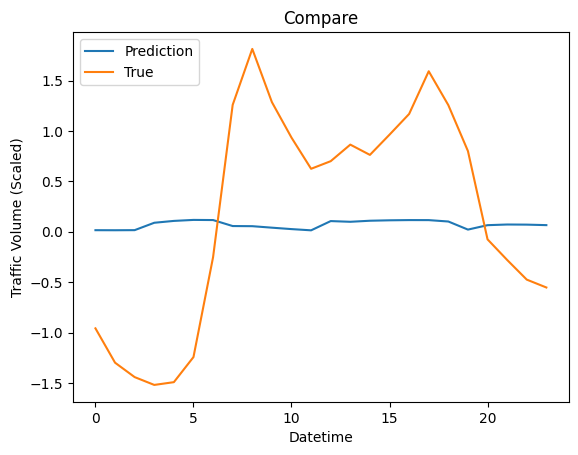

In [84]:
# Plot the training and validation accuracy
plt.plot(prediction)
plt.plot(true)
plt.title('Compare')
plt.xlabel('Datetime')
plt.ylabel('Traffic Volume (Scaled)')
plt.legend(['Prediction','True'], loc='upper left')
plt.show()

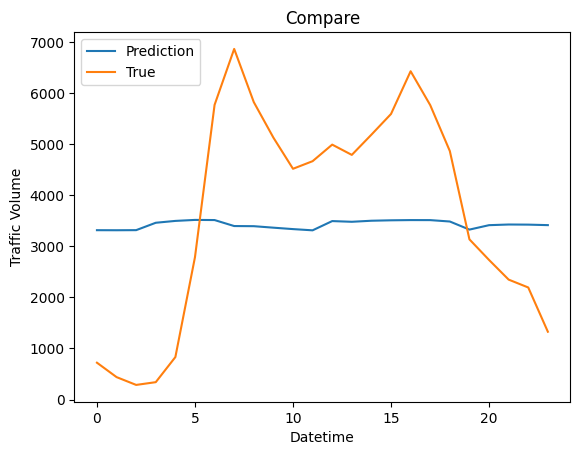

In [85]:
# Repeat the prediction for each feature (make sure the number of features is correct)
prediction_copies = np.repeat(prediction, df_processed.shape[1], axis=-1)  # Shape: (24, n_features)

# If you want to match the correct feature size, make sure prediction is reshaped correctly
prediction_copies = prediction_copies.reshape(-1, df_processed.shape[1])  # Reshape to (24, 71)

# Inverse transform the predictions
y_pred_future = scaler.inverse_transform(prediction_copies)[:,-1]  # Take the last column after inverse transform

true = df_processed['traffic_volume'][-n_hours_for_prediction:].values

# Plot the training and validation accuracy
plt.plot(y_pred_future)
plt.plot(true)
plt.title('Compare')
plt.xlabel('Datetime')
plt.ylabel('Traffic Volume')
plt.legend(['Prediction','True'], loc='upper left')
plt.show()


R2 value: 0.014318631200490484


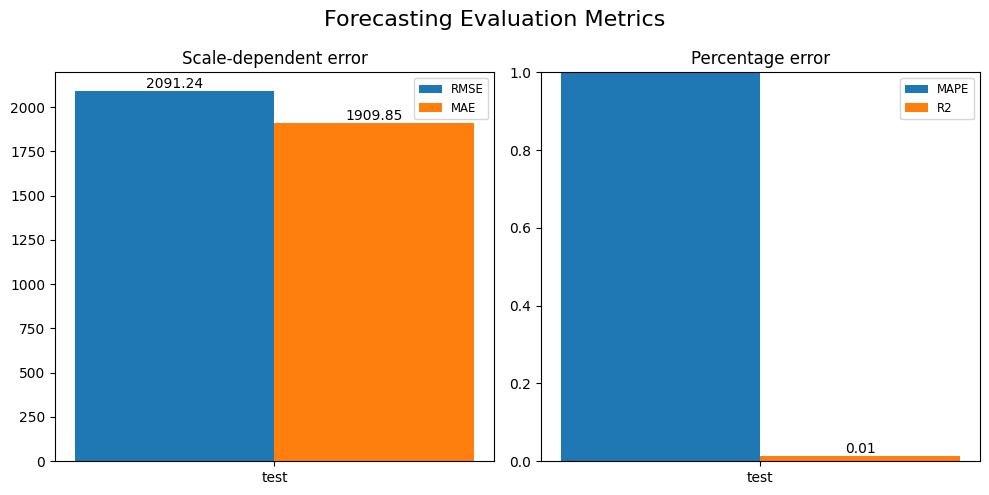

In [86]:
# Define the forecast measures
FORECAST_MEASURES = {
    "MSE": lambda actual, predicted: np.mean((actual - predicted) ** 2),
    "MAE": lambda actual, predicted: np.mean(abs(actual - predicted)),
    "MAPE": lambda actual, predicted: np.mean(abs((actual - predicted) / actual)),
    "R2": lambda actual, predicted: 1 - np.sum((actual - predicted) ** 2) / np.sum((actual - np.mean(actual)) ** 2) if np.sum((actual - np.mean(actual)) ** 2) != 0 else np.nan,  # Handle division by zero
}

# Compute evaluation metrics
ev1 = {
    "RMSE": [sqrt(FORECAST_MEASURES["MSE"](true, y_pred_future))],
    "MAE": [FORECAST_MEASURES["MAE"](true, y_pred_future)],
}
ev2 = {
    "MAPE": [FORECAST_MEASURES["MAPE"](true, y_pred_future)],
    "R2": [FORECAST_MEASURES["R2"](true, y_pred_future)],
}

# Check if R² is NaN
r2_value = FORECAST_MEASURES["R2"](true, y_pred_future)
print("R2 value:", r2_value)  # Check R² value in the console

# If R² is NaN, set it to a default value (e.g., 0)
if np.isnan(r2_value):
    r2_value = 0  # You can choose to set it to any default value
    print("R2 was NaN, setting it to 0")

# Update the evaluation metrics with the potentially adjusted R² value
ev2["R2"] = [r2_value]

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle("Forecasting Evaluation Metrics", fontsize=16)

# Plot scale-dependent error (e.g., RMSE, MAE)
group_labels = ["test"]
bar_labels = list(ev1.keys())
index = np.arange(len(group_labels))
bar_width = 0.8 / len(bar_labels)

axs[0].set_title("Scale-dependent error", fontsize=12)
axs[0].set_xlabel("")
axs[0].set_ylabel("")
axs[0].set_xticks(index + bar_width / 2)
axs[0].set_xticklabels(group_labels)

for i, label in enumerate(bar_labels):
    bar_values = ev1[label]
    values = axs[0].bar(
        index + i * bar_width,
        bar_values,
        width=bar_width,
        label=label
    )
    axs[0].bar_label(values, fmt="%.2f")
axs[0].legend(fontsize="small")

# Plot percentage error (e.g., MAPE, R2)
bar_labels = list(ev2.keys())
axs[1].set_title("Percentage error", fontsize=12)
axs[1].set_xlabel("")
axs[1].set_ylabel("")
axs[1].set_xticks(index + bar_width / 2)
axs[1].set_xticklabels(group_labels)
axs[1].set_ylim(0.0, 1.0)  # Percentage range

for i, label in enumerate(bar_labels):
    bar_values = ev2[label]
    values = axs[1].bar(
        index + i * bar_width,
        bar_values,
        width=bar_width,
        label=label
    )
    axs[1].bar_label(values, fmt="%.2f")
axs[1].legend(fontsize="small")

# Show the plots
plt.tight_layout()
plt.show()

## XGBoost

### Hyperparameter Tunning

In [25]:
# Define the XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Define the parameter grid (288 combinations)
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 6],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0],
    'gamma': [0, 0.1],
    'min_child_weight': [1, 3]
}

cv_strategy = KFold(n_splits=3, shuffle=True, random_state=42)

grid_search = GridSearchCV(
    estimator=xgb_reg,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=cv_strategy,  # Explicitly define KFold strategy
    verbose=1,
    n_jobs=-1
)

# Run the grid search on training data
grid_search.fit(X_train, Y_train)

# Get the best parameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Evaluate on test set
test_predictions = best_model.predict(X_test)
test_mse = mean_squared_error(Y_test, test_predictions)

print(f"Best Parameters: {best_params}")
print(f"Test MSE: {test_mse}")

Fitting 3 folds for each of 288 candidates, totalling 864 fits
Best Parameters: {'colsample_bytree': 1.0, 'gamma': 0.1, 'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.7}
Test MSE: 1.0986054836955634


Predictions

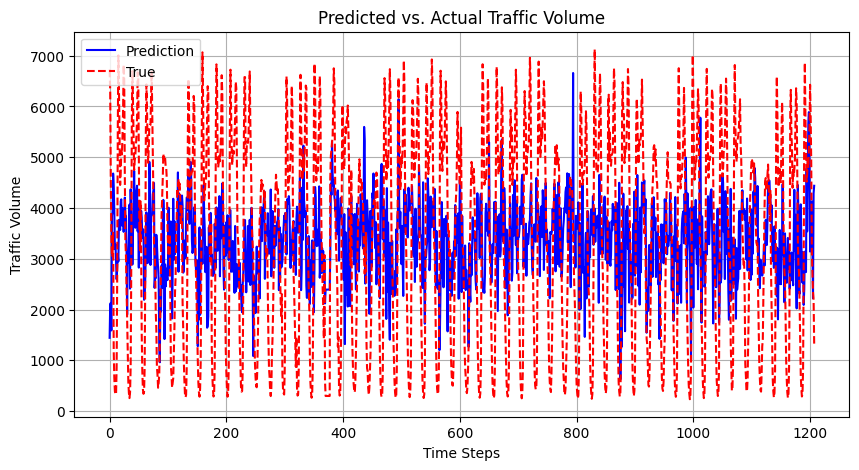

In [40]:
# Reshape to match scaler input format (1 feature per column)
y_pred = test_predictions.reshape(-1, 1)

# Inverse transform predictions (only the target column should be restored)
y_pred_future = scaler.inverse_transform(
    np.hstack([np.zeros((len(y_pred), df_processed.shape[1] - 1)), y_pred])
)[:, -1]  # Keep only the last column (traffic_volume)

# Get the actual values for comparison
true = df_processed['traffic_volume'][-len(y_pred_future):].values

# Plot the predictions vs actual values
plt.figure(figsize=(10, 5))
plt.plot(y_pred_future, label="Prediction", color='blue')
plt.plot(true, label="True", color='red', linestyle='dashed')
plt.title('Predicted vs. Actual Traffic Volume')
plt.xlabel('Time Steps')
plt.ylabel('Traffic Volume')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()

R2 value: -0.0308740144125057


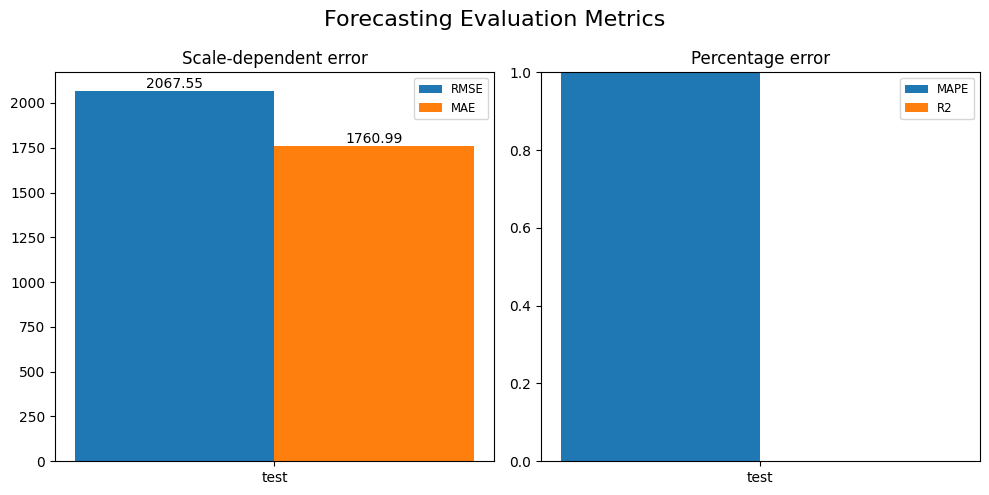

In [42]:
# Define the forecast measures
FORECAST_MEASURES = {
    "MSE": lambda actual, predicted: np.mean((actual - predicted) ** 2),
    "MAE": lambda actual, predicted: np.mean(abs(actual - predicted)),
    "MAPE": lambda actual, predicted: np.mean(abs((actual - predicted) / actual)),
    "R2": lambda actual, predicted: 1 - np.sum((actual - predicted) ** 2) / np.sum((actual - np.mean(actual)) ** 2),
}

# Compute evaluation metrics
ev1 = {
    "RMSE": [sqrt(FORECAST_MEASURES["MSE"](true, y_pred_future))],
    "MAE": [FORECAST_MEASURES["MAE"](true, y_pred_future)],
}
ev2 = {
    "MAPE": [FORECAST_MEASURES["MAPE"](true, y_pred_future)],
    "R2": [FORECAST_MEASURES["R2"](true, y_pred_future)],
}

r2_value = FORECAST_MEASURES["R2"](true, y_pred_future)
print("R2 value:", r2_value)  # Check R² value in the console

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle("Forecasting Evaluation Metrics", fontsize=16)

# Plot scale-dependent error (e.g., RMSE, MAE)
group_labels = ["test"]
bar_labels = list(ev1.keys())
index = np.arange(len(group_labels))
bar_width = 0.8 / len(bar_labels)

axs[0].set_title("Scale-dependent error", fontsize=12)
axs[0].set_xlabel("")
axs[0].set_ylabel("")
axs[0].set_xticks(index + bar_width / 2)
axs[0].set_xticklabels(group_labels)

for i, label in enumerate(bar_labels):
    bar_values = ev1[label]
    values = axs[0].bar(
        index + i * bar_width,
        bar_values,
        width=bar_width,
        label=label
    )
    axs[0].bar_label(values, fmt="%.2f")
axs[0].legend(fontsize="small")

# Plot percentage error (e.g., MAPE, R2)
bar_labels = list(ev2.keys())
axs[1].set_title("Percentage error", fontsize=12)
axs[1].set_xlabel("")
axs[1].set_ylabel("")
axs[1].set_xticks(index + bar_width / 2)
axs[1].set_xticklabels(group_labels)
axs[1].set_ylim(0.0, 1.0)  # Percentage range

for i, label in enumerate(bar_labels):
    bar_values = ev2[label]
    values = axs[1].bar(
        index + i * bar_width,
        bar_values,
        width=bar_width,
        label=label
    )
    axs[1].bar_label(values, fmt="%.2f")
axs[1].legend(fontsize="small")

# Show the plots
plt.tight_layout()
plt.show()

### Feature Importance

                  Feature  Importance
52  proximity shower rain    0.040127
26                   Mist    0.039435
9              clouds_all    0.038105
33           Sky is Clear    0.038041
25                   Haze    0.035948
..                    ...         ...
37                    fog    0.000000
18       Thanksgiving Day    0.000000
19           Veterans Day    0.000000
20   Washingtons Birthday    0.000000
69        very heavy rain    0.000000

[70 rows x 2 columns]


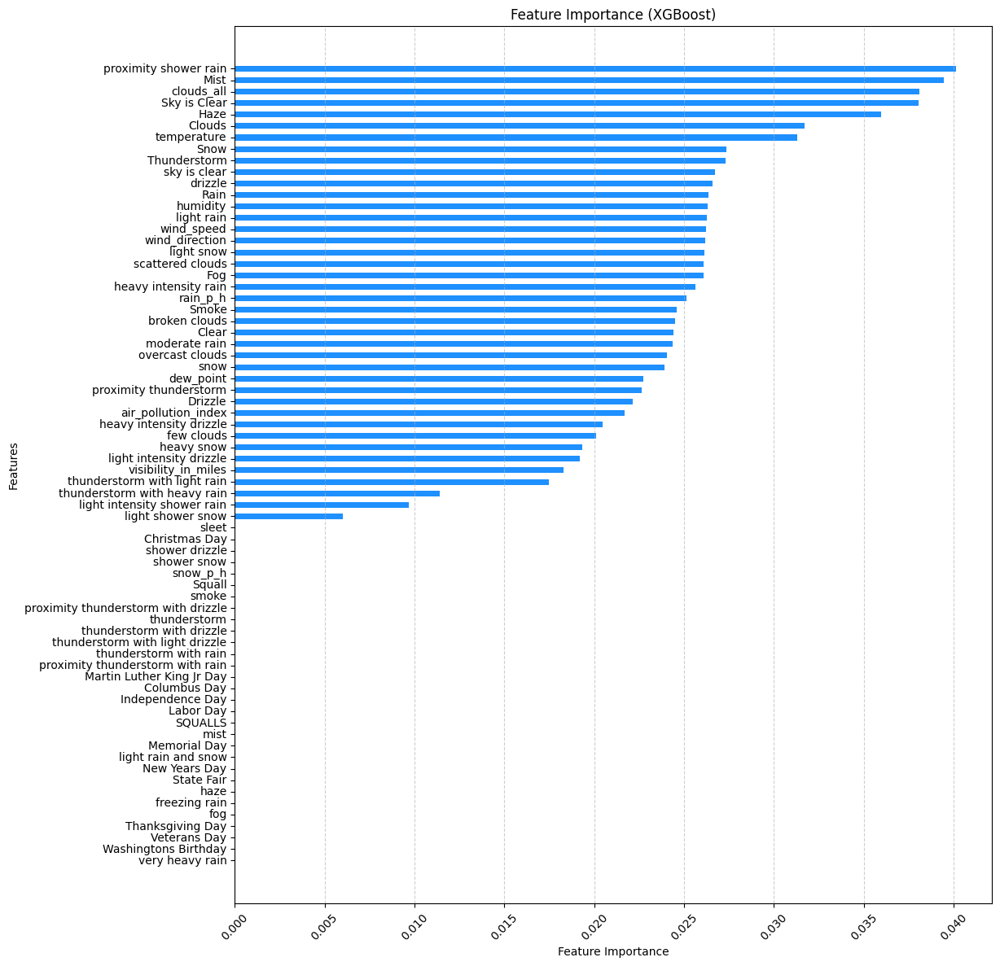

In [44]:
# Extract feature importances from the trained model
importances = best_model.feature_importances_

# Use df_processed.columns[:-1] to get feature names (assuming last column is the target)
feature_names = df_processed.columns[:-1]

# Create a DataFrame to hold feature names and their corresponding importance
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Display the sorted feature importance
print(feature_importance_df)

# Plot feature importances with better readability
plt.figure(figsize=(12, 14))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='dodgerblue', height=0.5)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importance (XGBoost)')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important at the top
plt.xticks(rotation=45)  # Rotate x-axis labels slightly if needed
plt.grid(axis='x', linestyle='--', alpha=0.6)

# Increase spacing between feature names on y-axis
plt.yticks(np.arange(len(feature_importance_df['Feature'])), feature_importance_df['Feature'], fontsize=12)  # Larger labels
plt.gca().set_yticklabels(feature_importance_df['Feature'], fontsize=10, verticalalignment='center', linespacing=10)  # More spacing

plt.show()

### Feature Selection

In [45]:
# Extract feature names based on importance order
sorted_features = feature_importance_df.sort_values(by="Importance", ascending=False)["Feature"].values

# Convert feature names to column indices
feature_indices = {feature: idx for idx, feature in enumerate(df_processed.columns[:-1])}  # Exclude target column

# Prepare variables to store results
selected_indices = []
rmse_scores = []

# Iterate through features in order of importance
for feature in sorted_features:
    selected_indices.append(feature_indices[feature])  # Add feature index

    # Subset data based on selected feature indices
    X_train_subset = X_train[:, selected_indices]
    X_test_subset = X_test[:, selected_indices]

    # Train the model
    model = xgb.XGBRegressor(**best_params)  # Using previously optimized parameters
    model.fit(X_train_subset, Y_train)

    # Predict on test set
    Y_pred = model.predict(X_test_subset)

    # Evaluate using RMSE
    rmse = np.sqrt(mean_squared_error(Y_test, Y_pred))
    rmse_scores.append(rmse)

    print(f"Features: {[sorted_features[i] for i in range(len(selected_indices))]} --> RMSE: {rmse:.4f}")

# Get the best performing feature subset
best_index = np.argmin(rmse_scores)
best_features = sorted_features[: best_index + 1]
best_rmse = rmse_scores[best_index]

print(f"\nBest feature subset ({len(best_features)} features) with RMSE: {best_rmse:.4f}")
print(best_features)

Features: ['proximity shower rain'] --> RMSE: 1.0369
Features: ['proximity shower rain', 'Mist'] --> RMSE: 1.0382
Features: ['proximity shower rain', 'Mist', 'clouds_all'] --> RMSE: 1.0135
Features: ['proximity shower rain', 'Mist', 'clouds_all', 'Sky is Clear'] --> RMSE: 1.0136
Features: ['proximity shower rain', 'Mist', 'clouds_all', 'Sky is Clear', 'Haze'] --> RMSE: 1.0115
Features: ['proximity shower rain', 'Mist', 'clouds_all', 'Sky is Clear', 'Haze', 'Clouds'] --> RMSE: 1.0079
Features: ['proximity shower rain', 'Mist', 'clouds_all', 'Sky is Clear', 'Haze', 'Clouds', 'temperature'] --> RMSE: 1.0527
Features: ['proximity shower rain', 'Mist', 'clouds_all', 'Sky is Clear', 'Haze', 'Clouds', 'temperature', 'Snow'] --> RMSE: 1.0477
Features: ['proximity shower rain', 'Mist', 'clouds_all', 'Sky is Clear', 'Haze', 'Clouds', 'temperature', 'Snow', 'Thunderstorm'] --> RMSE: 1.0460
Features: ['proximity shower rain', 'Mist', 'clouds_all', 'Sky is Clear', 'Haze', 'Clouds', 'temperature', '

### Final Training

In [46]:
# Get the indices of the best features
best_feature_indices = [feature_indices[feature] for feature in best_features]

# Subset the training and test data with only the best features
X_train_best = X_train[:, best_feature_indices]
X_test_best = X_test[:, best_feature_indices]

# Create the XGBoost model with the best hyperparameters
final_model = xgb.XGBRegressor(**best_params)

# Train the model on the selected features
final_model.fit(X_train_best, Y_train)

# Predict on test set
Y_pred_final = final_model.predict(X_test_best)

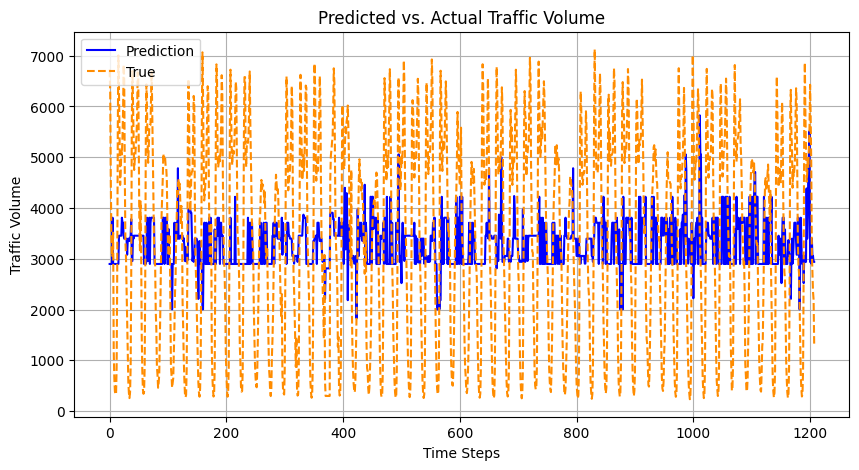

In [49]:
# Reshape to match scaler input format (1 feature per column)
y_pred = Y_pred_final.reshape(-1, 1)

# Inverse transform predictions (only the target column should be restored)
y_pred_future = scaler.inverse_transform(
    np.hstack([np.zeros((len(y_pred), df_processed.shape[1] - 1)), y_pred])
)[:, -1]  # Keep only the last column (traffic_volume)

# Get the actual values for comparison
true = df_processed['traffic_volume'][-len(y_pred_future):].values

# Plot the predictions vs actual values
plt.figure(figsize=(10, 5))
plt.plot(y_pred_future, label="Prediction", color='blue')
plt.plot(true, label="True", color='darkorange', linestyle='dashed')
plt.title('Predicted vs. Actual Traffic Volume')
plt.xlabel('Time Steps')
plt.ylabel('Traffic Volume')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()

R2 value: 0.046746927155420503


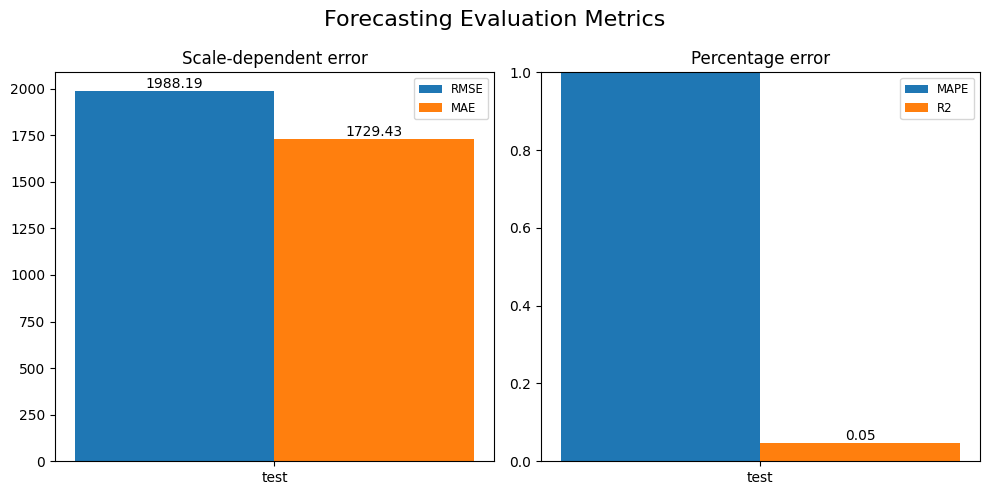

In [48]:
# Define the forecast measures
FORECAST_MEASURES = {
    "MSE": lambda actual, predicted: np.mean((actual - predicted) ** 2),
    "MAE": lambda actual, predicted: np.mean(abs(actual - predicted)),
    "MAPE": lambda actual, predicted: np.mean(abs((actual - predicted) / actual)),
    "R2": lambda actual, predicted: 1 - np.sum((actual - predicted) ** 2) / np.sum((actual - np.mean(actual)) ** 2),
}

# Compute evaluation metrics
ev1 = {
    "RMSE": [sqrt(FORECAST_MEASURES["MSE"](true, y_pred_future))],
    "MAE": [FORECAST_MEASURES["MAE"](true, y_pred_future)],
}
ev2 = {
    "MAPE": [FORECAST_MEASURES["MAPE"](true, y_pred_future)],
    "R2": [FORECAST_MEASURES["R2"](true, y_pred_future)],
}

r2_value = FORECAST_MEASURES["R2"](true, y_pred_future)
print("R2 value:", r2_value)  # Check R² value in the console

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle("Forecasting Evaluation Metrics", fontsize=16)

# Plot scale-dependent error (e.g., RMSE, MAE)
group_labels = ["test"]
bar_labels = list(ev1.keys())
index = np.arange(len(group_labels))
bar_width = 0.8 / len(bar_labels)

axs[0].set_title("Scale-dependent error", fontsize=12)
axs[0].set_xlabel("")
axs[0].set_ylabel("")
axs[0].set_xticks(index + bar_width / 2)
axs[0].set_xticklabels(group_labels)

for i, label in enumerate(bar_labels):
    bar_values = ev1[label]
    values = axs[0].bar(
        index + i * bar_width,
        bar_values,
        width=bar_width,
        label=label
    )
    axs[0].bar_label(values, fmt="%.2f")
axs[0].legend(fontsize="small")

# Plot percentage error (e.g., MAPE, R2)
bar_labels = list(ev2.keys())
axs[1].set_title("Percentage error", fontsize=12)
axs[1].set_xlabel("")
axs[1].set_ylabel("")
axs[1].set_xticks(index + bar_width / 2)
axs[1].set_xticklabels(group_labels)
axs[1].set_ylim(0.0, 1.0)  # Percentage range

for i, label in enumerate(bar_labels):
    bar_values = ev2[label]
    values = axs[1].bar(
        index + i * bar_width,
        bar_values,
        width=bar_width,
        label=label
    )
    axs[1].bar_label(values, fmt="%.2f")
axs[1].legend(fontsize="small")

# Show the plots
plt.tight_layout()
plt.show()